# NLP - Preprocessing and Classifying

## Part 2

### Situation:

Priya works at an international PR firm in the Europe division. Their largest client has offices in Ibiza, Madrid, and Las Palmas. She needs to keep her boss aware of current events and provide a weekly short list of articles concerning political events in Spain. The problem is, her Facebook newsfeed consistently shows her satire articles that people think are real truth! She wonders if she could automate the filtering process by using NLP to save her time...

### **Goal**: to internalize the steps, challenges, and methodology of text mining
- explore text analysis by hand
- apply text mining steps in Jupyter with Python libraries NLTK
- classify documents correctly

## Refresher on cleaning text
![gif](https://www.nyfa.edu/student-resources/wp-content/uploads/2014/10/furious-crazed-typing.gif)


In [10]:
import nltk
import sklearn
import urllib
import numpy as np
import pandas as pd
import string, re
from nltk.collocations import *
from nltk import FreqDist, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from sklearn.metrics import accuracy_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split  
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(0)


In [23]:
pd.set_option('display.max_columns', 200)

### Document statistics

### Document Frequency (DF)

$\begin{align}
 tf_{i,j} = \dfrac{n_{i,j}}{\displaystyle \sum_k n_{i,j} }
\end{align} $

### Inverse Document Frequency (IDF)

$\begin{align}
idf(w) = \log \dfrac{N}{df_t}
\end{align} $

### TF-IDF score

$ \begin{align}
w_{i,j} = tf_{i,j} \times \log \dfrac{N}{df_i} \\
tf_{i,j} = \text{number of occurences of } i \text{ in } j \\
df_i = \text{number of documents containing }   i \\
N = \text{total number of documents}
\end{align} $


### The from scratch method
![homemade](https://media2.giphy.com/media/LBZcXdG0eVBdK/giphy.gif?cid=3640f6095c2d7bb2526a424a4d97117c)


# Siiiiiiike!

## Yes, there is an easier way

![big deal](https://media0.giphy.com/media/xUA7aQOxkz00lvCAOQ/giphy.gif?cid=3640f6095c2d7c51772f47644d09cc8b)


### Next Steps:
- Create the tf-idf for the **whole** corpus of 12 articles
- What are _on average_ the most important words in the whole corpus?
- Add a column named "Target" to the dataset
- Target will be set to 1 or 0 if the article is "Politics" or "Not Politics"
- Do some exploratory analysis of the dataset
 - what are the average most important words for the "Politics" articles?
 - What are the average most important words for the "Not Politics"?

In [2]:
docZZZ = 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/'

In [3]:
alphabet = []
for letter in range(65, 91):
    alphabet.append(chr(letter))

list_of_letters = alphabet[:12]

In [6]:
url_list = []

In [7]:
for l in list_of_letters:
    url = docZZZ + l +'.txt'
    url_list.append(url)

In [8]:
url_list

['https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/A.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/B.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/C.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/D.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/E.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/F.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/G.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/H.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/I.txt',
 'https://raw.githubusercontent.com/aapeebles/text_examples/master/Text%20examples%20folder/J.txt',


In [12]:
stop_words = stopwords.words('english')

In [110]:
lemmatizer = WordNetLemmatizer()
# stemmer = SnowballStemmer("english")

In [14]:
# Example of how to implement a stemmer, but we won't be using stems for the classification

def clean_docs_STEM(_list):
    cleaned = []
    for i in _list:
        metamorph = urllib.request.urlopen(i).read()
        morph = metamorph.decode("utf-8")
        pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
        metamorph_tokens_raw = nltk.regexp_tokenize(morph, pattern)
        metamorph_tokens = [i.lower() for i in metamorph_tokens_raw]
        stop_words = stopwords.words('english')
        metamorph_tokens_stopped = [w for w in metamorph_tokens if not w in stop_words]
        meta_stemmed = [stemmer.stem(word) for word in metamorph_tokens_stopped]
        c = " ".join(str(x) for x in meta_stemmed)
        cleaned.append(c)
    return cleaned

In [15]:
def clean_docs_LEMM(_list):
    cleaned = []
    for i in _list:
        metamorph = urllib.request.urlopen(i).read()
        morph = metamorph.decode("utf-8")
        pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
        metamorph_tokens_raw = nltk.regexp_tokenize(morph, pattern)
        metamorph_tokens = [i.lower() for i in metamorph_tokens_raw]
        stop_words = stopwords.words('english')
        metamorph_tokens_stopped = [w for w in metamorph_tokens if not w in stop_words]
        meta_lemmed = [lemmatizer.lemmatize(word) for word in metamorph_tokens_stopped]
        c = " ".join(str(x) for x in meta_lemmed)
        cleaned.append(c)
    return cleaned

In [17]:
# docs_STEM = clean_docs_STEM(url_list)

docs_LEMM = clean_docs_LEMM(url_list)

# We will need this for later:
df_LEMM_articles = pd.DataFrame(docs_LEMM)

In [19]:
# vec = CountVectorizer()
tfidf = TfidfVectorizer()

In [22]:
X = tfidf.fit_transform(docs_LEMM)
df = pd.DataFrame(X.toarray(), columns=tfidf.get_feature_names())
#toarray necessary !!! be advised
#feature names -> df column names

In [36]:
# clean_docs_LEMM(url_list)[2]
# urllib.request.urlopen(url_list[2]).read()

In [23]:
target = ['POLITICS', 'POLITICS', 'Not_politics', 'POLITICS', 'POLITICS', 'Not_politics', 
    'Not_politics', 'POLITICS', 'Not_politics', 'Not_politics', 'POLITICS', 'Not_politics']

In [24]:
df['TARGET'] = target

In [25]:
df['TARGET'] = pd.get_dummies(df.TARGET, drop_first=True)

In [26]:
df.head()

,abate,abiyote,able,abstain,access,accessed,according,account,accurate,achieve,...,wood,word,world,would,xbox,year,yepp,yh,yorkshire,TARGET
0,0.0,0.0,0.0,0.05826,0.0,0.000000,0.000000,0.000000,0.0,0.05826,...,0.0,0.05826,0.000000,0.098535,0.000000,0.000000,0.000000,0.000000,0.000000,1
1,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.000000,0.0,0.00000,...,0.0,0.00000,0.049277,0.049277,0.000000,0.035520,0.000000,0.000000,0.000000,1
2,0.0,0.0,0.0,0.00000,0.0,0.000000,0.052772,0.000000,0.0,0.00000,...,0.0,0.00000,0.000000,0.069284,0.061447,0.099885,0.061447,0.061447,0.000000,0
3,0.0,0.0,0.0,0.00000,0.0,0.000000,0.000000,0.000000,0.0,0.00000,...,0.0,0.00000,0.000000,0.000000,0.000000,0.047389,0.000000,0.000000,0.116612,1
4,0.0,0.0,0.0,0.00000,0.0,0.063394,0.054443,0.048093,0.0,0.00000,...,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1


## Corpus Statistics 

How many non-zero elements are there?
- Adapt the code below, using the `df` version of the `response` object to replace everywhere below it says `DATA`
- Interpret the findings


In [28]:
features = df.iloc[:, :-1]

# target = df.TARGET

In [32]:
features.shape

(12, 866)

In [33]:
df

,abate,abiyote,able,abstain,access,accessed,according,account,accurate,achieve,...,wood,word,world,would,xbox,year,yepp,yh,yorkshire,TARGET
0,0.000000,0.000000,0.000000,0.05826,0.000000,0.000000,0.000000,0.000000,0.000000,0.05826,...,0.000000,0.05826,0.000000,0.098535,0.000000,0.000000,0.000000,0.000000,0.000000,1
1,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.049277,0.049277,0.000000,0.035520,0.000000,0.000000,0.000000,1
2,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.052772,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.000000,0.069284,0.061447,0.099885,0.061447,0.061447,0.000000,0
3,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.047389,0.000000,0.000000,0.116612,1
4,0.000000,0.000000,0.000000,0.00000,0.000000,0.063394,0.054443,0.048093,0.000000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
5,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.104439,0.104439,0.000000,0.075283,0.000000,0.000000,0.000000,0
6,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.251525,0.000000,0.000000,0.025901,0.000000,0.000000,0.000000,0
7,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.046725,0.000000,0.00000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.025030,0.000000,0.000000,0.000000,1
8,0.000000,0.000000,0.092736,0.00000,0.092736,0.000000,0.000000,0.035176,0.000000,0.00000,...,0.000000,0.00000,0.052282,0.026141,0.000000,0.018843,0.000000,0.000000,0.000000,0
9,0.081156,0.081156,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.00000,0.274521,0.000000,0.000000,0.065961,0.000000,0.000000,0.000000,0


In [31]:
# Edit code before running it

non_zero_cols = np.count_nonzero(features) / float(features.shape[0])
print("Average Number of Non-Zero Elements in Vectorized Articles: {}".format(non_zero_cols))

percent_sparse = 1 - (non_zero_cols / float(features.shape[1]))
print('Percentage of columns containing 0: {}'.format(percent_sparse))

Average Number of Non-Zero Elements in Vectorized Articles: 93.0
Percentage of columns containing 0: 0.8926096997690531


In [34]:
# adding for processing:

df_LEMM_articles['TARGET'] = target

df_LEMM_articles['TARGET'] = pd.get_dummies(df.TARGET, drop_first=True)

In [36]:
stop_words = stopwords.words('english')

def process_article(article):
    tokens = nltk.word_tokenize(article)
    stopwords_removed = [token.lower() for token in tokens if token.lower() not in stop_words]
    return stopwords_removed 

In [39]:
df_LEMM_articles.columns = ['body', 'TARGET']

In [40]:
processed_data = list(map(process_article, df_LEMM_articles))

In [41]:
# Separate the dataframe by target into two dataframes

df_freq_politics = df_LEMM_articles[df_LEMM_articles['TARGET']==1]

df_freq_not_politics = df_LEMM_articles[df_LEMM_articles['TARGET']==0]

In [42]:
# Set your data to the 'body'

data_politics = df_freq_politics['body']
data_not_politics = df_freq_not_politics['body']

In [43]:
pros_politics = list(map(process_article, data_politics))
pros_not_politics = list(map(process_article, data_not_politics))

In [44]:
# Total vocabulary for POLITICS

total_vocab_politics = set()
for article in pros_politics:
    total_vocab_politics.update(article)
    
len(total_vocab_politics)

485

In [45]:
# Total vocabulary for NOT POLITICS

total_vocab_NOT_politics = set()
for article in pros_not_politics:
    total_vocab_NOT_politics.update(article)
    
len(total_vocab_NOT_politics)

468

In [47]:
# How to flatten the data accordingly
# need to flatten the data for nltk!!!!

flat_list = [item for sublist in l for item in sublist]

flat_politics = [item for sublist in pros_politics for item in sublist]
flat_not_politics = [item for sublist in pros_not_politics for item in sublist]

In [48]:
politics_freq = FreqDist(flat_politics)
not_politics_freq = FreqDist(flat_not_politics)

In [49]:
politics_freq.most_common(20)

[('said', 15),
 ('arrested', 9),
 ('fbi', 8),
 ('computer', 7),
 ('would', 7),
 ('duchy', 7),
 ('immigration', 7),
 ('independent', 7),
 ('say', 6),
 ('e', 6),
 ('mail', 6),
 ('income', 6),
 ('prince', 6),
 ('law', 5),
 ('invention', 5),
 ('one', 5),
 ('two', 5),
 ('year', 5),
 ('public', 5),
 ('virus', 5)]

In [50]:
not_politics_freq.most_common(20)

[('world', 24),
 ("'s", 22),
 ('year', 12),
 ('record', 12),
 ('indoor', 12),
 ('olympic', 10),
 ('user', 10),
 ('gadget', 9),
 ('skype', 9),
 ('mark', 8),
 ('champion', 8),
 ('sec', 8),
 ('medallist', 8),
 ('bekele', 7),
 ('net', 6),
 ('call', 6),
 ('mobile', 5),
 ('would', 5),
 ('sullivan', 5),
 ('ireland', 5)]

# Classification

## Preprocessing

In [53]:
df = pd.read_csv('nlp_classification.csv')

In [54]:
df.head()

,body,target
0,Noting that the resignation of James Mattis as...,1
1,Desperate to unwind after months of nonstop wo...,1
2,"Nearly halfway through his presidential term, ...",1
3,Attempting to make amends for gross abuses of ...,1
4,Decrying the Senate’s resolution blaming the c...,1


In [55]:
data = df['body']
target = df['target']

In [56]:
sw_list = stopwords.words('english')
sw_list += list(string.punctuation)
sw_list += ["''", '""', '...', '``', '’', '“', '’', '”', '‘', '‘',
            'said', 'one', 'com', 'satirewire', '-', '–', '—', 'satirewire.com']
sw_set = set(sw_list)

In [57]:
def remove_punc(text):
    words = text.split()
    # remove punctuation from each word
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table) for w in words]
    removed = [w.lower() for w in stripped]
    return removed

In [61]:
def process_article(article):
    tokens = nltk.word_tokenize(article)
    stopwords_removed = [token.lower() for token in tokens if token.lower() not in sw_set]
    return stopwords_removed 

In [62]:
df.isna().sum()

body      0
target    0
dtype: int64

In [154]:
processed_data = list(map(process_article, data))

In [155]:
processed_data

[['noting',
  'resignation',
  'james',
  'mattis',
  'secretary',
  'defense',
  'marked',
  'ouster',
  'third',
  'top',
  'administration',
  'official',
  'less',
  'three',
  'weeks',
  'worried',
  'populace',
  'told',
  'reporters',
  'friday',
  'unsure',
  'many',
  'former',
  'trump',
  'staffers',
  'could',
  'safely',
  'reabsorb',
  'jesus',
  'take',
  'back',
  'assholes',
  'once—we',
  'need',
  'time',
  'process',
  'get',
  'next',
  '53-year-old',
  'gregory',
  'birch',
  'naperville',
  'il',
  'echoing',
  'concerns',
  '323',
  'million',
  'americans',
  'also',
  'noting',
  'country',
  'truly',
  'beginning',
  'reintegrate',
  'former',
  'national',
  'security',
  'advisor',
  'michael',
  'flynn',
  'sustainable',
  'say',
  'handle',
  'maybe',
  'two',
  'former',
  'members',
  'trump',
  'inner',
  'circle',
  'remainder',
  'year',
  'country',
  'limits.',
  'u.s.',
  'populace',
  'confirmed',
  'could',
  'handle',
  'pieces',
  'shit',
  't

In [161]:
nltk.pos_tag(processed_data[0])

[('noting', 'VBG'),
 ('resignation', 'NN'),
 ('james', 'NNS'),
 ('mattis', 'VBP'),
 ('secretary', 'NN'),
 ('defense', 'NN'),
 ('marked', 'VBD'),
 ('ouster', 'JJ'),
 ('third', 'JJ'),
 ('top', 'JJ'),
 ('administration', 'NN'),
 ('official', 'NN'),
 ('less', 'JJR'),
 ('three', 'CD'),
 ('weeks', 'NNS'),
 ('worried', 'VBD'),
 ('populace', 'NN'),
 ('told', 'VBD'),
 ('reporters', 'NNS'),
 ('friday', 'JJ'),
 ('unsure', 'JJ'),
 ('many', 'JJ'),
 ('former', 'JJ'),
 ('trump', 'NN'),
 ('staffers', 'NNS'),
 ('could', 'MD'),
 ('safely', 'RB'),
 ('reabsorb', 'VB'),
 ('jesus', 'NN'),
 ('take', 'VB'),
 ('back', 'RP'),
 ('assholes', 'NNS'),
 ('once—we', 'IN'),
 ('need', 'JJ'),
 ('time', 'NN'),
 ('process', 'NN'),
 ('get', 'VB'),
 ('next', 'JJ'),
 ('53-year-old', 'JJ'),
 ('gregory', 'NN'),
 ('birch', 'NN'),
 ('naperville', 'FW'),
 ('il', 'NN'),
 ('echoing', 'VBG'),
 ('concerns', 'NNS'),
 ('323', 'CD'),
 ('million', 'CD'),
 ('americans', 'NNS'),
 ('also', 'RB'),
 ('noting', 'VBG'),
 ('country', 'NN'),
 ('t

In [97]:
# mmll = set()
# mmll.update(['3', '2'])

In [98]:
# mmll

In [99]:
total_vocab = set()
for comment in processed_data:
    total_vocab.update(comment)
len(total_vocab)
#26669 words(i.e. features) in ds

26669

In [153]:
total_vocab

{'wti',
 'oaks',
 'considerations',
 'shampoo',
 'naturally',
 'skiers',
 'plantations',
 'seang',
 'monster',
 'enacted',
 'last…',
 'dkk',
 'famed',
 'emissaries',
 'ryanair',
 'permit',
 'kyrmen',
 'scars',
 'sisters',
 'inflation-proofed',
 'valdimir',
 'seduced',
 'asian',
 'collectivist',
 'deferred',
 'nigel',
 'eagerly',
 'ensnared',
 'dinners',
 'u.n.-supported',
 'jong-un',
 'leslie',
 '//burstforum.net/',
 'appeared',
 'waive',
 'physically',
 'weapons-related',
 'blubbed',
 'amazing',
 'joanna',
 'unexceptional',
 'weekends',
 'fool',
 'beach',
 'conjunction',
 'delving',
 'omitted',
 'desks',
 'emotional',
 'kuan',
 'ranging',
 'nicene',
 'warrant',
 'sliced',
 'wig',
 'boundaries.',
 'sumbitch',
 'lather',
 'universal',
 'unexpectedly',
 'intern',
 'bdsm',
 'de-facto',
 'supervise',
 'randomly',
 'drooled',
 'affiliate',
 '1995',
 'soppy',
 'examinations',
 'engineer/hr',
 'peroxide',
 'clever',
 'gassed',
 'explaining',
 'stéphan',
 'resign.',
 '39',
 'turnips',
 'ccordi

In [100]:
def join_list(listy): 
    ' '.join(listy)
        
# X = [' '.join(d) for d in processed_data]
# y = target
# X[3]

In [128]:
from nltk.stem.porter import *
from nltk.stem.snowball import SnowballStemmer
#stemmer = SnowballStemmer(language='english', ignore_stopwords=True)
stemmer = PorterStemmer()

In [129]:
stemmed_output = []

for listy in processed_data:
    stemmed = ' '.join([stemmer.stem(w) for w in listy])
    stemmed_output.append(stemmed)

In [130]:
stemmed_output

['note resign jame matti secretari defens mark ouster third top administr offici less three week worri populac told report friday unsur mani former trump staffer could safe reabsorb jesu take back asshol once—w need time process get next 53-year-old gregori birch napervil il echo concern 323 million american also note countri truli begin reintegr former nation secur advisor michael flynn sustain say handl mayb two former member trump inner circl remaind year countri limits. u.s. populac confirm could handl piec shit tri rejoin societi',
 'desper unwind month nonstop work investig russian influenc 2016 elect visibl exhaust special counsel robert mueller power phone friday order give break news concern probe holiday break last thing want spend time famili cascad push notif tell yet anoth russian oligarch polit oper highli place socialit use deutsch bank channel funnel money campaign former fbi director firmli hold phone power button ad want complet present moment celebr love one rumin me

In [111]:
lemmatized_output[:5]

['noting resignation james mattis secretary defense marked ouster third top administration official le three week worried populace told reporter friday unsure many former trump staffer could safely reabsorb jesus take back asshole once—we need time process get next 53-year-old gregory birch naperville il echoing concern 323 million american also noting country truly beginning reintegrate former national security advisor michael flynn sustainable say handle maybe two former member trump inner circle remainder year country limits. u.s. populace confirmed could handle piece shit trying rejoin society',
 'desperate unwind month nonstop work investigating russian influence 2016 election visibly exhausted special counsel robert mueller powered phone friday order give break news concerning probe holiday break last thing want spending time family cascade push notification telling yet another russian oligarch political operative highly placed socialite used deutsche bank channel funnel money ca

In [140]:
data1 = ""
for listy in processed_data:
    text = ' '.join([w for w in listy])
    data1 += text

import spacy
nlp = spacy.load('en_core_web_sm')
nlp.max_length = 93621305
doc = nlp(data1)
for token in doc:
    print(token, " ", token.lemma_)

noting   note
resignation   resignation
james   jame
mattis   mattis
secretary   secretary
defense   defense
marked   mark
ouster   ouster
third   third
top   top
administration   administration
official   official
less   less
three   three
weeks   week
worried   worry
populace   populace
told   tell
reporters   reporter
friday   friday
unsure   unsure
many   many
former   former
trump   trump
staffers   staffer
could   could
safely   safely
reabsorb   reabsorb
jesus   jesus
take   take
back   back
assholes   asshole
once   once
—   —
we   -PRON-
need   need
time   time
process   process
get   get
next   next
53-year   53-year
-   -
old   old
gregory   gregory
birch   birch
naperville   naperville
il   il
echoing   echo
concerns   concern
323   323
million   million
americans   american
also   also
noting   note
country   country
truly   truly
beginning   begin
reintegrate   reintegrate
former   former
national   national
security   security
advisor   advisor
michael   michael
flynn   

lifelong   lifelong
dream   dream
bathe   bathe
college   college
football   football
team   team
.   .
harper   harper
added   add
finally   finally
getting   get
shower   shower
notre   notre
dame   dame
made   make
even   even
special   special
entire   entire
family   family
witnessannouncement   witnessannouncement
perceived   perceive
major   major
reassurance   reassurance
parents   parent
children   child
low   low
cognitive   cognitive
abilities   ability
subpar   subpar
reasoning   reasoning
skills   skill
simply   simply
top   top
national   national
pediatric   pediatric
health   health
experts   expert
released   release
report   report
monday   monday
claims   claim
full   full
-   -
contact   contact
football   football
poses   pose
little   little
risk   risk
children   child
whose   whose
brains   brain
already   already
work   work
well   well
tackle   tackle
football   football
long   long
known   know
high   high
-   -
risk   risk
sport   sport
particularly   partic

headphones   headphone
six   six
-   -
hour   hour
loop   loop
nothing   nothing
plug   plug
download   download
never   never
listen   listen
know   know
way   way
again   again
.   .
bose   bose
also   also
teased   tease
upcoming   upcoming
release   release
new   new
4,000   4,000
home   home
entertainment   entertainment
system   system
optimized   optimize
knowfresh   knowfresh
victory   victory
last   last
night   night
finale   finale
voice   voice
16-year   16-year
-   -
old   old
country   country
singer   singer
chevel   chevel
shepherd   shepherd
told   tell
reporters   reporter
wednesday   wednesday
excited   excite
use   use
50   50
chili   chili
gift   gift
card   card
received   receive
winning   win
televised   televise
singing   singing
competition   competition
months   month
hard   hard
work   work
win   win
50   50
bucks   buck
spend   spend
anything   anything
want   want
chili   chili
s   s
—   —
it   -PRON-
truly   truly
dream   dream
come   come
true   true
she

get   get
tired   tired
riot   riot
elites   elite
2019   2019
probably   probably
quivering   quiver
boots   boot
gets   get
bad   bad
simply   simply
exit   exit
new   new
zealand   zealand
wherever   wherever
else   else
prepared   prepare
major   major
weakness   weakness
elites   elite
always   always
encounter   encounter
numbers   number
untermensch   untermensch
stock   stock
market   market
place   place
much   much
terror   terror
naturally   naturally
keep   keep
falling   fall
2019   2019
possibly   possibly
40   40
-   -
60   60
correction   correction
planned   plan
holding   hold
stocks   stock
sadly   sadly
fool   fool
sense   sense
whatsoever   whatsoever
fact   fact
deserve   deserve
every   every
bit   bit
get   get
take   take
money   money
earlier   earlier
artificially   artificially
pumped   pump
top   top
also   also
ebola   ebola
look   look
forward   forward
2019   2019
increases   increase
hold   hold
africa   africa
much   much
chagrin   chagrin
west   west


mary   mary
looked   look
like   like
angel   angel
actually   actually
demon   demon
god   god
emissaries   emissary
tried   try
justify   justify
rape   rape
saying   say
okay   okay
violated   violate
god   god
pulsating   pulsate
phallus   phallus
scriptures   scripture
reveal   reveal
god   god
large   large
member   member
shoots   shoot
holy   holy
sperm   sperm
fancies   fancy
ejaculates   ejaculate
spirit   spirit
holy   holy
ghost   ghost
shoot   shoot
force   force
holy   holy
semen   semen
lights   light
darkness   darkness
sparkling   sparkle
like   like
thousand   thousand
fireworks   firework
mary   mary
would   would
felt   feel
impregnated   impregnate
without   without
consent   consent
possibly   possibly
great   great
confusion   confusion
coupled   couple
pain   pain
pierced   pierce
violently   violently
holy   holy
spear   spear
god   god
thrusting   thrust
thrusting   thrust
great   great
holy   holy
climax   climax
.   .
story   story
nativity   nativity
taught

rules   rule
information   information
expenses   expense
according   accord
bbc   bbc
ukgc   ukgc
also   also
consulted   consult
remote   remote
gambling   gambling
association   association
rga   rga
two   two
approaches   approach
enhancing   enhance
self   self
-   -
exclusion   exclusion
systems   system
gamstop   gamstop
official   official
national   national
platform   platform
going   go
include   include
online   online
casinos   casino
allow   allow
gamblers   gambler
control   control
experience   experience
additionally   additionally
british   british
may   may
use   use
gambleaware   gambleaware
independent   independent
charity   charity
organization   organization
focused   focus
popularizing   popularize
responsible   responsible
gambling   gambling
regulating   regulating
advertisements   advertisement
cooperation   cooperation
advertising   advertising
standards   standard
authority   authority
asa   asa
commission   commission
bans   ban
ads   ad
create   create
f

casino   casino
operators   operator
following   follow
counties   county
canada   canada
lithuania   lithuania
norway   norway
czech   czech
republic   republic
others   other
clear   clear
netent   netent
improving   improve
products   product
spreads   spread
influence   influence
technical   technical
innovations   innovation
beginning   begin
2018   2018
provider   provider
introduced   introduce
three   three
new   new
updates   update
live   live
casino   casino
first   first
live   live
beyond   beyond
live   live
developed   develop
cooperation   cooperation
already   already
mentioned   mention
mr   mr
green   green
presented   present
ice   ice
totally   totally
gaming   game
gamblers   gambler
enjoy   enjoy
multi   multi
-   -
table   table
system   system
extra   extra
view   view
angles   angle
additional   additional
cameras   camera
smooth   smooth
interface   interface
earlier   early
netent   netent
launched   launch
noteworthy   noteworthy
innovations   innovation
sp

declares   declare
points   point
1986   1986
datsun   datsun
ere   ere
got   get
good   good
europe   europe
last   last
week   week
sold   sell
chap   chap
called   call
juncker   juncker
thing   thing
go   go
12   12
mph   mph
break   break
sweat   sweat
dodgy   dodgy
theresa   theresa
points   point
proudly   proudly
supermarket   supermarket
cart   cart
lidl   lidl
look   look
beauty   beauty
pointing   point
beaten   beat
mazda   mazda
circa   circa
1987   1987
still   still
old   old
trim   trim
cigarette   cigarette
butts   butt
ashtray   ashtray
look   look
closely   closely
see   see
semen   semen
stains   stain
back   back
offer   offer
better   good
hurry   hurry
non   non
existent   existent
customers   customer
coming   come
soon   soon
check   check
make   make
purchase   purchase
quick   quick
proud   proud
dodgy   dodgy
theresa   theresa
quips   quip
despite   despite
chief   chief
sales   sale
person   person
lot   lot
useless   useless
theresa   theresa
able   able
s

like   like
connect   connect
humans   human
looking   look
eye   eye
consciously   consciously
aware   aware
paying   pay
attention   attention
connecting   connect
whatever   whatev
around   around
time   time
interacting   interact
people   people
actual   actual
self   self
whereas   whereas
mobile   mobile
phone   phone
zombie   zombie
constantly   constantly
thinking   think
phone   phone
latest   late
facebook   facebook
comment   comment
8   8
people   people
break   break
away   away
hive   hive
mind   mind
digital   digital
prison   prison
controllers   controller
lose   lose
war   war
imprison   imprison
dumb   dumb
control   control
humanity   humanity
urge   urge
dear   dear
reader   reader
please   please
move   move
forward   forward
reclaim   reclaim
true   true
creative   creative
humanity   humanity
ability   ability
think   think
break   break
free   free
live   live
happy   happy
existence   existence
away   away
created   create
kill   kill
mind   mind
spirit   spi

wall   wall
street   street
far   far
gonechristmas   gonechristmas
celebrates   celebrate
birth   birth
male   male
child   child
given   give
gifts   gift
three   three
male   male
kings   king
manger   manger
born   bear
owned   own
man   man
pure   pure
sexism   sexism
female   female
present   present
mother   mother
jesus   jesus
impregnated   impregnate
patriarchal   patriarchal
god   god
masculine   masculine
metoo   metoo
supporter   supporter
loretta   loretta
atmos   atmo
told   tell
huffington   huffington
post   post
another   another
metoo   metoo
activist   activist
went   go
far   far
saying   say
christmas   christma
evil   evil
male   male
babies   baby
aborted   abort
birth   birth
celebrate   celebrate
another   another
male   male
born   bear
world   world
metoo   metoo
anger   anger
spreading   spread
across   across
twitter   twitter
similar   similar
sentiment   sentiment
hashtag   hashtag
banxmasmetoo   banxmasmetoo
trending   trend
outrage   outrage
tradition 

offered   offer
trade   trade
deal   deal
trump   trump
usa   usa
months   month
ago   ago
dishonest   dishonest
pm   pm
also   also
caught   catch
giving   give
knighthood   knighthood
cronies   crony
gain   gain
support   support
deal   deal
dishonourable   dishonourable
theresa   theresa
may   may
disgrace   disgrace
must   must
forced   force
resign   resign
loses   lose
vote   vote
brino   brino
parliament   parliament
two   two
weeks   week
timeyep   timeyep
called   call
battle   battle
britain   britain
left   leave
hitler   hitler
luftwaffe   luftwaffe
almighty   almighty
bloody   bloody
nose   nose
clean   clean
deal   deal
brexit   brexit
comes   come
crunch   crunch
brits   brit
fight   fight
save   save
britain   britain
eu   eu
shown   show
extreme   extreme
disrespect   disrespect
gloated   gloat
misfortune   misfortune
stolen   steal
fish   fish
bullied   bully
country   country
long   long
whilst   whilst
making   make
pay   pay
nose   nose
indignity   indignity
going 

personality   personality
humour   humour
injected   inject
directly   directly
brain   brain
reuters   reuter
reported   report
medical   medical
treatment   treatment
latest   late
trend   trend
amongst   amongst
germans   german
sadly   sadly
devoid   devoid
form   form
humour   humour
live   live
lives   life
mainly   mainly
technical   technical
manner   manner
professor   professor
arnold   arnold
weinglauss   weinglauss
performed   perform
procedure   procedure
numerous   numerous
times   time
officiate   officiate
process   process
take   take
three   three
hours   hour
surgery   surgery
time   time
procedure   procedure
rather   rather
complex   complex
slip   slip
induce   induce
deeper   deep
state   state
catatonic   catatonic
depression   depression
normal   normal
state   state
chancellor   chancellor
infuse   infuse
ventral   ventral
striatum   striatum
within   within
temporal   temporal
lobe   lobe
area   area
invigorate   invigorate
region   region
injecting   inject


good   good
toaster   toaster
please   please
put   put
face   face
operation   operation
guaranteed   guarantee
explode   explode
weeks   week
usage   usage
money   money
back   back
replacement   replacement
guaranteed   guarantee
3   3
burnio   burnio
toaster   toaster
£   £
12.99   12.99
sullies   sully
toaster   toaster
name   name
suggests   suggest
burns   burn
everything   everything
crisp   crisp
within   within
five   five
metre   metre
radius   radius
definitely   definitely
top   top
range   range
chinese   chinese
engineering   engineering
reduce   reduce
kitchen   kitchen
smoking   smoke
wreck   wreck
time   time
christmas   christma
throw   throw
turkey   turkey
fast   fast
cooking   cook
4   4
lingwao   lingwao
toaster   toaster
£   £
2.99   2.99
pick   pick
black   black
friday   friday
sale   sale
lucky   lucky
owner   owner
magical   magical
piece   piece
equipment   equipment
cheap   cheap
dangerous   dangerous
toaster   toaster
sent   send
testing   testing
wires  

cranks   crank
try   try
repair   repair
mrs   mrs
may   may
point   point
tries   try
dancing   dance
leg   leg
falls   fall
bid   bid
farewell   farewell
flee   flee
downing   down
street   street
traumatised   traumatise
witnessedn   witnessedn
2018   2018
epica   epica
awards   award
grand   grand
prix   prix
winners   winner
united   unite
states   state
italy   italy
ireland   ireland
germany   germany
japan   japan
•   •
network   network
year   year
mccann   mccann
worldgroup   worldgroup
•   •
agency   agency
year   year
forsman   forsman
bodenfors   bodenfor
•   •
production   production
company   company
year   year
blur   blur
films   film
grand   grand
prix   prix
•   •
responsibility   responsibility
price   price
lives   life
march   march
lives   life
mccann   mccann
ny   ny
•   •
alternative   alternative
go   go
fake   fake
diesel   diesel
publicis   publicis
italy   italy
•   •
design   design
la   la
original   original
mayor   mayor
fund   fund
los   los
angeles   

better   good
bad   bad
deal   deal
would   would
certainly   certainly
think   think
theresa   theresa
may   may
crew   crew
shrivel   shrivel
kowtow   kowtow
every   every
brussels   brussel
belch   belch
constrained   constrain
britain   britain
left   leave
whimpering   whimpering
bitch   bitch
end   end
leash   leash
men   man
women   woman
die   die
two   two
world   world
wars   war
certainly   certainly
subservient   subservient
nation   nation
unable   unable
make   make
laws   law
unable   unable
make   make
trade   trade
deals   deal
unable   unable
get   get
fucking   fucking
bollocks   bollock
voted   vote
june   june
23   23
2016   2016
democratic   democratic
referendum   referendum
leave   leave
customs   custom
union   union
leave   leave
ecj   ecj
leave   leave
single   single
market   market
ultimately   ultimately
leave   leave
eu   eu
completely   completely
half   half
measures   measure
half   half
foot   foot
half   half
none   none
eu   eu
referendum   referend

place   place
assures   assure
smaller   small
amount   amount
returns   return
horse   horse
finishes   finish
top   top
places   place
race   race
guaranteeing   guarantee
something   something
even   even
horse   horse
unable   unable
win   win
outright   outright
following   follow
simple   simple
rules   rule
able   able
heighten   heighten
bet   bet
chances   chance
winning   win
worth   worth
taking   take
extra   extra
steps   step
offering   offer
horse   horse
tips   tip
strengthen   strengthen
bet   bet
also   also
potentially   potentially
increase   increase
winnings   winning
could   could
get   get
bet   bet
lands   land
favour   favour
finding   finding
horse   horse
tips   tip
bet   bet
internet   internet
packed   pack
full   full
places   place
find   find
reliable   reliable
horse   horse
racing   racing
tips   tip
good   good
ones   one
picked   pick
way   way
makes   make
use   use
statistics   statistic
form   form
rather   rather
randomly   randomly
picking   pi

✔   ✔
sarahksilverman   sarahksilverman
wake   wake
join   join
resistance   resistance
military   military
w   w
us   -PRON-
fascists   fascist
get   get
overthrown   overthrow
mad   mad
king   king
handlers   handler
go   go
bye   bye
bye   bye
https   https
//   //
twitter.com/jeffmueller/st   twitter.com/jeffmueller/st
atus/826920269491085317   atus/826920269491085317
…   …
9,017   9,017
11:41   11:41
pm   pm
feb   feb
1   1
2017   2017
twitter   twitter
ads   ad
info   info
privacy   privacy
16.8k   16.8k
people   people
talking   talk
rhetoric   rhetoric
used   use
socialist   socialist
marxist   marxist
hollywood   hollywood
celebrities   celebrity
urge   urge
people   people
take   take
action   action
way   way
possible   possible
end   end
unhinged   unhinge
individuals   individual
take   take
words   word
literally   literally
goes   go
democrat   democrat
politicians   politician
like   like
maxine   maxine
waters   water
urged   urge
violent   violent
opposition   opposit

clubs   club
options   option
springs   spring
mind   mind
fk   fk
dukla   dukla
prague   prague
arguably   arguably
made   make
famous   famous
thanks   thank
song   song
british   british
band   band
half   half
man   man
half   half
biscuit   biscuit
released   release
modest   modest
1986   1986
hit   hit
wanted   want
dukla   dukla
prague   prague
away   away
kit   kit
arguably   arguably
soccer   soccer
hipsters   hipster
visit   visit
watch   watch
dukla   dukla
unfortunately   unfortunately
quite   quite
would   would
hand   hand
due   due
fact   fact
club   club
original   original
guise   guise
ceased   cease
exist   exist
1996   1996
merged   merge
fc   fc
pribram   pribram
choice   choice
either   either
follow   follow
original   original
dukla   dukla
prague   prague
new   new
legacy   legacy
called   call
1   1
fk   fk
pribram   pribram
however   however
would   would
mean   mean
dropping   drop
second   second
tier   tier
czech   czech
soccer   soccer
hand   hand
feel  

frankly   frankly
unnerving   unnerving
mrs   mrs
.   .
may   may
says   say
thing   thing
complete   complete
opposite   opposite
thing   thing
whilst   whilst
still   still
saying   say
honouring   honour
people   people
blatant   blatant
lie   lie
lies   lie
damaging   damaging
integrity   integrity
integrity   integrity
party   party
whole   whole
theresa   theresa
may   may
remainer   remainer
chancellor   chancellor
philip   philip
hammond   hammond
along   along
remainer   remainer
brexit   brexit
adviser   adviser
olly   olly
robbins   robbin
lying   lie
blatantly   blatantly
brexit   brexit
voters   voter
daily   daily
prepare   prepare
push   push
chequers   chequer
brino   brino
deal   deal
doom   doom
britain   britain
become   become
vassal   vassal
state   state
eu   eu
indefinitely   indefinitely
without   without
legal   legal
way   way
customs   custom
union   union
vote   vote
conservative   conservative
party   party
2020   2020
remainer   remainer
yes   yes
get   ge

united   united
states   state
tanks   tank
apcs   apcs
support   support
vehicles   vehicle
military   military
troops   troop
getting   get
ready   ready
trump   trump
going   go
held   hold
ransom   ransom
demands   demand
organisers   organiser
caravan   caravan
making   make
way   way
us   -PRON-
honduras   hondura
already   already
threatened   threaten
cut   cut
funds   fund
aid   aid
america   america
throws   throw
away   away
year   year
latin   latin
american   american
nations   nation
money   money
siphoned   siphon
swiss   swiss
accounts   account
corrupt   corrupt
officials   official
delivered   deliver
people   people
aid   aid
kal   kal
rightwinglawman   rightwinglawman
paying   pay
trucks   truck
feeding   feed
people   people
group   group
rumored   rumor
around   around
15k   15k
estimates   estimate
50k   50k
border   border
's   's
really   really
100k   100k
successfully   successfully
get   get
stop   stop
million   million
month   month
later   later
503   503

boss   boss
happy   happy
fires   fire
breathe   breathe
sigh   sigh
relief   relief
maybe   maybe
time   time
queue   queue
days   day
gp   gp
office   office
beg   beg
put   put
waiting   waiting
list   list
mobile   mobile
buggy   buggy
drive   drive
everywhere   everywhere
lazy   lazy
walk   walk
anymore   anymore
okay   okay
though   though
wake   wake
haw   haw
haw   haw
hammond   hammond
told   tell
end   end
austerity   austerity
everything   everything
ok   ok
britain   britain
saved   save
hurrah   hurrah
pop   pop
pills   pill
jam   jam
another   another
needle   needle
ankle   ankle
mist   mist
rises   rise
comforting   comforting
opioid   opioid
blanket   blanket
covers   cover
grey   grey
freezing   freeze
rat   rat
infested   infested
home   home
words   word
go   go
frazzled   frazzled
mind   mind
…   …
austerity   austerity
..   ..
over   over
…   …
austerity   austerity
…   …
over   over
…   …
auster   auster
…   …
thing   thing
theresa   theresa
may   may
chequers   

tying   tie
eu   eu
customs   custom
union   union
ecj   ecj
single   single
market   market
indefinitely   indefinitely
something   something
would   would
conservative   conservative
manifesto   manifesto
goes   go
eu   eu
referendum   referendum
voter   voter
voted   vote
leave   leave
eu   eu
june   june
23   23
2016   2016
theresa   theresa
may   may
effectively   effectively
hijacked   hijack
brexit   brexit
ignored   ignore
people   people
vote   vote
created   create
brexit   brexit
name   name
besides   besides
serious   serious
discrepancies   discrepancy
like   like
extending   extend
transition   transition
period   period
years   year
months   month
may   may
capitulated   capitulated
every   every
demand   demand
eu   eu
thrown   throw
theresa   theresa
may   may
controlled   control
olly   olly
robbins   robbin
key   key
remainer   remainer
chancellor   chancellor
haw   haw
haw   haw
hammond   hammond
another   another
key   key
remainer   remainer
well   well
cabinet   

coral   coral
-   -
eclipse   eclipse
dante   dante
stakes   stake
pecking   peck
order   order
find   find
crystal   crystal
ocean   ocean
sir   sir
michael   michael
stoute   stoute
6/1   6/1
winner   winner
group   group
2   2
hardwicke   hardwicke
stakes   stake
ascot   ascot
summer   summer
finding   find
good   good
king   king
george   george
vi   vi
queen   queen
elizabeth   elizabeth
stakes   stake
september   september
stakes   stake
ending   end
3   3
½   ½
lengths   length
enable   enable
latter   latter
price   price
trusting   trust
stake   stake
talismatic   talismatic
stands   stand
easy   easy
love   love
12/1   12/1
five   five
-   -
year   year
-   -
old   old
colt   colt
two   two
tries   try
since   since
august   august
form   form
shows   show
http   http
//www.attheraces.com   //www.attheraces.com
/   /
form   form
/   /
horse   horse
/   /
talismanic   talismanic
/   /
gb/2890619   gb/2890619
last   last
success   success
easily   easily
overlooked   overlook
c

obviously   obviously
casino   casino
needs   need
profit   profit
order   order
motivated   motivate
operate   operate
business   business
however   however
casinos   casino
generous   generous
others   other
always   always
remember   remember
higher   high
payout   payout
percentage   percentage
results   result
greater   great
jackpots   jackpot
winning   win
chances   chance
depending   depend
game   game
money   money
left   leave
players   player
amount   amount
jackpot   jackpot
obviously   obviously
gamble   gamble
must   must
motivation   motivation
games   game
fixed   fix
jackpot   jackpot
others   other
would   would
increase   increase
time   time
progressive   progressive
jackpot   jackpot
betting   bet
lower   low
jackpot   jackpot
less   less
attractive   attractive
idea   idea
keep   keep
mind   mind
higher   high
jackpots   jackpot
attract   attract
players   player
depending   depend
game   game
winning   win
chances   chance
individual   individual
might   might
de

research   research
brought   bring
light   light
coincidence   coincidence
clothing   clothing
worn   worn
hipsters   hipster
happens   happen
exact   exact
uniform   uniform
lumberjacks   lumberjack
wear   wear
work   work
day   day
hipsters   hipster
unemployed   unemployed
lumberjacks   lumberjack
left   leave
work   work
due   due
shift   shift
digital   digital
age   age
people   people
need   need
primitive   primitive
tools   tool
notebooks   notebook
paper   paper
printers   printer
notes   note
apps   app
mobiles   mobil
emails   email
even   even
need   need
books   book
since   since
e   e
-   -
readers   reader
like   like
amazon   amazon
kindle   kindle
en   en
vogue   vogue
letting   let
everyone   everyone
everywhere   everywhere
squint   squint
screens   screen
get   get
harry   harry
potter   potter
fix   fix
oh   oh
-   -
so   so
-   -
scandalous   scandalous
fanfic   fanfic
turned   turn
light   light
bdsm   bdsm
franchise   franchise
fiction   fiction
books   book


away   away
constitution   constitution
free   free
society   society
dissolved   dissolve
.   .
founding   found
father   father
benjamin   benjamin
franklin   franklin
want   want
children   child
children   child
grandchildren   grandchild
live   live
totalitarian   totalitarian
communist   communist
dictatorship   dictatorship
freedom   freedom
speech   speech
freedom   freedom
expression   expression
must   must
act   act
must   must
make   make
voice   voice
heard   hear
vote   vote
subscribe   subscribe
socialist   socialist
communist   communist
ideologies   ideology
office   office
deny   deny
socialist   socialist
power   power
using   use
services   service
boycott   boycott
deny   deny
freedom   freedom
censoring   censoring
must   must
ultimately   ultimately
help   help
wish   wish
change   change
communistic   communistic
creep   creep
setting   set
western   western
democratic   democratic
free   free
society   society
fighting   fighting
might   may
get   get
rid   rid

move   move
online   online
smartphone   smartphone
screen   screen
watching   watch
listening   listen
home   home
many   many
today   today
turn   turn
smartphones   smartphon
second   second
inevitable   inevitable
soon   soon
accept   accept
facebook   facebook
portal   portal
devices   device
homes   home
well   well
matter   matter
time   time
took   take
scribbling   scribble
pad   pad
knee   knee
pushed   push
back   back
chair   chair
get   get
far   far
away   away
telescreen   telescreen
possible   possible
keep   keep
face   face
expressionless   expressionless
difficult   difficult
even   even
breathing   breathing
could   could
controlled   control
effort   effort
could   could
control   control
beating   beat
heart   heart
telescreen   telescreen
quite   quite
delicate   delicate
enough   enough
pick   pick
doubt   doubt
future   future
reason   reason
recall   recall
authorities   authority
simply   simply
able   able
pinpoint   pinpoint
thing   thing
home   home
use   

-   -
to   to
-   -
day   day
operations   operation
handled   handle
secretary   secretary
-   -
general   general
juergen   juergen
stock   stock
agency   agency
plan   plan
looking   look
president   president
scared   scar
chinese   chinese
little   little
power   power
china   china
free   free
air   air
ticket   ticket
china   china
competition   competition
daily   daily
squib   squib
giving   give
away   away
10   10
way   way
tickets   ticket
lucky   lucky
readers   reader
answer   answer
question   question
many   many
people   people
tortured   torture
executed   execute
china   china
within   within
last   last
year   year
without   without
trial   trial
345,000   345,000
b   b
498,000   498,000
c   c
560,000   560,000
answers   answer
postcard   postcard
ds   d
china   china
human   human
rights   right
competition   competition
room   room
101   101
london   london
w1   w1
6damuch   6damuch
metoo   metoo
mob   mob
condemned   condemn
every   every
form   form
sexual   sex

slight   slight
wild   wild
west   west
feel   feel
free   free
next   next
stage   stage
consolidation   consolidation
period   period
large   large
industries   industry
like   like
music   music
industry   industry
losing   lose
lot   lot
revenue   revenue
file   file
sharing   share
many   many
industries   industry
companies   company
watching   watch
internet   internet
trying   try
find   find
way   way
harness   harness
power   power
milk   milk
everything   everything
stage   stage
internet   internet
saw   see
rise   rise
certain   certain
companies   company
heavily   heavily
backed   back
governmental   governmental
intelligence   intelligence
agencies   agency
although   although
information   information
moving   move
freely   freely
signs   sign
would   would
end   end
shortly   shortly
companies   company
would   would
take   take
regulations   regulation
third   third
last   last
stage   stage
eu   eu
many   many
totalitarian   totalitarian
diktats   diktat
become   be

think   think
otherwise   otherwise
term   term
bad   bad
brexit   brexit
created   create
remainers   remainer
anti   anti
-   -
brexit   brexit
lobbyists   lobbyist
brexiteers   brexiteer
however   however
would   would
termed   term
clean   clean
brexit   brexit
simply   simply
us   -PRON-
voted   vote
brexit   brexit
must   must
understand   understand
brexiteers   brexiteer
charge   charge
negotiations   negotiation
would   would
seen   seen
signs   sign
early   early
brussels   brussel
willing   willing
negotiate   negotiate
gentlemanly   gentlemanly
manner   manner
would   would
conducted   conduct
clean   clean
brexit   brexit
clinical   clinical
precision   precision
unfortunately   unfortunately
britain   britain
struck   strike
treachery   treachery
within   within
lumped   lumped
remainers   remainer
key   key
roles   role
clean   clean
brexit   brexit
clean   clean
brexit   brexit
mean   mean
quite   quite
simple   simple
really   really
britain   britain
would   would
eu 

stab   stab
vest   vest
child   child
supply   supply
student   student
children   child
come   come
school   school
without   without
stab   stab
vest   vest
current   current
climate   climate
mayorship   mayorship
sadiq   sadiq
khan   khan
putting   put
children   child
severe   severe
risk   risk
.   .
good   good
news   news
though   though
last   last
week   week
saw   see
drop   drop
london   london
shootings   shooting
stabbing   stab
murders   murder
0.045   0.045
detective   detective
constable   constable
neil   neil
shank   shank
charge   charge
metropolitan   metropolitan
police   police
crime   crime
prevention   prevention
unit   unit
contacted   contact
bbc   bbc
barbados   barbado
holiday   holiday
home   home
speak   speak
slight   slight
drop   drop
crime   crime
received   receive
fax   fax
morning   morning
servant   servant
delivered   deliver
beach   beach
seems   seem
london   london
crime   crime
reduced   reduce
fraction   fraction
percentage   percentage
last

generation   generation
phone   phone
cell   cell
phone   phone
existence   existence
cut   cut
-   -
off   off
reality   reality
creating   create
rude   rude
people   people
humans   human
function   function
without   without
phones   phone
dangerous   dangerous
mix   mix
comes   come
evolutionary   evolutionary
behaviour   behaviour
general   general
population   population
study   study
uk   uk
found   find
british   british
people   people
considered   consider
rude   rude
past   past
used   use
say   say
sorry   sorry
lot   lot
thank   thank
please   please
sir   sir
sort   sort
thing   thing
today   today
however   however
general   general
attitude   attitude
swear   swear
tell   tell
someone   someone
f   f
get   get
back   back
internet   internet
social   social
media   medium
site   site
pretty   pretty
much   much
denotes   denote
significant   significant
shift   shift
public   public
private   private
behaviour   behaviour
could   could
reason   reason
britain   britain

europe   europe
extraordinarily   extraordinarily
arrogant   arrogant
highway   highway
code   code
handy   handy
metaphor   metaphor
brexit   brexit
exhibit   exhibit
c   c
like   like
average   average
people   people
six   six
children   child
wife   wife
enjoy   enjoy
sojourn   sojourn
beach   beach
whilst   whilst
holidaying   holiday
europe   europe
however   however
since   since
discovering   discover
inexplicable   inexplicable
scarcity   scarcity
rent   rent
continent   continent
taken   take
transporting   transport
bathing   bathing
machine   machine
across   across
channel   channel
somerset   somerset
specially   specially
constructed   construct
raft   raft
thus   thus
ensuring   ensure
wife   wife
daughter   daughter
able   able
join   join
us   -PRON-
boys   boy
swim   swim
took   take
satisfaction   satisfaction
green   green
-   -
eyed   eyed
looks   look
shot   shoot
us   -PRON-
bathers   bather
machine   machine
hauled   haul
across   across
beach   beach
sea   sea

luggage   luggage
really   really
seems   seem
easy   easy
smuggle   smuggle
airportssee   airportssee
vile   vile
nasty   nasty
old   old
class   class
war   war
activist   activist
telling   tell
mp   mp
jacob   jacob
rees   ree
-   -
mogg   mogg
children   child
father   father
leering   leer
unsettling   unsettling
sign   sign
socialism   socialism
uk   uk
gone   go
far   far
left   leave
little   little
distinction   distinction
militant   militant
marxism   marxism
labour   labour
must   must
proud   proud
anti   anti
-   -
semitic   semitic
kind   kind
target   target
innocent   innocent
children   child
politicians   politician
disgusting   disgusting
event   event
played   play
front   front
cameras   camera
see   see
stepped   step
stop   stop
abhorrent   abhorrent
vulgar   vulgar
old   old
man   man
going   go
towards   towards
children   child
mogg   mogg
least   least
policeman   policeman
standing   stand
around   around
looking   look
smug   smug
happy   happy
sick   sic

gcds   gcds
giannico   giannico
lucio   lucio
vanotti   vanotti
marco   marco
de   de
vincenzo   vincenzo
paula   paula
cademartori   cademartori
sara   sara
battaglia   battaglia
stella   stella
jean   jean
vivetta   vivetta
blink   blink
fish   fish
camera   camera
nazionale   nazionale
della   della
moda   moda
italiana   italiana
collaborating   collaborate
since   since
2016   2016
developing   develop
increasingly   increasingly
strong   strong
online   online
presence   presence
fresh   fresh
relevant   relevant
video   video
content   content
fashion   fashion
season   season
recent   recent
works   work
start   start
buzz   buzz
waiting   waiting
room   room
internationally   internationally
recognised   recognise
selected   select
several   several
film   film
festivals   festival
including   include
berlin   berlin
fashion   fashion
film   film
festival   festival
aesthetica   aesthetica
short   short
film   film
festival   festival
muse   muse
creative   creative
awards   a

digital   digital
marketing   market
things   thing
promote   promote
product   product
free   free
make   make
first   first
sale   sale
first   first
sale   sale
symbolic   symbolic
necessary   necessary
well   well
make   make
optimistic   optimistic
may   may
major   major
turning   turning
point   point
business   business
anyone   anyone
common   common
digital   digital
knowledge   knowledge
promote   promote
product   product
online   online
without   without
paying   pay
big   big
companies   company
need   need
bit   bit
research   research
try   try
decide   decide
spend   spend
thousands   thousand
blogging   blogg
blogs   blog
perfect   perfect
option   option
promoting   promote
product   product
online   online
free   free
reach   reach
vast   vast
audience   audience
importantly   importantly
increase   increase
sales   sale
perfect   perfect
platform   platform
marketing   marketing
efforts   effort
automate   automate
sales   sale
bring   bring
nice   nice
income   in

claude   claude
juncker   juncker
praised   praise
hammond   hammond
tuesday   tuesday
drink   drink
cognac   cognac
jug   jug
time   time
long   long
backwash   backwash
theresa   theresa
may   may
brino   brino
invite   invite
brussels   brussel
present   present
gold   gold
-   -
plated   plat
eu   eu
pensions   pension
well   well
unlimited   unlimited
expense   expense
accounts   account
truly   truly
deserved   deserve
it   -PRON-
.   .
say   say
many   many
remoaners   remoaner
sort   sort
payroll   payroll
brussels   brussel
receive   receive
monthly   monthly
stipends   stipend
discretely   discretely
delivered   deliver
brown   brown
envelopes   envelope
dark   dark
alleyways   alleyway
much   much
rumours   rumour
definitely   definitely
true   true
look   look
neil   neil
kinnock   kinnock
gets   get
£   £
90,000   90,000
per   per
annum   annum
eu   eu
kinnock   kinnock
obviously   obviously
staunch   staunch
remoaner   remoaner
peter   peter
mandelson   mandelson
receives

hated   hat
majority   majority
american   american
population   population
inability   inability
let   let
election   election
result   result
rest   rest
peace   peace
socialist   socialist
dems   dem
wailing   wail
scratching   scratching
eyeballs   eyeball
ways   way
screw   screw
trump   trump
every   every
attempt   attempt
looks   look
sadder   sad
truly   truly
sad   sad
sight   sight
see   see
bitter   bitter
vindictive   vindictive
losers   loser
going   go
old   old
broken   broken
record   record
get   get
lost   lose
movething   moveth
certain   certain
turkey   turkey
strategically   strategically
mass   mass
land   land
crucial   crucial
global   global
terms   term
donald   donald
trump   trump
economic   economic
war   war
turkey   turkey
including   include
sanctions   sanction
tariffs   tariff
misguided   misguide
eventually   eventually
cause   because
u.s   u.s
.   .
lot   lot
financial   financial
well   well
military   military
pain   pain
geopolitically   geopol

safe   safe
space   space
…   …
aaaah   aaaah
truth   truth
getting   get
little   little
much   much
lights   light
switched   switch
site   site
rather   rather
delightsome   delightsome
internet   internet
users   user
fear   fear
constant   constant
fear   fear
got   get
ta   ta
thank   thank
google   google
companies   company
deleted   delete
troublesome   troublesome
old   old
nitter   nitter
natter   natter
internets   internet
golly   golly
quiet   quiet
internet   internet
hear   hear
pin   pin
drop   drop
somewhere   somewhere
thailand   thailand
san   san
francisico   francisico
another   another
internet   internet
user   user
wrote   write
blog   blog
everywhere   everywhere
sparkling   sparkle
little   little
posies   posy
pop   pop
fluffy   fluffy
clouds   cloud
streaming   stream
internet   internet
-   -
verse   verse
sound   sound
loudmouth   loudmouth
projecting   project
angry   angry
fearful   fearful
headlines   headline
gentle   gentle
sound   sound
breeze   bre

locals   local
goodbye   goodbye
march   march
north   north
dawn   dawn
sun   sun
tortuously   tortuously
rises   rise
eastern   eastern
sand   sand
dunes   dune
slowly   slowly
haze   haze
heat   heat
reaches   reach
us   -PRON-
pull   pull
shemaghs   shemaghs
heads   head
also   also
dressed   dress
thoab   thoab
long   long
light   light
clothed   clothe
black   black
garment   garment
summer   summer
heatwave   heatwave
required   require
english   english
adopt   adopt
bedouin   bedouin
clothes   clothe
keep   keep
cool   cool
case   case
sand   sand
storm   storm
prepared   prepare
cover   cover
faces   face
completely   completely
noon   noon
temperature   temperature
hits   hit
130   130
degrees   degree
fahrenheit   fahrenheit
stop   stop
minutes   minute
give   give
camels   camel
water   water
camel   camel
george   george
started   start
gasping   gasp
poor   poor
blighter   blighter
drops   drop
h2o   h2o
trick   trick
horizon   horizon
endless   endless
dunes   dune
must

function   function
without   without
social   social
media   medium
less   less
tolerant   tolerant
effective   effective
psychotics   psychotic
delete   delete
humans   human
social   social
network   network
blink   blink
eye   eye
mouse   mouse
click   click
social   social
networks   network
engineering   engineer
population   population
cold   cold
hearted   hearted
killers   killer
simply   simply
delete   delete
someone   someone
social   social
network   network
stop   stop
deleting   delete
people   people
real   real
life   life
nothing   nothing
stop   stop
minds   mind
trained   train
engineered   engineer
thus   thus
social   social
media   medium
creating   create
mass   mass
engineered   engineer
swathe   swathe
nihilistic   nihilistic
humans   human
conscience   conscience
ability   ability
empathise   empathise
human   human
manner   manner
given   give
solution   solution
horror   horror
social   social
media   medium
prison   prison
mind   mind
free   free
thought  

coast   coast
miguel   miguel
conquistador   conquistador
49   49
alicante   alicante
shocked   shocked
place   place
beach   beach
towel   towel
sand   sand
prime   prime
spot   spot
sea   sea
affected   affected
phenomenon   phenomenon
place   place
towel   towel
sand   sand
suddenly   suddenly
sea   sea
group   group
sunseekers   sunseeker
suddenly   suddenly
landed   land
boat   boat
rushed   rush
towards   towards
matter   matter
seconds   second
towel   towel
kicked   kick
away   away
67   67
people   people
sitting   sit
spot   spot
.   .
sudden   sudden
landings   landing
sunseekers   sunseeker
actually   actually
great   great
news   news
spain   spain
encouraged   encourage
full   full
migrants   migrant
sunseekers   sunseeker
summer   summer
holidays   holiday
migrants   migrant
beautiful   beautiful
sight   sight
see   see
people   people
dedicated   dedicate
beach   beach
life   life
taking   take
much   much
care   care
attention   attention
summer   summer
holidays   hol

tell   tell
whether   whether
word   word
masculine   masculine
feminine   feminine
looking   look
ending   end
masculine   masculine
nouns   noun
often   often
ending   end
aire   aire
french   french
pronouns   pronoun
le   le
la   la
les   les
depend   depend
gender   gender
noun   noun
question   question
nouns   noun
masculine   masculine
feminine   feminine
masculine   masculine
nouns   noun
le   le
whilst   whilst
feminine   feminine
nouns   noun
la   la
noun   noun
plural   plural
becomes   become
les   les
example   example
pig   pig
le   le
cochon   cochon
whore   whore
la   la
putain   putain
dogs   dog
les   les
chiens   chiens
french   french
language   language
gender   gender
dispute   dispute
french   french
gender   gender
issue   issue
arose   arise
activist   activist
took   take
semester   semester
linguistics   linguistic
shocked   shock
french   french
language   language
catered   cater
masculine   masculine
feminine   feminine
nouns   noun
donny   donny
fargotte

odd   odd
years   year
already   already
thousands   thousand
tories   tory
abandoning   abandon
party   party
get   get
lot   lot
worse   bad
theresa   theresa
may   may
must   must
go   go
must   must
real   real
brexiteer   brexiteer
charge   charge
brixiteer   brixiteer
name   name
like   like
scallywags   scallywag
backed   back
may   may
chequers   chequer
brino   brino
white   white
paper   paper
proposal   proposal
choice   choice
tories   tory
either   either
boot   boot
witch   witch
stay   stay
government   government
long   long
timepeople   timepeople
expected   expect
donald   donald
trump   trump
conform   conform
protocols   protocol
first   first
official   official
visit   visit
britain   britain
nevertheless   nevertheless
raised   raise
eyebrows   eyebrow
twice   twice
broke   break
etiquette   etiquette
within   within
minutes   minute
meeting   meeting
queen   queen
windsor   windsor
castle   castle
us   -PRON-
president   president
condemned   condemn
social   so

interests   interest
continental   continental
producers   producer
uk   uk
competitors   competitor
right   right
vote   vote
rules   rule
obligation   obligation
follow   follow
eu   eu
rulebook   rulebook
goods   good
would   would
gravely   gravely
impair   impair
uk   uk
ability   ability
conduct   conduct
independent   independent
trade   trade
policy   policy
particular   particular
prevent   prevent
uk   uk
including   include
mutual   mutual
recognition   recognition
agreements   agreement
goods   good
trade   trade
treaties   treaty
likely   likely
destroy   destroy
prospect   prospect
successfully   successfully
achieving   achieve
meaningful   meaningful
agreements   agreement
prime   prime
candidates   candidate
usa   usa
australia   australia
theresa   theresa
may   may
remainer   remainer
chequers   chequer
plan   plan
therefore   therefore
leads   lead
directly   directly
worst   bad
-   -
of   of
-   -
all   all
-   -
worlds   world
black   black
hole   hole
brexit   b

conservatives   conservative
simply   simply
party   party
longer   longer
say   say
ever   ever
voted   vote
conservatives   conservative
past   past
never   never
sad   sad
day   day
democracy   democracy
britain.the   britain.the
tories   tory
national   national
disgrace   disgrace
laced   laced
traitors   traitor
yellow   yellow
cowards   coward
fit   fit
purpose   purpose
brino   brino
worse   bad
position   position
say   say
uk   uk
shuffle   shuffle
£   £
40   40
billion   billion
euignoring   euignor
17.8   17.8
million   million
voters   voter
tories   tory
could   could
power   power
thirty   thirty
years   year
deemed   deem
unelectable   unelectable
real   real
brexit   brexit
adhered   adhere
say   say
panel   panel
political   political
experts   expert
institute   institute
electoral   electoral
behaviour   behaviour
political   political
science   science
constitutional   constitutional
national   national
crisis   crisis
certainty   certainty
mandated   mandate
eu   

roman   roman
empire   empire
really   really
needed   need
something   something
supersede   supersede
authority   authority
emperors   emperor
.   .
cannabis   cannabis
many   many
mystics   mystic
took   take
time   time
psychotropic   psychotropic
hallucinogenic   hallucinogenic
substances   substance
derived   derive
certain   certain
cacti   cacti
plants   plant
harmal   harmal
peganum   peganum
harmala   harmala
used   use
across   across
middle   middle
east   east
mystical   mystical
tool   tool
hallucination   hallucination
remedy   remedy
many   many
ailments   ailment
world   world
religions   religion
derived   derive
altered   altered
states   state
consciousness   consciousness
root   root
many   many
religions   religion
still   still
survive   survive
today   today
comes   come
early   early
shamanistic   shamanistic
practices   practice
early   early
tribes   tribe
travelled   travel
plains   plain
shamans   shaman
ingested   ingest
hallucinogenic   hallucinogenic
pla

grow   grow
foster   foster
home   home
tiffany   tiffany
haddish   haddish
strong   strong
woman   woman
walks   walk
head   head
held   hold
high   high
despite   despite
terrible   terrible
past   past
haddish   haddish
abusive   abusive
marriage   marriage
ex   ex
-   -
husband   husband
abusive   abusive
extent   extent
making   make
threats   threat
public   public
book   book
last   last
black   black
unicorn   unicorn
tiffany   tiffany
writes   write
tragedy   tragedy
went   go
previous   previous
marriage   marriage
earned   earn
bet   bet
award   award
best   good
actress   actress
comedian   comedian
certainly   certainly
well   well
acting   act
career   career
maybe   maybe
real   real
money   money
casinos   casino
well   well
love   love
tiffany   tiffany
tiffany   tiffany
haddish   haddish
comedian   comedian
love   love
comedy   comedy
however   however
tiffany   tiffany
actually   actually
natural   natural
comes   come
making   make
fans   fan
laugh   laugh
loud   lo

brussels   brussel
choke   choke
hope   hope
enjoy   enjoy
money   money
acquired   acquire
selling   sell
country   country
people   people
mean   mean
harm   harm
uk   uk
dominic   dominic
grieve   grieve
remoaner   remoaner
treason   treason
may   may
hopefully   hopefully
day   day
come   come
back   back
haunt   haunt
choke   choke
thousands   thousand
pounds   pound
/   /
euros   euro
put   put
accounts   account
brussels   brussel
may   may
duck   duck
houses   house
flourish   flourish
diseased   diseased
ducks   duck
country   country
mansions   mansion
paid   pay
treachery   treachery
rot   rot
inequity   inequity
bad   bad
lucklatest   lucklat
trip   trip
strasbourg   strasbourg
eu   eu
meeting   meet
mass   mass
unfettered   unfettered
migration   migration
schengen   schengen
zone   zone
chancellor   chancellor
angela   angela
merkel   merkel
caught   catch
rather   rather
embarrassing   embarrassing
situation   situation
chancellor   chancellor
dropped   drop
making   mak

women   woman
must   must
liepresident   liepresident
united   united
states   state
donald   donald
trump   trump
told   tell
series   series
large   large
shits   shit
g7   g7
summit   summit
tables   table
luncheon   luncheon
much   much
like   like
puppy   puppy
broken   break
summit   summit
leaders   leader
angela   angela
merkel   merkel
french   french
president   president
macron   macron
along   along
canadian   canadian
pm   pm
justin   justin
trudeau   trudeau
told   tell
american   american
president   president
big   big
smelly   smelly
turds   turd
attracted   attract
large   large
bluebottle   bluebottle
flies   fly
luncheon   luncheon
room   room
german   german
chancellor   chancellor
angela   angela
merkel   merkel
scolded   scold
donald   donald
bad   bad
thing   thing
mein   mein
gott   gott
even   even
threatened   threaten
rub   rub
nose   nose
lesson   lesson
watched   watch
g7   g7
summit   summit
attendees   attendee
even   even
japanese   japanese
pm   pm
bal

cost   cost
world   world
cup   cup
makes   make
uk   uk
economy   economy
easy   easy
task   task
take   take
44.5   44.5
million   million
people   people
watched   watch
2014   2014
world   world
cup   cup
uk   uk
43   43
full   full
-   -
time   time
employment   employment
gives   give
workforce   workforce
19   19
million   million
people   people
took   take
seven   seven
days   day
seven   seven
hours   hour
rate   rate
around   around
£   £
14   14
per   per
hour   hour
gives   give
us   -PRON-
19   19
million   million
x   x
7   7
x   x
7   7
x   x
14   14
£   £
13   13
billion   billion
lost   lose
revenue   revenue
spokesman   spokesman
footballtips   footballtip
tom   tom
rooney   rooney
world   world
cup   cup
course   course
hugely   hugely
important   important
time   time
many   many
us   -PRON-
living   live
uk   uk
even   even
though   though
england   england
usually   usually
terribly   terribly
surprising   surprising
many   many
people   people
plan   plan
take  

defend   defend
right   right
say   say
lives   live
freedom   freedom
speech   speech
means   mean
protecting   protect
speech   speech
including   include
anything   anything
deemed   deem
offensive   offensive
centre   centre
everything   everything
everyone   everyone
allowed   allow
express   express
themselves   -PRON-
…   …
because   because
way   way
humanity   humanity
truly   truly
grow   grow
…   …
without   without
one   one
-   -
sided   sided
view   view
double   double
standards   standard
apparently   apparently
okay   okay
comedian   comedian
american   american
left   leave
show   show
decapitated   decapitated
head   head
president   president
yet   yet
make   make
silly   silly
remarks   remark
planet   planet
apes   ape
permissible   permissible
means   mean
furious   furious
michelle   michelle
obama   obama
demanding   demand
roseanne   roseanne
cancellation   cancellation
directly   directly
boss   boss
disney   disney
ask   ask
power   power
today   today
ameri

animal   animal
cruelty   cruelty
markle   markle
added   add
thus   thus
hijinks   hijink
laddery   laddery
poor   poor
old   old
prince   prince
harry   harry
consigned   consign
mortuary   mortuary
slab   slab
politically   politically
correct   correct
sjw   sjw
death   death
marrying   marry
american   american
whose   whose
sole   sole
agenda   agenda
castrate   castrate
royal   royal
family   family
change   change
something   something
definitely   definitely
goodbye   goodbye
prince   prince
harry   harry
alas   alas
knew   know
wellsee   wellsee
looks   look
faces   face
members   member
royal   royal
family   family
chicago   chicago
blues   blue
brothers   brother
african   african
american   american
bishop   bishop
michael   michael
curry   curry
went   go
on   on
…   …
was   be
picture   picture
visibly   visibly
shrinking   shrink
seats   seat
chap   chap
proselytised   proselytise
victory   victory
race   race
relations   relation
babbled   babble
mumbo   mumbo
jumbo  

attend   attend
recently   recently
undergone   undergo
surgery   surgery
recovering   recover
white   white
house   house
aides   aide
also   also
considering   consider
surprise   surprise
visit   visit
windsor   windsor
wedding   wedding
day   day
unannounced   unannounc
like   like
see   see
beautiful   beautiful
women   woman
distress   distress
instead   instead
grab   grab
em   -PRON-
grab   grab
em   -PRON-
…   …
jerry   jerry
fleischer   fleischer
senior   senior
white   white
house   house
organiser   organiser
told   tell
cnn   cnn
better   good
wedding   wedding
present   present
royal   royal
couple   couple
u.s   u.s
.   .
president   president
landing   landing
windsor   windsor
castle   castle
lawn   lawn
marine   marine
one   one
.   .
catering   cater
food   food
royal   royal
reception   reception
need   need
extra   extra
plate   plate
donald   donald
trump   trump
turns   turn
bluehealth   bluehealth
minister   minister
oly   oly
ilunga   ilunga
late   late
wednesd

hear   hear
whirring   whir
motors   motor
pack   pack
rips   rip
apart   apart
limb   limb
limbprince   limbprince
harry   harry
meghan   meghan
markle   markle
soon   soon
we   -PRON-
d   would
meghan   meghan
met   meet
windsor   windsor
family   family
already   already
prince   prince
harry   harry
turn   turn
meet   meet
soon   soon
in   in
-   -
laws   law
prince   prince
travelled   travel
deepest   deep
montana   montana
three   three
weeks   week
ago   ago
meet   meet
members   member
markle   markle
clan   clan
doobey   doobey
clan   clan
well   well
extended   extended
family   family
speaking   speak
itv   itv
exclusive   exclusive
prince   prince
truly   truly
humbled   humble
meeting   meet
family   family
welcome   welcome
family   family
point   point
took   take
vintage   vintage
blunderbuss   blunderbuss
shot   shoot
trespasser   trespasser
photographer   photographer
land   land
clean   clean
dead   dead
quite   quite
mess   mess
prince   prince
harry   harry
recall

sweetener   sweetener
cup   cup
coffee   coffee
obama   obama
role   role
played   play
well   well
sweeten   sweeten
chumps   chump
think   think
us   -PRON-
naturally   naturally
obama   obama
know   know
role   role
naively   naively
believed   believe
right   right
thing   thing
however   however
would   would
never   never
give   give
easily   easily
put   put
trump   trump
sweetener   sweetener
put   put
cup   cup
war   war
coffee   coffee
strong   strong
military   military
trained   train
course   course
trump   trump
went   go
military   military
academy   academy
knows   know
needed   need
knows   know
business   business
war   war
war   war
business   business
also   also
knows   know
really   really
finish   finish
job   job
must   must
total   total
war   war
nothing   nothing
ever   ever
change   change
make   make
omelette   omelette
without   without
breaking   break
eggs   egg
thus   thus
meaning   mean
true   true
change   change
come   come
must   must
first   first


knew   know
usually   usually
followed   follow
kazakhstan   kazakhstan
.   .
usually   usually
would   would
exchange   exchange
type   type
russia   russia
china   china
like   like
silly   silly
film   film
borat   borat
helped   help
short   short
period   period
time   time
people   people
smiling   smile
met   meet
sasha   sasha
cohen   cohen
happy   happy
least   least
knew   know
geography   geography
though   though
film   film
silly   silly
geography   geography
completely   completely
mistaken   mistaken
mean   mean
originally   originally
guy   guy
let   let
call   call
tony   tony
found   find
right   right
question   question
decided   decide
check   check
geography   geography
skills   skill
came   come
russia   russia
dialog   dialog
followed   follow
remarkable   remarkable
welcome   welcome
america   america
english   english
pretty   pretty
good   good
too   too
.   .
get   get
humor   humor
joking   joke
welcoming   welcome
little   little
late   late
lived   live
2

meeting   meet
academic   academic
requirements   requirement
writing   write
companies   company
profound   profound
experience   experience
well   well
aware   aware
academic   academic
requirements   requirement
make   make
sure   sure
completed   complete
texts   text
comply   comply
requirements   requirement
moreover   moreover
texts   text
written   write
scratch   scratch
undergo   undergo
check   check
plagiarism   plagiarism
worried   worried
essay   essay
paper   paper
student   student
deadline   deadline
meeting   meeting
deadlines   deadlin
crucially   crucially
important   important
academic   academic
curriculum   curriculum
writing   writing
companies   company
know   know
criteria   criterion
defining   define
services   service
reputation   reputation
company   company
record   record
deadline   deadline
failures   failure
easily   easily
find   find
record   record
internet   internet
ordering   order
certain   certain
type   type
work   work
make   make
sure   sure

pays   pay
30   30
former   former
meps   mep
officials   official
lords   lord
£   £
500,000   500,000
year   year
pensions   pension
include   include
seven   seven
ex   ex
-   -
european   european
commissioners   commissioner
swore   swear
oath   oath
loyalty   loyalty
brussels   brussel
means   mean
risk   risk
losing   lose
pension   pension
attack   attack
old   old
institutions   institution
would   would
take   take
combined   combined
pension   pension
pot   pot
£   £
10million   10million
provide   provide
retirement   retirement
income   income
ex   ex
-   -
eu   eu
peers   peer
scale   scale
private   private
sector   sector
must   must
stop   stop
backhander   backhand
mentality   mentality
lords   lord
betraying   betray
nation   nation
democratic   democratic
right   right
people   people
wads   wad
eu   eu
cash   cash
brown   brown
envelopes   envelope
.   .
meanwhile   meanwhile
lord   lord
mandelson   mandelson
anusholl   anusholl
cumbria   cumbria
adamant   adamant


know   know
colour   colour
illusion   illusion
must   must
always   always
think   think
equal   equal
drop   drop
drop   drop
drop   drop
drop   drop
advance   advance
goal   goal
take   take
land   land
resources   resource
wealth   wealth
exercise   exercise
total   total
control   control
deceive   deceive
accepting   accept
laws   law
steal   steal
little   little
freedom   freedom
establish   establish
money   money
system   system
imprison   imprison
forever   forever
keeping   keep
children   child
debt   debt
shall   shall
band   band
together   together
shall   shall
accuse   accuse
crimes   crime
present   present
different   different
story   story
world   world
shall   shall
media   medium
use   use
media   medium
control   control
flow   flow
information   information
sentiment   sentiment
favour   favour
shall   shall
rise   rise
us   -PRON-
crush   crush
like   like
insects   insect
less   less
helpless   helpless
anything   anything
weapons   weapon
truth   truth
hidd

cases   case
female   female
submissive   submissive
animal   animal
groups   group
include   include
female   female
human   human
equal   equal
human   human
animals   animal
male   male
female   female
equal   equal
never   never
biological   biological
way   way
male   male
species   specie
always   always
going   go
different   different
characteristics   characteristic
female   female
must   must
accept   accept
differences   difference
ingrained   ingrain
biologypest   biologypest
controllers   controller
called   call
house   house
lords   lord
outbreak   outbreak
filthy   filthy
fucking   fucking
rats   rat
turned   turn
former   former
respectable   respectable
establishment   establishment
sewer   sewer
led   lead
chief   chief
filthy   filthy
sewer   sewer
rat   rat
lord   lord
adonis   adonis
rats   rat
ran   run
amuck   amuck
across   across
house   house
lords   lord
spreading   spread
treachery   treachery
un   un
-   -
democratic   democratic
anti   anti
-   -
voter   

2013   2013
daily   daily
squib   squib
wrote   write
article   article
warning   warn
west   west
encroachment   encroachment
russian   russian
controlled   control
syria   syria
pundits   pundit
mainstream   mainstream
media   medium
writing   writing
today   today
already   already
figured   figure
2013   2013
firmly   firmly
stand   stand
analysis   analysis
situation   situation
much   much
west   west
must   must
weary   weary
bear   bear
backed   back
corner   corner
crossing   cross
red   red
line   line
syria   syria
way   way
street   street
return   return
today   today
donald   donald
trump   trump
president   president
united   united
states   state
far   far
acted   act
cautiously   cautiously
regarding   regard
intrusion   intrusion
syria   syria
even   even
recent   recent
gassing   gassing
whoever   whoever
question   question
must   must
always   always
ask   ask
deed   deed
world   world
governments   government
happily   happily
hurt   hurt
murder   murder
citizens 

miles   mile
away   away
made   make
way   way
slowly   slowly
youtube   youtube
offices   office
police   police
escorts   escort
swat   swat
teams   team
standby   standby
people   people
even   even
lined   line
streets   street
see   see
spectacle   spectacle
look   look
helicopter   helicopter
awacs   awacs
drones   drone
jon   jon
trench   trench
34   34
local   local
butcher   butcher
pointing   point
many   many
staff   staff
bused   bus
armoured   armoured
cover   cover
known   know
youtube   youtube
censors   censor
google   google
taking   take
chances   chance
security   security
tight   tight
hq   hq
today   today
even   even
dropped   drop
pin   pin
floor   floor
fifty   fifty
armed   armed
guards   guard
standby   standby
surround   surround
automatic   automatic
weapons   weapon
pointed   point
head   head
taking   take
chances   chance
anymore   anymore
guess   guess
goes   go
around   around
comes   come
around   around
censor   censor
enough   enough
people   people


northern   northern
britain   britain
say   say
worse   bad
fate   fate
siberia   siberia
.   .
great   great
purge   purge
labour   labour
aligned   align
anti   anti
-   -
semitic   semitic
policies   policy
gets   get
power   power
purge   purge
britain   britain
jews   jews
views   view
zionist   zionist
infiltrators   infiltrator
soviet   soviet
british   british
cause   because
momentum   momentum
radical   radical
arm   arm
labour   labour
party   party
spearhead   spearhead
purge   purge
initiative   initiative
disseminating   disseminate
anti   anti
-   -
jewish   jewish
propaganda   propaganda
labour   labour
party   party
jeremy   jeremy
corbyn   corbyn
thus   thus
rid   rid
britain   britain
jews   jew
vitriol   vitriol
hatred   hatred
towards   towards
much   much
like   like
stalin   stalin
murdered   murder
millions   million
jews   jew
corbyn   corbyn
follow   follow
steps   step
foundation   foundation
israel   israel
may   may
1948   1948
alignment   alignment
usa   u

finally   finally
clamped   clamp
communist   communist
regime   regime
china   china
brutal   brutal
totalitarian   totalitarian
country   country
tortures   torture
citizens   citizen
mercilessly   mercilessly
genocide   genocide
millions   million
tibetans   tibetan
copyright   copyright
recognition   recognition
booming   boom
economically   economically
unjust   unjust
tariff   tariff
trade   trade
deals   deal
china   china
serious   serious
threat   threat
western   western
democracy   democracy
needs   need
go   go
back   back
1970   1970
poverty   poverty
communist   communist
country   country
utilised   utilise
capitalist   capitalist
systems   system
gain   gain
great   great
wealth   wealth
albeit   albeit
skewed   skewed
tariff   tariff
trade   trade
system   system
heavily   heavily
favour   favour
china   china
devious   devious
chinese   chinese
consort   consort
suitably   suitably
aligned   align
u.s   u.s
.   .
entities   entity
tried   try
use   use
ensuing   ensue

injections   injection
aim   aim
increase   increase
level   level
certain   certain
hormone   hormone
body   body
patients   patient
need   need
injections   injection
theoretically   theoretically
buy   buy
injections   injection
home   home
without   without
need   need
visit   visit
clinic   clinic
however   however
injections   injection
sold   sell
proper   proper
research   research
analysis   analysis
calculation   calculation
dosage   dosage
reasons   reason
get   get
injections   injection
without   without
doctor   doctor
prescription   prescription
decide   decide
injection   injection
correct   correct
doctor   doctor
make   make
full   full
medical   medical
screening   screening
order   order
improve   improve
level   level
hormone   hormone
body   body
injection   injection
dosage   dosage
option   option
processes   process
changed   change
needed   need
way   way
components   component
injection   injection
correspond   correspond
particular   particular
body   body
n

full   full
hazmat   hazmat
chemical   chemical
hazard   hazard
suit   suit
world   world
cup   cup
final   final
well   well
england   england
boys   boy
suited   suit
ready   ready
today   today
training   training
destination   destination
2018   2018
world   world
cup   cup
russia   russia
serious   serious
test   test
team   team
minutes   minute
breakaway   breakaway
jordan   jordan
henderson   henderson
liverpool   liverpool
midfielder   midfielder
suddenly   suddenly
checks   check
run   run
parries   parry
instep   instep
drive   drive
towards   towards
centre   centre
unfortunately   unfortunately
due   due
hazmat   hazmat
suit   suit
shot   shoot
hits   hit
stopper   stopper
opposing   oppose
side   side
delve   delve
deep   deep
territorial   territorial
danger   danger
bossing   boss
game   game
angling   angling
sweeper   sweeper
square   square
passing   pass
harry   harry
kane   kane
runs   run
ball   ball
right   right
opposition   opposition
line   line
retreat   retr

simply   simply
leaks   leak
would   would
like   like
protect   protect
personal   personal
data   datum
need   need
check   check
confidentiality   confidentiality
policy   policy
given   give
platform   platform
find   find
clause   clause
states   state
web   web
-   -
platform   platform
pass   pass
personal   personal
details   detail
third   third
parties   party
virtual   virtual
space   space
opens   open
great   great
opportunities   opportunity
though   though
important   important
use   use
accurately   accurately
person   person
feels   feel
secure   secure
use   use
possibilities   possibility
internet   internet
provides   provide
extensively   extensively
able   able
find   find
new   new
friends   friend
new   new
impressionsgot   impressionsgot
ta   ta
hand   hand
donald   donald
trump   trump
guy   guy
things   thing
half   half
goes   go
way   way
balls   ball
deep   deep
clinking   clinking
clanging   clang
huge   huge
balls   ball
steel   steel
stiffing   stiff
ch

cover   cover
drinks   drink
see   see
jeremy   jeremy
shuffling   shuffling
way   way
around   around
canteen   canteen
looking   look
around   around
immediately   immediately
cover   cover
drink   drink
ex   ex
-   -
soviet   soviet
spy   spy
leaked   leak
secrets   secret
soviets   soviet
1980s   1980s
among   among
us   -PRON-
mps   mp
also   also
leader   leader
labour   labour
party   party
frankly   frankly
find   find
exceedingly   exceedingly
scary   scary
thought   thought
traitor   traitor
britain   britain
commons   common
looking   look
shifty   shifty
scared   scar
mp   mp
dared   dare
speak   speak
agent   agent
cob   cob
revealed   reveal
anonymouslysafe   anonymouslysafe
today   today
era   era
bland   bland
kimmel   kimmel
puritan   puritan
america   america
men   man
penises   penis
enter   enter
talkshow   talkshow
host   host
jimmy   jimmy
kimmel   kimmel
safe   safe
bet   bet
oscars   oscar
sanitised   sanitise
reduced   reduced
bare   bare
shell   shell
puritani

use   use
multiple   multiple
strategies   strategy
order   order
succeed   succeed
especially   especially
applicable   applicable
card   card
games   game
table   table
games   game
right   right
personal   personal
qualities   quality
person   person
individualistic   individualistic
successful   successful
players   player
much   much
common   common
sharp   sharp
intelligence   intelligence
fine   fine
personal   personal
qualities   quality
help   help
player   player
succeed   succeed
game   game
players   player
often   often
spend   spend
much   much
time   time
improving   improve
knowledge   knowledge
personal   personal
qualities   quality
well   well
well   well
-   -
known   know
poker   poker
face   face
example   example
emotional   emotional
skill   skill
needed   need
mask   mask
feelings   feeling
cards   card
playing   play
poker   poker
personal   personal
qualities   quality
determine   determine
professional   professional
player   player
strong   strong
personal

know   know
making   make
money   money
girl   girl
tell   tell
say   say
morning   morning
buy   buy
shitloads   shitload
x   x
stock   stock
whilst   whilst
sitting   sit
bottom   bottom
midday   midday
make   make
post   post
instagram   instagram
tell   tell
kylie   kylie
jenner   jenner
say   say
likes   like
x   x
product   product
lot   lot
literally   literally
seconds   second
stock   stock
price   price
shoots   shoot
make   make
killing   kill
goes   go
shorting   short
thing   thing
fake   fake
market   market
manipulation   manipulation
frankly   frankly
stinks   stink
like   like
dad   dad
old   old
jock   jock
strap   strap
.   .
trading   trading
tips   tip
watch   watch
pork   pork
bellies   belly
futures   future
next   next
week   week
tuesday   tuesday
kylie   kylie
jenner   jenner
writes   write
bacon   bacon
instagramagent   instagramagent
cob   cob
revealed   reveal
jeremy   jeremy
corbyn   corbyn
soviet   soviet
spymasters   spymaster
instructed   instruct
throw

single   single
disk   disk
without   without
change   change
want   want
use   use
.iso   .iso
learn   learn
open   open
iso   iso
file   file
enjoy   enjoy
advantages   advantage
.iso   .iso
.iso   .iso
quite   quite
specific   specific
file   file
extension   extension
file   file
extension   extension
marked   mark
three   three
four   four
letters   letter
signalize   signalize
type   type
file   file
helps   help
programs   program
detect   detect
assess   assess
open   open
file   file
however   however
want   want
open   open
.iso   .iso
file   file
often   often
simply   simply
fail   fail
usually   usually
specific   specific
programs   program
required   require
types   type
software   software
help   help
open   open
.iso   .iso
disk   disk
image   image
windows   window
computer   computer
roxio   roxio
creator   creator
nxt   nxt
pro   pro
5   5
magiciso   magiciso
magicdisc   magicdisc
nero   nero
2016   2016
slysoft   slysoft
virtual   virtual
clonedrive   clonedrive
dt

news   news
numerously   numerously
threatened   threaten
google   google
remove   remove
satirical   satirical
material   material
face   face
consequences   consequence
also   also
demonetized   demonetize
shadow   shadow
banned   ban
youtube   youtube
site   site
also   also
ejected   eject
google   google
news   news
feed   feed
fake   fake
news   news
fiasco   fiasco
digging   dig
deeper   deeper
discovered   discover
google   google
big   big
donors   donor
behind   behind
first   first
draft   draft
fake   fake
news   news
messaging   message
google   google
parent   parent
company   company
alphabet   alphabet
run   run
eric   eric
schmidt   schmidt
happened   happen
huge   huge
hillary   hillary
clinton   clinton
supporter   supporter
schmidt   schmidt
offered   offer
campaign   campaign
adviser   adviser
became   become
top   top
multi   multi
-   -
million   million
donor   donor
company   company
funded   fund
first   first
draft   draft
around   around
start   start
electi

machinery   machinery
danger   danger
others   other
must   must
seek   seek
urgent   urgent
medical   medical
assistance   assistance
eye   eye
surgeon   surgeon
balthazar   balthazar
medley   medley
m.d   m.d
appealed   appeal
monday   monday
according   accord
obamas   obamas
painter   painter
michelle   michelle
obama   obama
portrait   portrait
got   get
role   role
affirmative   affirmative
action   action
united   unite
states   state
even   even
though   though
black   black
people   people
may   may
qualified   qualified
able   able
job   job
still   still
given   give
role   role
ability   ability
colour   colour
skin   skin
many   many
seen   see
positive   positive
discrimination   discrimination
justified   justified
way   way
run   run
employment   employment
however   however
valid   valid
american   american
system   system
running   run
many   many
years   year
painter   painter
michelle   michelle
obama   obama
portrait   portrait
ambingo   ambingo
shaquanda   shaquan

creatives   creativ
giles   gile
hepworth   hepworth
bill   bill
hartley   hartley
j.   j.
walter   walter
thompson   thompson
london   london
congratulated   congratulate
award   award
-   -
winning   win
entry   entry
ashes   ash
art   art
led   lead
agency   agency
becoming   become
epica   epica
uk   uk
agency   agency
year   year
campaign   campaign
campaign   campaign
global   global
editor   editor
-   -
in   in
-   -
chief   chief
claire   claire
beale   beale
joined   join
epica   epica
jury   jury
first   first
time   time
last   last
year   year
praised   praise
work   work
also   also
encouraged   encourage
british   british
agencies   agency
enter   enter
epica   epica
future   future
saw   see
much   much
inspiring   inspire
work   work
countries   country
felt   feel
sort   sort
humbled   humble
really   really
fantastic   fantastic
opportunity   opportunity
appreciate   appreciate
breadth   breadth
work   work
around   around
world   world
also   also
thought   think
co

commission   commission
get   get
blank   blank
answer   answer
sad   sad
part   part
regular   regular
eu   eu
citizen   citizen
phased   phase
instead   instead
go   go
living   live
simple   simple
lives   life
without   without
questioning   question
anything   anything
berlin   berlin
wall   wall
fell   fall
1989   1989
soviet   soviet
officials   official
eastern   eastern
german   german
communist   communist
government   government
integrated   integrate
eu   eu
ruling   rule
hierarchy   hierarchy
today   today
seeing   see
fruits   fruit
endeavours   endeavour
eu   eu
closely   closely
integrated   integrate
nigh   nigh
impossible   impossible
nation   nation
remove   remove
dictatorial   dictatorial
structure   structure
uk   uk
may   may
never   never
leave   leave
eu   eu
various   various
marxist   marxist
economic   economic
rules   rule
intertwined   intertwine
within   within
makeup   makeup
unlikely   unlikely
event   event
britain   britain
manage   manage
escape   es

thousands   thousand
years   year
i.e   i.e
female   female
nude   nude
body   body
go   go
shoot   shoot
brainwashed   brainwash
nazi   nazi
brainw   brainw
omen   oman
film   film
hard   hard
time   time
so   so
-   -
called   call
casting   cast
couch   couch
throughout   throughout
history   history
celebration   celebration
film   film
yearly   yearly
oscars   oscar
ceremonies   ceremoni
sadly   sadly
women   woman
suffered   suffer
slings   sling
arrows   arrow
outrageous   outrageous
fortune   fortune
trumped   trump
podium   podium
male   male
actors   actor
/   /
producers   producer
/   /
directors   director
betway   betway
insider   insider
analysed   analyse
dire   dire
situation   situation
women   woman
academy   academy
awards   award
442   442
oscar   oscar
ceremonies   ceremoni
five   five
women   woman
ever   ever
nominated   nominate
best   good
director   director
massive   massive
discrepancy   discrepancy
also   also
followed   follow
statistic   statistic
five  

without   without
question   question
theresa   theresa
may   may
inoperative   inoperative
way   way
oust   oust
fucking   fuck
turkey   turkey
put   put
oven   oven
get   get
fucking   fucking
balls   ball
someone   someone
get   get
oust   oust
theresa   theresa
may   may
right   right
decisions   decision
made   make
less   less
thirty   thirty
seconds   second
think   think
act   act
must   must
right   right
save   save
britain   britain
un   un
-   -
democratic   democratic
future   future
eu   eu
fight   fight
western   western
democratic   democratic
rights   right
fight   fight
right   right
make   make
laws   law
sovereign   sovereign
national   national
state   state
fight   fight
basic   basic
tenets   tenet
δημοκρατία   δημοκρατία
dēmokratía   dēmokratía
rule   rule
people   people
unelected   unelect
faceless   faceless
eurocrat   eurocrat
officials   official
european   european
commissionhansard.parliament.uk   commissionhansard.parliament.uk
somewhere   somewhere
answ

loyal   loyal
member   member
commission   commission
yes   yes
commission   commission
wants   want
increase   increase
powers   power
yes   yes
non   non
-   -
elected   elect
body   body
want   want
commission   commission
increase   increase
powers   power
expense   expense
house   house
course   course
differ   differ
president   president
commission   commission
mr   mr
.   .
delors   delor
press   press
conference   conference
day   day
wanted   want
european   european
parliament   parliament
democratic   democratic
body   body
community   community
wanted   want
commission   commission
executive   executive
wanted   want
council   council
ministers   minister
senate   senate
perhaps   perhaps
labour   labour
party   party
would   would
give   give
things   thing
easily   easily
perhaps   perhaps
would   would
agree   agree
single   single
currency   currency
abolition   abolition
pound   pound
sterling   sterling
perhaps   perhaps
totally   totally
incompetent   incompetent
mo

union   union
—   —
is   be
back   back
door   door
federal   federal
europe   europe
totally   totally
utterly   utterly
reject   reject
prefer   prefer
greater   great
economic   economic
monetary   monetary
co   co
-   -
operation   operation
achieved   achieve
keeping   keep
sovereignty   sovereignty
mr   mr
.   .
hugh   hugh
dykes   dyke
harrow   harrow
east   east
right   right
hon   hon
friend   friend
agree   agree
confirm   confirm
words   word
today   today
mean   mean
effect   effect
would   would
prefer   prefer
withdraw   withdraw
treaty   treaty
rome   rome
single   single
european   european
act   act
prime   prime
minister   minister
like   like
kind   kind
europe   europe
believe   believe
europe   europe
went   go
join   join
hon   hon
friend   friend
looks   look
back   back
speeches   speech
see   see
absolutely   absolutely
assured   assure
giving   give
sovereignty   sovereignty
basis   basis
upon   upon
went   go
24   24
may   may
1971   1971
edward   edward
heat

come   come
mr   mr
.   .
ieuan   ieuan
wyn   wyn
jones   jone
ynys   yny
môn   môn
prime   prime
minister   minister
agree   agree
isolation   isolation
rome   rome
summit   summit
seriously   seriously
damage   damage
wales   wale
prospects   prospect
benefiting   benefit
single   single
market   market
exports   export
investment   investment
opportunities   opportunity
arise   arise
also   also
agree   agree
wales   wale
periphery   periphery
europe   europe
needs   need
heart   heart
decision   decision
-   -
making   make
process   process
europe   europe
positive   positive
approach   approach
europe   europe
needed   need
isolationist   isolationist
stance   stance
prove   prove
wales   wale
needs   need
direct   direct
representation   representation
community   community
institutions   institution
prime   prime
minister   minister
hon   hon
gentleman   gentleman
strictures   stricture
would   would
better   better
directed   direct
france   france
germany   germany
taken   ta

many   many
look   look
divestment   divestment
powers   power
want   want
undoubtedly   undoubtedly
prepared   prepare
divest   div
powers   power
put   put
someone   someone
else   else
would   would
prefer   prefer
necessarily   necessarily
responsibility   responsibility
difficult   difficult
things   thing
done   do
believe   believe
nation   nation
states   state
would   would
prefer   prefer
keep   keep
nationality   nationality
national   national
identity   identity
therefore   therefore
great   great
deal   deal
negotiating   negotiate
hon   hon
gentleman   gentleman
new   new
treaty   treaty
parliaments   parliament
ratify   ratify
mr   mr
.   .
john   john
browne   browne
winchester   winchester
right   right
hon   hon
friend   friend
accept   accept
single   single
european   european
currency   currency
soft   soft
option   option
harsh   harsh
option   option
introduction   introduction
single   single
currency   currency
without   without
first   first
achieving   achie

parliaments   parliament
future   future
generations   generation
decide   decide
wished   wish
abolish   abolish
national   national
currency   currency
government   government
single   single
currency   currency
us   -PRON-
bind   bind
successors   successor
20   20
30   30
years   year
time   time
mr   mr
.   .
alan   alan
haselhurst   haselhurst
saffron   saffron
walden   walden
evidence   evidence
right   right
hon   hon
friend   friend
bulk   bulk
industry   industry
business   business
upon   upon
success   success
national   national
livelihood   livelihood
depends   depend
way   way
reluctant   reluctant
see   see
ordered   order
emergence   emergence
single   single
currency   currency
logical   logical
consequence   consequence
completion   completion
single   single
market   market
prime   prime
minister   minister
single   single
market   market
single   single
currency   currency
two   two
totally   totally
different   different
things   thing
short   short
study   study


-   -
sided   sided
attitude   attitude
censorship   censorship
come   come
back   back
haunt   haunt
day   day
fuckseated   fuckseat
deep   deep
within   within
alps   alp
research   research
facility   facility
although   although
steeped   steeped
secrecy   secrecy
conducting   conduct
futuristic   futuristic
studies   study
intelligence   intelligence
enhancement   enhancement
variables   variable
within   within
human   human
race   race
genetic   genetic
level   level
controversial   controversial
subjects   subject
today   today
world   world
living   live
planet   planet
globalised   globalise
point   point
yet   yet
still   still
needs   need
much   much
work   work
done   do
integrative   integrative
values   value
still   still
lot   lot
factional   factional
marginalisation   marginalisation
racial   racial
inequality   inequality
resulting   result
conflict   conflict
socially   socially
well   well
politically   politically
integration   integration
globally   globally
su

personified   personify
transexual   transexual
homosexual   homosexual
love   love
-   -
ins   in
celebration   celebration
limp   limp
wristed   wrist
socialist   socialist
censorship   censorship
funny   funny
thing   thing
main   main
three   three
tech   tech
companies   company
rule   rule
everything   everything
facebook   facebook
twitter   twitter
google   google
still   still
orders   order
obama   obama
censor   censor
thought   think
far   far
-   -
left   left
soviet   soviet
socialist   socialist
agenda   agenda
still   still
hope   hope
donald   donald
breaks   break
automatons   automaton
nefarious   nefarious
programming   program
otherwise   otherwise
may   may
lot   lot
civil   civil
unrest   unrest
eventually   eventually
lighten   lighten
octopus   octopus
grip   grip
everything   everything
hope   hope
lies   lie
future   future
sadly   sadly
americans   american
voted   vote
donald   donald
trump   trump
country   country
far   far
gone   go
ever   ever
make   ma

ken   ken
clarke   clarke
told   tell
house   house
commons   common
tuesdaysomething   tuesdaysomething
brings   bring
ultimate   ultimate
peace   peace
soul   soul
touches   touch
fabric   fabric
see   see
world   world
universe   universe
humanity   humanity
clarity   clarity
ever   ever
praise   praise
allah   allah
herta   herta
vogel   vogel
43   43
accountant   accountant
düsseldorf   düsseldorf
told   tell
german   german
media   medium
world   world
little   little
believe   believe
anymore   anymore
islam   islam
filling   fill
gap   gap
missing   miss
professor   professor
divinity   divinity
studies   study
hamburg   hamburg
university   university
huldiberaht   huldiberaht
schäfer   schäfer
explains   explain
phenomena   phenomena
sweeping   sweeping
germany   germany
let   let
us   -PRON-
consider   consider
displacement   displacement
christianity   christianity
within   within
western   western
world   world
islam   islam
bonafide   bonafide
piece   piece
jigsaw   jigsa

mr   mr
trump   trump
also   also
mentioned   mention
american   american
prisons   prison
population   population
made   make
70   70
black   black
people   people
fact   fact
171.3   171.3
million   million
tax   tax
units   unit
77.5   77.5
million   million
americans   american
—   —
or   or
45.3   45.3
percent   percent
—   —
didn   didn
pay   pay
income   income
tax   tax
2015   2015
american   american
shithole   shithole
cities   city
also   also
blighted   blight
gangs   gang
another   another
story   story
..   ..
due   due
part   part
citizens   citizen
emitting   emit
long   long
deep   deep
breath   breath
expressing   express
relief   relief
donald   donald
would   would
setting   set
foot   foot
across   across
pond   pond
time   time
soon   soon
huge   huge
gusts   gust
wind   wind
caused   cause
papers   paper
fly   fly
everywhere   everywhere
amir   amir
distributes   distribute
evening   evening
standard   standard
outside   outside
oxford   oxford
circus   circus
tu

bed   bed
care   care
nhs   nhs
created   create
labour   labour
unceremoniously   unceremoniously
killed   kill
labourtable   labourtable
behind   behind
curtain   curtain
hollywood   hollywood
arms   arm
thursday   thursday
three   three
stars   star
tweeted   tweet
harvey   harvey
weinstein   weinstein
los   lo
angeles   angele
golden   golden
globes   globe
actress   actress
rosanna   rosanna
arquette   arquette
facebook   facebook
posted   post
strange   strange
harvey   harvey
weinstein   weinstein
hotel   hotel
beverly   beverly
hills   hill
golden   golden
globe   globe
press   press
done   do
smell   smell
rat   rat
.   .
also   also
posted   post
message   message
twitter   twitter
though   though
account   account
roarquette   roarquette
unverified   unverifi
star   star
ellen   ellen
barkin   barkin
responded   respond
verified   verified
account   account
serial   serial
rapist   rapist
harvey   harvey
weinstein   weinstein
los   los
angeles   angele
wknd   wknd
golden   g

naturally   naturally
would   would
swift   swift
movement   movement
country   country
air   air
sea   sea
land   land
immobilising   immobilise
nuclear   nuclear
facilities   facility
utilised   utilise
emp   emp
strikes   strike
north   north
korea   korea
also   also
option   option
simultaneously   simultaneously
utilised   utilise
initial   initial
strike   strike
eradicating   eradicate
high   high
command   command
structure   structure
n.   n.
korea   korea
people   people
would   would
leaderless   leaderless
fall   fall
line   line
almost   almost
immediately   immediately
key   key
completion   completion
task   task
clinical   clinical
planning   planning
implementation   implementation
without   without
interference   interference
russia   russia
china   china
highly   highly
unlikelyen   unlikelyen
years   year
later   later
new   new
800   800
billion   billion
cryptocurrency   cryptocurrency
industry   industry
thousands   thousand
newly   newly
minted   mint
millionai

pep   pep
guardiola   guardiola
would   would
simply   simply
astonishing   astonishing
see   see
little   little
wizard   wizard
leaving   leave
barcelonahollywood   barcelonahollywood
moguls   mogul
planning   plan
another   another
onslaught   onslaught
dumb   dumb
american   american
superhero   superhero
movies   movie
new   new
year   year
revealed   reveal
thought   thought
culture   culture
left   leave
get   get
fucking   fucking
banal   banal
money   money
grabbing   grab
lazy   lazy
assholes   asshole
hollywoodland   hollywoodland
movie   movie
biz   biz
planning   plan
hundreds   hundred
superhero   superhero
movies   movie
however   however
news   news
running   running
superheroes   superhero
make   make
films   film
getting   get
superhero   superhero
films   film
superhero   superhero
groups   group
within   within
superhero   superhero
groups   group
like   like
mixing   mix
batman   batman
superman   superman
getting   get
tedious   tedious
people   people
getting   g

something   something
come   come
something   something
completely   completely
different   different
used   use
know   know
real   real
future   future
reference   reference
point   point
unless   unless
original   original
books   book
answer   answer
serve   serve
snow   snow
black   black
say   say
without   without
reference   reference
detail   detail
future   future
brainwashed   brainwash
individual   individual
believe   believe
without   without
question   question
smart   smart
grid   grid
internet   internet
everything   everything
listen   listen
every   every
conversation   conversation
tracks   track
every   every
move   move
checks   check
every   every
motive   motive
predicts   predict
next   next
move   move
cashless   cashless
grid   grid
brought   bring
fruition   fruition
shutting   shut
complete   complete
human   human
freedom   freedom
possible   possible
happen   happen
globally   globally
go   go
chance   chance
survive   survive
live   live
without   without

coming   come
months   month
meanwhile   meanwhile
could   could
target   target
death   death
duty   duty
travelling   travel
nicely   nicely
unseating   unseat
rider   rider
albert   albert
bartlett   bartlett
novices   novice
hurdle   hurdle
earlier   early
year   year
could   could
make   make
mistake   mistake
convincing   convince
winner   winner
last   last
three   three
races   race
proven   prove
grade   grade
company   company
could   could
beat   beat
queen   queen
mother   mother
champion   champion
chase   chase
news   news
douvan   douvan
injury   injury
shocked   shock
racing   race
world   world
earlier   early
month   month
min   min
may   may
fly   fly
flag   flag
willie   willie
mullins   mullin
camp   camp
race   race
yet   yet
win   win
race   race
festival   festival
2016   2016
supreme   supreme
novices   novice
runner   runner
-   -
up   up
three   three
three   three
since   since
tough   tough
stop   stop
mullins   mullin
gets   get
peak   peak
powers   power


oozed   ooze
chin   chin
guy   guy
verhofstadt   verhofstadt
simply   simply
slurped   slurp
greenish   greenish
slime   slime
long   long
tongue   tongue
continued   continue
nothing   nothing
happened   happen
jean   jean
gilles   gille
punaise   punaise
senior   senior
delegate   delegate
eu   eu
transport   transport
commission   commission
strasbourg   strasbourg
told   tell
news   news
media   medium
talk   talk
infestation   infestation
talk   talk
cockroach   cockroach
infestation   infestation
eu   eu
parliament   parliament
time   time
unelected   unelect
members   member
eu   eu
commission   commission
referenced   reference
fact   fact
little   little
creatures   creature
infesting   infest
parliament   parliament
quite   quite
hard   hard
keep   keep
control   control
hardy   hardy
little   little
critters   critter
eu   eu
pest   pest
control   control
directive   directive
number   number
2389   2389
-   -
1a   1a
says   say
cockroaches   cockroach
controlled   control
n

-   -
educated   educate
citizens   citizen
friendly   friendly
status   status
united   united
states   state
afford   afford
superiority   superiority
state   state
region   region
military   military
might   may
always   always
seals   seal
landownership   landownership
question   question
israel   israel
vast   vast
army   army
highly   highly
trained   train
conscripts   conscript
nuclear   nuclear
arsenal   arsenal
latest   late
technical   technical
weaponry   weaponry
whole   whole
middle   middle
east   east
supremacy   supremacy
state   state
locked   lock
amongst   amongst
arab   arab
nations   nation
itching   itch
destroy   destroy
supreme   supreme
israel   israel
disarm   disarm
tomorrow   tomorrow
would   would
overrun   overrun
destroyed   destroy
less   less
hours   hour
singular   singular
solution   solution
age   age
-   -
old   old
problem   problem
complete   complete
war   war
something   something
solved   solve
many   many
factions   faction
completely   compl

us   -PRON-
surprise   surprise
especially   especially
called   call
lovely   lovely
staff   staff
daily   daily
squib   squib
assholes   asshole
well   well
defiance   defiance
sir   sir
delete   delete
marvelous   marvelous
interview   interview
conducted   conduct
chief   chief
reporter   reporter
labby   labby
majora   majora
piece   piece
journalism   journalism
interview   interview
gives   give
full   full
in   in
-   -
depth   depth
viewpoint   viewpoint
world   world
donald   donald
j.   j.
trump   trump
say   say
kind   kind
way   way
intend   intend
make   make
look   look
like   like
asshole   asshole
fact   fact
mr   mr
.   .
trump   trump
would   would
advise   advise
step   step
away   away
keyboard   keyboard
twitter   twitter
rants   rant
becoming   become
president   president
statesmanlike   statesmanlike
get   get
intern   intern
stuff   stuff
running   run
country   country
something   something
maybe   maybe
building   build
wall   wall
chief   chief
reporter   r

mental   mental
health   health
choice   choice
bride   bride
also   also
indication   indication
past   past
well   well
behind   behind
welcome   welcome
21st   21st
century   century
royal   royal
familybimbo   familybimbo
six   six
year   year
old   old
chimpanzee   chimpanzee
high   high
representative   representative
eu   eu
commission   commission
specialises   specialise
eu   eu
law   law
making   make
well   well
bananas   banana
mrs   mrs
may   may
british   british
pm   pm
charge   charge
brexit   brexit
talks   talk
asked   ask
bimbo   bimbo
chimp   chimp
whether   whether
upping   up
brexit   brexit
ransom   ransom
£   £
40   40
billion   billion
would   would
allow   allow
talks   talk
go   go
ahead   ahead
regarding   regard
trade   trade
deals   deal
bimbo   bimbo
ooh   ooh
aah   aah
ahh   ahh
astounded   astounded
answer   answer
british   british
pm   pm
capitulated   capitulate
weak   weak
britain   britain
would   would
course   course
throw   throw
crates   crate


use   use
humour   humour
parody   parody
irony   irony
sarcasm   sarcasm
exaggeration   exaggeration
expose   expose
myriad   myriad
flaws   flaw
vices   vice
within   within
individuals   individual
groups   group
see   see
everything   everything
macro   macro
micro   micro
lens   lens
simultaneously   simultaneously
daily   daily
squib   squib
example   example
utilises   utilise
hard   hard
-   -
hitting   hit
juvenalian   juvenalian
genre   genre
satire   satire
horatian   horatian
satire   satire
jocular   jocular
sometimes   sometimes
delve   delve
world   world
horace   horace
however   however
main   main
focus   focus
juvenal   juvenal
satire   satire
juvenal   juvenal
necessarily   necessarily
funny   funny
humorous   humorous
main   main
objective   objective
cut   cut
bone   bone
get   get
ultimate   ultimate
truth   truth
however   however
nasty   nasty
may   may
look   look
cold   cold
light   light
day   day
truth   truth
true   true
satire   satire
deviates   deviate


happy   happy
fun   fun
microchipped   microchipp
brains   brain
linked   link
hive   hive
mind   mind
analyse   analyse
every   every
feature   feature
social   social
network   network
past   past
private   private
details   detail
making   make
decision   decision
marching   march
google   google
/   /
facebook   facebook
reconditioning   recondition
camp   camp
people   people
bereft   bereft
life   life
soul   soul
idea   idea
freedom   freedom
privacy   privacy
good   good
fucking   fucking
time   time
soulless   soulless
sad   sad
people   people
live   live
die   die
empty   empty
life   life
without   without
experienced   experienced
percent   percent
life   life
could   could
offer   offer
walking   walk
corpses   corps
cancerous   cancerous
tumours   tumour
upon   upon
humanity   humanity
awful   awful
pitiful   pitiful
creatures   creature
cured   cure
bullet   bullet
head   head
level   level
marxist   marxist
programmingchristmas   programmingchristma
comes   come
turkey

future   future
decide   decide
whether   whether
correlation   correlation
previous   previous
mass   mass
shootings   shooting
vegas   vegas
shooting   shooting
occurred   occur
1   1
october   october
texas   texas
church   church
massacre   massacre
occurred   occur
november   november
5   5
shootings   shooting
beginning   begin
month   month
suspects   suspect
texas   texas
shooter   shooter
specifically   specifically
chose   choose
5   5
november   november
guy   guy
fawkes   fawke
night   night
specific   specific
reason   reason
next   next
mass   mass
shooting   shooting
therefore   therefore
probably   probably
going   go
occur   occur
december   december
1   1
-   -
5   5
pattern   pattern
correct   correct
targets   target
trump   trump
voters   voter
white   white
christian   christian
american   american
patriots   patriot
thing   thing
address   address
shooters   shooter
vegas   vegas
texas   texas
lone   lone
wolves   wolf
came   come
nowhere   nowhere
absolutely   a

eating   eat
mcdonald   mcdonald
staple   staple
hamburger   hamburger
interested   interested
enough   enough
work   work
comes   come
average   average
least   least
650   650
big   big
macs   mac
year   year
equivalent   equivalent
one   one
-   -
and   and
-   -
a   a
-   -
half   half
big   big
macs   mac
day   day
heard   hear
chinese   chinese
take   take
-   -
out   out
2   2
world   world
biggest   big
body   body
piercing   pierce
fanatic   fanatic
ever   ever
thought   think
piercing   pierce
every   every
inch   inch
skin   skin
much   much
family   family
friends   friend
would   would
able   able
see   see
eyes   eye
mean   mean
brazilian   brazilian
former   former
restaurateur   restaurateur
elaine   elaine
davidson   davidson
help   help
starting   start
body   body
piercings   piercing
1997   1997
eventually   eventually
reached   reach
world   world
-   -
record   record
4,225   4,225
piercings   piercing
june   june
2006   2006
ay   ay
caramba   caramba
3   3
world 

may   may
sometimes   sometimes
need   need
time   time
theresa   theresa
may   may
without   without
choice   choice
amongst   amongst
jackals   jackal
coyotes   coyot
wild   wild
dogs   dog
eu   eu
reminiscent   reminiscent
diana   diana
sitting   sit
alone   alone
next   next
almighty   almighty
towering   tower
taj   taj
mahal   mahal
may   may
alone   alone
cutting   cut
lonely   lonely
figure   figure
news   news
leaks   leak
german   german
newspapers   newspaper
orchestrated   orchestrate
eu   eu
attack   attack
dog   dog
selmayr   selmayr
veritable   veritable
german   german
alsatian   alsatian
revels   revel
spreading   spread
disinfo   disinfo
lies   lie
leaked   leak
conversations   conversation
theresa   theresa
may   may
floundering   flounder
dame   dame
dark   dark
thatcherite   thatcherite
strength   strength
woman   woman
darkness   darkness
far   far
false   false
negotiations   negotiation
time   time
-   -
wasting   waste
nonsense   nonsense
goes   go
many   many


lu   lu
kang   kang
asked   ask
daily   daily
briefing   briefing
whether   whether
connection   connection
kim   kim
visit   visit
possibility   possibility
another   another
meeting   meeting
kim   kim
trump   trump
china   china
believed   believe
contact   contact
united   united
states   state
north   north
korea   korea
important   important
china   china
always   always
supported   support
sides   side
continue   continue
hold   hold
talks   talk
reach   reach
positive   positive
outcome   outcome
lu   lu
shi   shi
yinhong   yinhong
international   international
relations   relation
professor   professor
renmin   renmin
university   university
beijing   beijing
kim   kim
trip   trip
would   would
direct   direct
influence   influence
progress   progress
trade   trade
talks   talk
details   detail
released   release
agenda   agenda
china   china
kim   kim
seeking   seek
relief   relief
sanctions   sanction
peace   peace
declaration   declaration
formally   formally
end   end
1950

general   general
antonio   antonio
guterres   guterr
new   new
york   york
monday   monday
handed   hand
letter   letter
informing   inform
government   government
intention   intention
end   end
agreement   agreement
established   establish
cicig   cicig
regrettable   regrettable
secretary   secretary
-   -
general   general
bid   bid
maintain   maintain
person   person
position   position
sacrificed   sacrifice
legitimacy   legitimacy
commission   commission
jovel   jovel
told   tell
news   news
conference   conference
meeting   meeting
referring   refer
guterres   guterre
decision   decision
stand   stand
velasquez   velasquez
therefore   therefore
reported   report
secretary   secretary
-   -
general   general
within   within
24   24
hours   hour
agreement   agreement
struck   strike
create   create
cicig   cicig
terminated   terminate
guatemalan   guatemalan
government   government
guterres   guterre
strongly   strongly
rejects   reject
content   content
letter   letter
spokesman

asked   ask
company   company
temporarily   temporarily
take   take
foreign   foreign
exchange   exchange
contracts   contract
2008   2008
-   -
2009   2009
financial   financial
crisis   crisis
prompted   prompt
bank   bank
call   call
collateral   collateral
avoid   avoid
resign   resign
use   use
retirement   retirement
allowance   allowance
collateral   collateral
moral   moral
commitment   commitment
nissan   nissan
would   would
allow   allow
step   step
crucial   crucial
time   time
ghosn   ghosn
captain   captain
jump   jump
ship   ship
middle   middle
storm   storm
.   .
otsuru   otsuru
nissan   nissan
agreed   agree
arrangement   arrangement
condition   condition
losses   loss
gains   gain
would   would
ghosn   ghosn
ghosn   ghosn
contracts   contract
transferred   transfer
back   back
nissan   nissan
incur   incur
loss   loss
ghosn   ghosn
also   also
accused   accuse
paying   pay
14.7   14.7
million   million
£   £
11.5   11.5
million   million
saudi   saudi
businessman   b

bank   bank
showing   show
willingness   willingness
slow   slow
tightening   tighten
cycle   cycle
economy   economy
still   still
performing   perform
well   well
markets   market
may   may
looking   look
little   little
attractive   attractive
craig   craig
erlam   erlam
senior   senior
market   market
analyst   analyst
oanda   oanda
london   london
wrote   write
note   note
dow   dow
jones   jone
industrial   industrial
average   average
.dji   .dji
rose   rise
138.81   138.81
points   point
0.59   0.59
percent   percent
23,670.16   23,670.16
p   p
500   500
.spx   .spx
gained   gain
7.84   7.84
points   point
0.31   0.31
percent   percent
2,557.53   2,557.53
nasdaq   nasdaq
composite   composite
.ixic   .ixic
added   add
15.47   15.47
points   point
0.23   0.23
percent   percent
6,838.94   6,838.94
european   european
shares   share
hit   hit
three   three
-   -
week   week
high   high
broad   broad
-   -
based   base
rebound   rebound
hopes   hope
possible   possible
trade   trad

sex   sex
kim   kim
kardashian   kardashian
celebrities   celebrity
took   take
cause   because
cyntoia   cyntoia
brown   brown
30   30
found   find
guilty   guilty
first   first
-   -
degree   degree
murder   murder
killing   kill
johnny   johnny
allen   allen
43-year   43-year
-   -
old   old
nashville   nashville
real   real
estate   estate
agent   agent
walk   walk
prison   prison
aug   aug
.   .
7   7
serving   serve
15   15
years   year
governor   governor
bill   bill
haslam   haslam
office   office
brown   brown
16   16
time   time
murder   murder
brown   brown
received   receive
life   life
sentence   sentence
possibility   possibility
parole   parole
serving   serve
minimum   minimum
51   51
years   year
prison   prison
without   without
governor   governor
commutation   commutation
would   would
eligible   eligible
considered   consider
parole   parole
2055   2055
earliest   early
imposing   impose
life   life
sentence   sentence
juvenile   juvenile
would   would
require   re

global   global
medical   medical
compendium   compendium
according   accord
nature   nature
international   international
journal   journal
science   science
citing   cite
governing   govern
body   body
siberian   siberian
tiger   tiger
park   park
1,300   1,300
tigers   tiger
spread   spread
across   across
three   three
locations   location
selling   sell
tiger   tiger
bone   bone
wine   wine
way   way
subsidize   subsidize
daily   daily
expenses   expense
park   park
park   park
tour   tour
guides   guide
currently   currently
visitor   visitor
fees   fee
parks   park
main   main
source   source
income   income
along   along
government   government
subsidies   subsidy
ticket   ticket
prices   price
100   100
yuan   yuan
visitors   visitor
pay   pay
extra   extra
feed   feed
tigers   tiger
menu   menu
meat   meat
displays   display
prices   price
live   live
chicken   chicken
120   120
yuan   yuan
raw   raw
cutlet   cutlet
10   10
yuan   yuan
cctv   cctv
documentary   documentary
sh

monumental   monumental
task   task
since   since
losing   lose
almost   almost
large   large
swathes   swathe
territory   territory
took   take
lightning   lightning
offensives   offensive
syria   syria
iraq   iraq
2014   2014
-   -
15   15
returned   return
deadly   deadly
hit   hit
-   -
and   and
-   -
run   run
attacks   attack
ambushes   ambush
people   people
raqqa   raqqa
resent   resent
effective   effective
kurdish   kurdish
control   control
predominately   predominately
arab   arab
city   city
many   many
objecting   object
compulsory   compulsory
enlistment   enlistment
forces   force
heavy   heavy
taxes   tax
civilians   civilian
tight   tight
security   security
grip   grip
dissent   dissent
toleratedbritain   toleratedbritain
set   set
additional   additional
proposals   proposal
northern   northern
ireland   ireland
giving   give
parliament   parliament
bigger   big
role   role
government   government
seeks   seek
assurances   assurance
european   european
union   unio

gambia   gambia
face   face
trial   trial
abuses   abuse
investigates   investigate
seems   seem
unlikely   unlikely
given   give
warm   warm
welcome   welcome
received   receive
equatorial   equatorial
guinea   guinea
president   president
teodoro   teodoro
obiang   obiang
previous   previous
truth   truth
reconciliation   reconciliation
commissions   commission
model   model
popularised   popularise
hearings   hearing
south   south
africa   africa
1990s   1990
delved   delve
apartheid   apartheid
past   past
received   receive
mixed   mixed
reviews   review
seen   see
cathartic   cathartic
moments   moment
victims   victim
criticised   criticise
granting   grant
amnesties   amnesty
liberally   liberally
looking   look
politically   politically
significant   significant
cases   case
writing   write
cooper   cooper
inveen   inveen
editing   edit
aaron   aaron
ross   ross
john   john
stonestreet   stonestreet
reuters   reuter
sponsored   sponsor
quotes   quote
delayed   delay
minimum   

one   one
-   -
time   time
chairman   chairman
middle   middle
eastern   eastern
banking   banking
arm   arm
tom   tom
kalaris   kalaris
american   american
former   former
wealth   wealth
division   division
ceo   ceo
richard   richard
boath   boath
former   former
european   european
divisional   divisional
head   head
charged   charge
conspiracy   conspiracy
commit   commit
fraud   fraud
lawyers   lawyer
boath   boath
kalaris   kalaris
declined   decline
comment   comment
legal   legal
representatives   representative
defendants   defendant
respond   respond
requests   request
comment   comment
charges   charge
filed   file
june   june
2017   2017
lawyer   lawyer
jenkins   jenkin
client   client
would   would
vigorously   vigorously
defend   defend
allegations   allegation
boath   boath
time   time
case   case
answer   answer
barclays   barclay
secured   secure
around   around
12   12
billion   billion
pounds   pound
15   15
billion   billion
emergency   emergency
funds   fund
main

owned   own
anadolu   anadolu
news   news
agency   agency
eren   eren
erdem   erdem
lost   lose
seat   seat
mid-2018   mid-2018
election   election
granted   grant
president   president
tayyip   tayyip
erdogan   erdogan
sweeping   sweep
new   new
powers   power
jailed   jail
since   since
june   june
accused   accuse
publishing   publish
illegal   illegal
wiretaps   wiretap
editor   editor
opposition   opposition
newspaper   newspaper
2014   2014
denies   deny
charges   charge
assisting   assist
followers   follower
u.s   u.s
.-   .-
based   base
cleric   cleric
fethullah   fethullah
gulen   gulen
accused   accuse
orchestrating   orchestrate
failed   fail
2016   2016
putsch   putsch
prosecutors   prosecutor
sought   seek
sentence   sentence
19   19
years   year
erdem   erdem
membership   membership
armed   armed
organisation   organisation
aiding   aid
terrorists   terrorist
anadolu   anadolu
however   however
court   court
ruled   rule
monday   monday
released   release
bail   bail
ho

posted   post
facebook   facebook
handed   handed
police   police
arrested   arrest
interior   interior
minister   minister
christophe   christophe
castaner   castaner
described   describe
dettinger   dettinger
assault   assault
cowardly   cowardly
intolerable   intolerable
another   another
video   video
dettinger   dettinger
wearing   wear
black   black
hat   hat
gloves   glove
coat   coat
mask   mask
seen   see
kicking   kick
policeman   policeman
ground   ground
officers   officer
former   former
boxer   boxer
attacked   attack
sent   send
15   15
days   day
sick   sick
-   -
leave   leave
according   accord
paris   paris
prosecutor   prosecutor
office   office
macron   macron
shaken   shake
demonstrations   demonstration
authorities   authority
struggle   struggle
maintain   maintain
order   order
weekend   weekend
raises   raise
questions   question
policing   police
tactics   tactic
president   president
broader   broad
response   response
wave   wave
unrest   unrest
likely   li

life   life
danger   danger
family   family
threatens   threaten
kill   kill
trivial   trivial
things   thing
.   .
representative   representative
u.n   u.n
.   .
high   high
commissioner   commissioner
refugees   refugee
unhcr   unhcr
met   meet
qunun   qunun
airport   airport
also   also
discussed   discuss
case   case
thai   thai
immigration   immigration
officials   official
meeting   meet
thailand   thailand
immigration   immigration
chief   chief
would   would
expelled   expel
take   take
bangkok   bangkok
provide   provide
safe   safe
shelter   shelter
care   care
unhcr   unhcr
immigration   immigration
chief   chief
surachate   surachate
hakparn   hakparn
told   tell
reporters   reporter
monday   monday
evening   evening
unhcr   unhcr
would   would
work   work
processing   processing
qunun   qunun
request   request
refugee   refugee
status   status
giuseppe   giuseppe
de   de
vincentis   vincentis
unhcr   unhcr
representative   representative
thailand   thailand
thai   thai
go

strongman   strongman
president   president
exx   exx
africa   africa
business   business
risk   risk
intelligence   intelligence
report   report
international   international
community   community
condemned   condemn
coup   coup
attempt   attempt
including   include
former   former
colonial   colonial
ruler   ruler
france   france
urged   urge
8,900   8,900
citizens   citizen
registered   register
gabon   gabon
avoid   avoid
moving   move
around   around
libreville   libreville
gabon   gabon
stability   stability
ensured   ensure
strict   strict
compliance   compliance
provisions   provision
constitution   constitution
french   french
foreign   foreign
ministry   ministry
spokeswoman   spokeswoman
agnes   agn
von   von
der   der
muhll   muhll
african   african
union   union
commission   commission
chairman   chairman
moussa   moussa
faki   faki
mahamat   mahamat
reaffirmed   reaffirm
au   au
total   total
rejection   rejection
unconstitutional   unconstitutional
changes   change
power

leader   leader
greens   green
cancelled   cancel
twitter   twitter
account   account
spoke   speak
disparagingly   disparagingly
eastern   eastern
german   german
state   state
thuringia   thuringia
video   video
tweet   tweet
medium   medium
caused   cause
aggressive   aggressive
would   would
otherwise   otherwise
habeck   habeck
also   also
deleting   delete
facebook   facebook
account   account
main   main
tool   tool
used   use
spread   spread
private   private
data   datum
published   publish
result   result
breach   breach
including   include
chats   chat
family   family
members   member
comment   comment
immediately   immediately
available   available
twitter   twitter
facebook   facebook
declined   decline
comment   comment
data   datum
breach   breach
issueprime   issueprime
minister   minister
theresa   theresa
may   may
still   still
working   work
obtaining   obtain
assurances   assurance
european   european
union   union
mps   mp
need   need
could   could
vote   vote
bre

quotes   quote
delayed   delay
minimum   minimum
15   15
minutes   minute
see   see
complete   complete
list   list
exchanges   exchange
delays   delay
©   ©
2019   2019
reuters   reuter
rights   right
reservedbrazil   reservedbrazil
right   right
-   -
wing   wing
president   president
jair   jair
bolsonaro   bolsonaro
monday   monday
funding   fund
nongovernmental   nongovernmental
organizations   organization
working   work
country   country
rigidly   rigidly
controlled   control
reflecting   reflect
increased   increase
oversight   oversight
new   new
government   government
groups   group
government   government
secretary   secretary
carlos   carlo
dos   do
santos   santo
cruz   cruz
retired   retire
army   army
general   general
local   local
interview   interview
published   publish
monday   monday
aim   aim
determine   determine
whether   whether
ngos   ngo
fulfilling   fulfil
role   role
complementing   complement
government   government
actions   action
restrict   restrict
ac

result   result
loud   loud
amendments   amendment
voted   vote
upon   upon
main   main
motion   motion
put   put
vote   vote
using   use
process   process
law   law
deal   deal
rejected   reject
ministers   minister
21   21
days   day
state   state
intend   intend
proceed   proceed
government   government
previously   previously
agreement   agreement
rejected   reject
britain   britain
leave   leave
eu   eu
without   without
deal   deal
march   march
29   29
reality   reality
huge   huge
uncertainty   uncertainty
world   world
fifth   fifth
largest   large
economy   economy
likely   likely
adverse   adverse
reaction   reaction
financial   financial
markets   market
would   would
demand   demand
much   much
quicker   quick
political   political
reaction   reaction
media   medium
reported   report
may   may
would   would
ask   ask
parliament   parliament
vote   vote
deal   deal
117   117
party   party
317   317
lawmakers   lawmaker
voted   vote
confidence   confidence
vote   vote
decemb

five   five
-   -
year   year
tenure   tenure
reason   reason
given   give
resignation   resignation
king   king
muhammad   muhammad
49   49
resumed   resume
duties   duty
last   last
week   week
spending   spend
two   two
months   month
medical   medical
leave   leave
images   image
purporting   purport
show   show
getting   get
married   marry
russia   russia
appeared   appear
social   social
media   medium
december   december
posts   post
identified   identify
new   new
wife   wife
oksana   oksana
voevodina   voevodina
miss   miss
moscow   moscow
contest   contest
2015   2015
palace   palace
responded   respond
requests   request
comment   comment
photos   photo
reports   report
marriage   marriage
media   medium
also   also
reported   report
tension   tension
palace   palace
government   government
prime   prime
minister   minister
mahathir   mahathir
mohamad   mohamad
since   since
veteran   veteran
leader   leader
returned   return
power   power
last   last
year   year
malaysia  

northeastern   northeastern
city   city
tianjin   tianjin
fire   fire
article   article
recounting   recount
death   death
four   four
-   -
year   year
-   -
old   old
girl   girl
cancer   cancer
went   go
viral   viral
social   social
media   medium
girl   girl
received   receive
treatment   treatment
firm   firm
chinese   chinese
people   people
expressed   express
anger   anger
case   case
shared   share
experiences   experience
company   company
overstated   overstate
efficacy   efficacy
treatments   treatment
criticized   criticize
quanjian   quanjian
operating   operating
pyramid   pyramid
scheme   scheme
sales   sale
operators   operator
pyramid   pyramid
schemes   scheme
typically   typically
make   make
money   money
recruiting   recruit
members   member
pay   pay
fees   fee
act   act
salespeople   salespeople
goods   good
rather   rather
relying   rely
sale   sale
goods   good
founded   found
2004   2004
quanjian   quanjian
expanded   expand
empire   empire
billions   billio

company   company
agreed   agree
raise   raise
wages   wage
91   91
quetzales   quetzale
repeated   repeat
workers   worker
complaints   complaint
chiquibul   chiquibul
reply   reply
repeated   repeat
requests   request
comment   comment
article   article
questioned   question
chiquibul   chiquibul
adm   adm
set   set
high   high
standards   standard
suppliers   supplier
palm   palm
oil   oil
without   without
making   make
specific   specific
reference   reference
company   company
reply   reply
take   take
violations   violation
policies   policy
seriously   seriously
thoroughly   thoroughly
investigate   investigate
allegations   allegation
take   take
appropriate   appropriate
actions   action
result   result
findings   finding
adm   adm
spokeswoman   spokeswoman
jackie   jackie
anderson   anderson
cargill   cargill
works   work
closely   closely
suppliers   supplier
ensure   ensure
palm   palm
supply   supply
chain   chain
practices   practice
support   support
united   united
nat

egyptian   egyptian
security   security
forces   force
battled   battle
islamist   islamist
militants   militant
mainly   mainly
desert   desert
region   region
stretching   stretch
suez   suez
canal   canal
eastwards   eastward
gaza   gaza
strip   strip
israel   israel
since   since
2013   2013
asked   ask
managed   manage
wipe   wipe
militants   militant
sisi   sisi
responded   respond
pointing   point
difficulties   difficulty
united   united
states   state
faced   face
afghanistan   afghanistan
taliban   taliban
insurgency   insurgency
u.s   u.s
.   .
eliminated   eliminate
terrorists   terrorist
afghanistan   afghanistan
17   17
years   year
spending   spend
trillion   trillion
dollars   dollar
asked   ask
sisi   sisi
critics   critic
accuse   accuse
cracking   crack
dissent   dissent
supporters   supporter
say   say
tough   tough
measures   measure
needed   need
stabilise   stabilise
egypt   egypt
rocked   rock
years   year
unrest   unrest
protests   protest
toppled   topple
vete

central   central
command   command
spokesman   spokesman
captain   captain
bill   bill
urban   urban
two   two
days   day
defense   defense
department   department
u.s   u.s
.   .
forces   force
targeted   target
badawi   badawi
strike   strike
latest   late
blow   blow
yemen   yeman
al   al
qaeda   qaeda
branch   branch
known   know
al   al
qaeda   qaeda
arabian   arabian
peninsula   peninsula
aqap   aqap
lost   lose
key   key
leaders   leader
u.s   u.s
strikes   strike
recent   recent
years   year
2018   2018
u.s   u.s
.   .
officials   official
believed   believe
ibrahim   ibrahim
hassan   hassan
al   al
-   -
asiri   asiri
world   world
feared   fear
bombmakers   bombmaker
killed   kill
still   still
katherine   katherine
zimmerman   zimmerman
american   american
enterprise   enterprise
institute   institute
conservative   conservative
thinktank   thinktank
cautioned   caution
aqap   aqap
proven   prove
remain   remain
threat   threat
group   group
benefited   benefit
chaos   chao

bare   bare
often   often
highly   highly
critical   critical
u.s   u.s
.   .
appraisals   appraisal
world   world
leaders   leader
russian   russian
president   president
vladimir   vladimir
putin   putin
members   member
saudi   saudi
royal   royal
family   family
pervasive   pervasive
climate   climate
inaccurate   inaccurate
claims   claim
wikileaks   wikileak
julian   julian
assange   assange
including   include
purposeful   purposeful
fabrications   fabrication
planted   plant
large   large
otherwise   otherwise
reputable   reputable
media   medium
outlets   outlet
wikileaks   wikileak
email   email
sent   send
media   medium
organisations   organisation
marked   mark
confidential   confidential
legal   legal
communication   communication
publication   publication
.   .
consequently   consequently
journalists   journalist
publishers   publisher
clear   clear
responsibility   responsibility
carefully   carefully
fact   fact
-   -
check   check
primary   primary
sources   source
co

training   training
country   country
civilian   civilian
militia   militia
due   due
military   military
background   background
named   name
commandant   commandant
1961   1961
brigade   brigade
general   general
reserve   reserve
1966   1966
fidel   fidel
castro   castro
younger   young
brother   brother
raul   raul
considered   consider
fernandez   fernandez
man   man
could   could
always   always
rely   rely
served   serve
throughout   throughout
decades   decad
various   various
military   military
government   government
communist   communist
party   party
posts   post
including   include
adviser   adviser
president   president
minister   minister
education   education
president   president
olympic   olympic
committeeearthquake   committeeearthquake
revised   revise
magnitude   magnitude
6.6   6.6
struck   strike
174   174
km   km
108   108
miles   mile
north   north
-   -
northwest   northwest
city   city
ternate   ternate
indonesia   indonesia
molucca   molucca
islands   islan

head   head
new   new
church   church
last   last
month   month
ukrainian   ukrainian
president   president
petro   petro
poroshenko   poroshenko
also   also
attended   attend
event   event
compared   compare
development   development
ukraine   ukraine
referendum   referendum
independence   independence
soviet   soviet
union   union
1991   1991
russia   russia
bitterly   bitterly
opposes   oppose
split   split
comparing   compare
great   great
schism   schism
1054   1054
divided   divide
western   western
eastern   eastern
christianity   christianity
president   president
vladimir   vladimir
putin   putin
warned   warn
possible   possible
bloodshed   bloodshed
ask   ask
mother   mother
church   church
churches   church
pray   pray
peace   peace
ukraine   ukraine
epifaniy   epifaniy
adding   add
ukrainian   ukrainian
people   people
suffering   suffer
five   five
years   year
war   war
brought   bring
outside   outside
relations   relation
ukraine   ukraine
russia   russia
collapsed   c

power   power
fire   fire
fed   feed
chairman   chairman
head   head
fed   feed
confirmed   confirm
senate   senate
removed   remove
cause   because
policy   policy
disagreement   disagreement
powell   powell
responded   respond
terse   terse
asked   ask
would   would
resign   resign
trump   trump
requested   request
recent   recent
market   market
turbulence   turbulence
posed   pose
dilemma   dilemma
fed   feed
seeming   seem
loss   loss
confidence   confidence
financial   financial
markets   market
u.s   u.s
.   .
economy   economy
prospects   prospect
offset   offset
upbeat   upbeat
data   datum
real   real
economy   economy
including   include
strong   strong
december   december
jobs   job
report   report
labor   labor
department   department
reported   report
friday   friday
312,000   312,000
jobs   job
created   create
last   last
month   month
well   well
market   market
expectations   expectation
wages   wag
labour   labour
force   force
participation   participation
rose   ri

75   75
billion   billion
market   market
valuation   valuation
roiled   roil
global   global
markets   market
cook   cook
told   tell
investors   investor
main   main
drag   drag
firm   firm
performance   performance
china   china
sharper   sharp
-   -
than   than
-   -
expected   expect
slowdown   slowdown
country   country
economy   economy
exacerbated   exacerbate
impact   impact
trade   trade
tensions   tension
washington   washington
beijing   beijing
foresee   foresee
magnitude   magnitude
economic   economic
deceleration   deceleration
particularly   particularly
greater   great
china   china
chinese   chinese
shoppers   shopper
told   tell
reuters   reuter
another   another
element   element
key   key
high   high
price   price
-   -
tag   tag
apple   apple
flagship   flagship
phones   phone
analysts   analyst
firm   firm
faced   face
brewing   brewing
storm   storm
challenges   challenge
economic   economic
slowdown   slowdown
stronger   strong
rivals   rival
like   like
huawe

saxony   saxony
large   large
far   far
-   -
right   right
scene   scene
also   also
home   home
many   many
supporters   supporter
hard   hard
-   -
left   left
die   die
linke   linke
second   second
-   -
largest   large
party   party
regional   regional
assembly   assembly
police   police
three   three
men   man
detained   detain
aged   aged
29   29
32   32
50   50
lka   lka
anti   anti
-   -
terrorism   terrorism
unit   unit
still   still
investigating   investigate
incidentbritain   incidentbritain
hold   hold
trial   trial
run   run
monday   monday
plans   plan
dealing   deal
long   long
queues   queue
lorries   lorri
southeastern   southeastern
port   port
dover   dover
caused   cause
disruption   disruption
cross   cross
-   -
channel   channel
traffic   traffic
event   event
no   no
-   -
deal   deal
brexit   brexit
test   test
involve   involve
150   150
trucks   truck
driving   drive
disused   disus
local   local
airport   airport
used   use
lorry   lorry
park   park
dover

negotiate   negotiate
told   tell
reuters   reuter
trade   trade
union   union
membership   membership
hungary   hungary
estimated   estimate
tenth   tenth
workforce   workforce
half   half
level   level
germany   germany
according   accord
data   datum
organisation   organisation
economic   economic
co   co
-   -
operation   operation
development   development
past   past
weeks   week
anti   anti
-   -
government   government
rallies   rally
also   also
law   law
sets   set
new   new
courts   court
critics   critic
say   say
could   could
politically   politically
manipulated   manipulate
bias   bias
state   state
-   -
controlled   control
media   medium
earlier   early
protests   protest
mostly   mostly
peaceful   peaceful
though   though
clashes   clash
police   police
used   use
tear   tear
gas   gas
ruling   rule
fidesz   fidesz
party   party
reiterated   reiterate
statement   statement
thursday   thursday
protests   protest
part   part
campaign   campaign
european   european
par

last   last
major   major
rebel   rebel
stronghold   stronghold
country   country
half   half
million   million
people   people
died   die
syrian   syrian
war   war
11   11
million   million
forced   force
flee   flee
homes   home
trip   trip
bolton   bolton
set   set
meet   meet
israeli   israeli
prime   prime
minister   minister
benjamin   benjamin
netanyahu   netanyahu
turkish   turkish
president   president
tayyip   tayyip
erdogan   erdogan
suggesting   suggest
syria   syria
appeared   appear
ready   ready
use   use
chemical   chemical
weapons   weapon
elaborate   elaborate
u.s   u.
.   .
troop   troop
withdrawal   withdrawal
going   go
occur   occur
circumstances   circumstance
want   want
assad   assad
regime   regime
see   see
representing   represent
diminution   diminution
opposition   opposition
use   use
weapons   weapon
mass   mass
destruction   destruction
chemical   chemical
weapons   weapon
used   use
lot   lot
options   option
would   would
table   table
heed   heed
les

academy   academy
social   social
sciences   science
cass   cass
growth   growth
working   work
population   population
stagnated   stagnate
report   report
rising   rise
number   number
elderly   elderly
people   people
far   far
-   -
reaching   reach
impact   impact
social   social
economic   economic
development   development
country   country
especially   especially
fertility   fertility
rates   rate
remain   remain
low   low
theoretical   theoretical
point   point
view   view
long   long
-   -
term   term
population   population
decline   decline
especially   especially
accompanied   accompany
continuously   continuously
ageing   age
population   population
bound   bind
cause   because
unfavourable   unfavourable
social   social
economic   economic
consequences   consequence
china   china
population   population
expected   expect
fall   fall
back   back
1.36   1.36
billion   billion
middle   middle
century   century
could   could
mean   mean
decline   decline
workforce   workforc

known   know
nash   nash
non   non
-   -
alcoholic   alcoholic
steatohepatitis   steatohepatitis
yet   yet
approved   approve
treatments   treatment
even   even
though   though
shares   share
get   get
boost   boost
thursday   thursday
madrigal   madrigal
pharmaceuticals   pharmaceutical
mdgl.o   mdgl.o
intercept   intercept
pharmaceuticals   pharmaceutical
icpt.o   icpt.o
among   among
leaders   leader
developing   develop
treatments   treatment
tap   tap
market   market
could   could
eventually   eventually
worth   worth
30   30
billion   billion
race   race
towards   towards
regulatory   regulatory
approval   approval
nash   nash
companies   company
could   could
become   become
targets   target
larger   large
biotechs   biotech
allergan   allergan
example   example
bought   buy
tobira   tobira
2016   2016
experimental   experimental
nash   nash
drug   drug
1.8   1.8
billion   billion
19   19
times   time
stock   stock
market   market
valuing   value
company   company
rbc   rbc
inve

justice   justice
department   department
commerce   commerce
department   department
departments   department
agriculture   agriculture
labour   labour
interior   interior
treasury   treasury
hit   hit
shutdown   shutdown
house   house
ways   way
means   mean
committee   committee
chairman   chairman
richard   richard
neal   neal
democrat   democrat
asked   ask
internal   internal
revenue   revenue
service   service
letter   letter
friday   friday
explain   explain
possible   possible
effects   effect
shutdown   shutdown
upcoming   upcoming
tax   tax
filing   filing
season   season
millions   million
americansmexican   americansmexican
president   president
andres   andr
manuel   manuel
lopez   lopez
obrador   obrador
friday   friday
owns   own
real   real
estate   estate
vehicles   vehicle
personal   personal
property   property
echoing   echoing
experts   expert
say   say
pattern   pattern
among   among
country   country
politicians   politician
shifting   shift
assets   asset
relat

challenged   challenge
mexico   mexico
new   new
president   president
make   make
good   good
pledges   pledge
protect   protect
migrants   migrant
mexico   mexico
united   united
states   state
makes   make
increasingly   increasingly
hard   hard
cross   cross
border   border
andres   andr
manuel   manuel
lopez   lopez
obrador   obrador
began   begin
presidency   presidency
last   last
month   month
yet   yet
detail   detail
improve   improve
described   describe
deplorable   deplorable
conditions   condition
people   people
trekking   trek
thousands   thousand
miles   mile
across   across
mexico   mexico
u.s   u.s
.   .
border   border
officials   official
mid   mid
-   -
december   december
nearly   nearly
6,000   6,000
migrants   migrant
arrived   arrive
tijuana   tijuana
recent   recent
caravans   caravan
half   half
large   large
shelter   shelter
former   former
concert   concert
venue   venue
another   another
several   several
hundred   hundred
dispersed   disperse
shelters  

married   marry
distant   distant
wealthy   wealthy
cousin   cousin
outlived   outlive
daughter   daughter
yvonne   yvonne
died   die
pneumonia   pneumonia
early   early
1930s   1930
according   accord
official   official
documents   document
husband   husband
grandson   grandson
passing   pass
away   away
arles   arle
southern   southern
france   france
aug   aug
4   4
1997cost   1997cost
insure   insure
bristol   bristol
-   -
myers   myer
squibb   squibb
bmy.n   bmy.n
debt   debt
hit   hit
highest   high
point   point
since   since
may   may
2010   2010
thursday   thursday
following   follow
announcement   announcement
u.s   u.s
.   .
pharmaceutical   pharmaceutical
company   company
would   would
acquire   acquire
rival   rival
celgene   celgene
corp   corp
celg.o   celg.o
deal   deal
worth   worth
74   74
billion   billion
£   £
59   59
billion   billion
price   price
long   long
-   -
dated   date
bristol   bristol
-   -
myers   myer
bonds   bond
fell   fall
associated   associat

congress   congress
financing   financing
wall   wall
dismissed   dismiss
concerns   concern
news   news
briefing   brief
white   white
house   house
call   call
national   national
emergency   emergency
security   security
country   country
absolutely   absolutely
asked   ask
declaring   declare
national   national
emergency   emergency
threat   threat
hanging   hang
democrats   democrat
trump   trump
never   never
threaten   threaten
anybody   anybody
allowed   allow
yessenior   yessenior
u.s   u.s
.   .
lawmaker   lawmaker
asked   ask
internal   internal
revenue   revenue
service   service
treasury   treasury
department   department
friday   friday
ongoing   ongoing
partial   partial
government   government
shutdown   shutdown
would   would
affect   affect
processing   process
income   income
tax   tax
filings   filing
refunds   refund
year   year
representative   representative
richard   richard
neal   neal
democrat   democrat
new   new
chairman   chairman
house   house
representat

agency   agency
strategy   strategy
fight   fight
high   high
-   -
tech   tech
threats   threat
national   national
security   security
posed   pose
china   china
foreign   foreign
actors   actor
press   press
statement   statement
need   need
whole   whole
-   -
of   of
-   -
government   government
technology   technology
strategy   strategy
protect   protect
u.s   u.s
.   .
competitiveness   competitiveness
emerging   emerge
dual   dual
-   -
use   use
technologies   technology
address   address
chinese   chinese
threat   threat
combating   combat
technology   technology
transfer   transfer
united   united
states   state
warner   warner
statement   statement
look   look
forward   forward
working   work
executive   executive
branch   branch
others   other
coordinate   coordinate
respond   respond
threat   threat
.   .
congressman   congressman
dutch   dutch
ruppersberger   ruppersberger
intends   intend
introduce   introduce
companion   companion
bill   bill
u.s   u.s
.   .
house   

suspected   suspect
drug   drug
gang   gang
members   member
carried   carry
dozens   dozen
attacks   attack
banks   bank
police   police
barracks   barrack
torched   torch
several   several
buses   bus
deaths   death
bystanders   bystander
reported   report
gangs   gang
across   across
brazil   brazil
typically   typically
carry   carry
actions   action
spread   spread
fear   fear
response   response
police   police
crackdowns   crackdown
streets   street
prisons   prison
ceará   ceará
state   state
officials   official
recent   recent
days   day
would   would
start   start
sending   send
prisoners   prisoner
whatever   whatev
jails   jail
space   space
separate   separate
incarcerated   incarcerate
according   accord
gang   gang
affiliation   affiliation
critics   critic
blasted   blast
proposal   proposal
saying   say
result   result
immediate   immediate
bloody   bloody
prison   prison
uprisings   uprising
earlier   earlier
friday   friday
bolsonaro   bolsonaro
stressed   stress
de

want   want
think   think
sort   sort
to   to
.   .
warning   warn
apple   apple
weaker   weak
expected   expect
iphone   iphone
sales   sale
china   china
underlined   underline
concerns   concern
chinese   chinese
economythirty   economythirty
-   -
nine   nine
bodies   body
pulled   pull
rubble   rubble
russian   russian
apartment   apartment
building   building
partially   partially
collapsed   collapse
week   week
apparent   apparent
gas   gas
explosion   explosion
interfax   interfax
news   news
agency   agency
reported   report
thursday   thursday
blast   blast
early   early
hours   hour
december   december
31   31
damaged   damage
48   48
apartments   apartment
10-storey   10-storey
building   build
industrial   industrial
city   city
magnitogorsk   magnitogorsk
1,700   1,700
km   km
1,050   1,050
miles   mile
east   east
moscow   moscow
death   death
toll   toll
progressively   progressively
risen   rise
past   past
days   day
rescuers   rescuer
battle   battle
blisteringly   

hassani   hassani
quoted   quote
saying   say
state   state
news   news
agency   agency
irna   irna
sahand   sahand
newly   newly
-   -
built   build
destroyer   destroyer
would   would
warships   warship
sahand   sahand
flight   flight
deck   deck
helicopters   helicopter
iran   iran
says   say
equipped   equip
anti   anti
-   -
aircraft   aircraft
anti   anti
-   -
ship   ship
guns   gun
surface   surface
-   -
to   to
-   -
surface   surface
surface   surface
-   -
to   to
-   -
air   air
missiles   missile
electronic   electronic
warfare   warfare
capabilities   capability
hassani   hassani
december   december
iran   iran
would   would
soon   soon
send   send
two   two
three   three
vessels   vessel
mission   mission
venezuela   venezuela
senior   senior
iranian   iranian
military   military
official   official
last   last
month   month
navy   navy
could   could
sail   sail
atlantic   atlantic
near   near
u.s   u.s
.   .
waters   water
since   since
u.s   u.s
.   .
aircraft   aircr

marked   mark
discounting   discount
number   number
shoppers   shopper
hitting   hit
shops   shop
december   december
25   25
fell   fall
previous   previous
years   year
following   follow
highlights   highlight
reported   report
jan   jan
.   .
3   3
next   next
late   late
surge   surge
online   online
demand   demand
helped   help
british   british
clothing   clothing
retailer   retailer
next   next
increase   increase
sales   sal
christmas   christma
period   period
confounding   confound
fears   fear
tough   tough
festive   festive
trading   trading
lifting   lifting
shares   share
across   across
battered   batter
sector   sector
reported   report
jan   jan
.   .
2   2
john   john
lewis   lewi
jlplc.ul   jlplc.ul
sales   sale
department   department
stores   store
rose   rise
4.5   4.5
percent   percent
week   week
ending   end
december   december
29   29
boosted   boost
strong   strong
demand   demand
christmas   christma
eve   eve
confident   confident
start   start
post   po

politically   politically
motivated   motivate
attacks   attack
targeting   target
afd   afd
offices   office
saxony   saxony
usually   usually
limited   limit
acts   act
vandalism   vandalism
attack   attack
afd   afd
office   office
doebeln   doebeln
special   special
given   give
explosion   explosion
intended   intend
harm   harm
people   people
lka   lka
saxony   saxony
site   site
far   far
-   -
right   right
riots   riot
demonstrations   demonstration
sparked   spark
stabbing   stab
death   death
cuban   cuban
-   -
german   german
man   man
city   city
chemnitz   chemnitz
august   august
initially   initially
blamed   blame
two   two
migrants   migrant
iraq   iraq
syria   syria
riots   riot
featured   feature
skinheads   skinhead
performing   perform
hitler   hitler
salute   salute
chasing   chasing
migrants   migrant
streets   street
chemnitz   chemnitz
highlighted   highlighted
depth   depth
rift   rift
created   create
chancellor   chancellor
angela   angela
merkel   merkel

polling   polling
stations   station
vote   vote
tallies   tally
reveal   reveal
choice   choice
candidate   candidate
president   president
republic   republic
secretary   secretary
-   -
general   general
donatien   donatien
nshole   nshole
told   tell
reporters   reporter
call   call
ceni   ceni
publish   publish
responsibility   responsibility
results   result
election   election
respect   respect
truth   truth
justice   justice
.   .
kabila   kabila
succeeded   succeed
assassinated   assassinate
father   father
2001   2001
helped   help
reunify   reunify
country   country
amid   amid
civil   civil
war   war
presided   preside
strong   strong
economic   economic
growth   growth
driven   drive
exports   export
copper   copper
cobalt   cobalt
component   component
electric   electric
car   car
batteries   battery
critics   critic
say   say
little   little
improvement   improvement
quality   quality
life   life
average   average
congolese   congolese
accuse   accuse
government   gover

avoided   avoid
confrontation   confrontation
war   war
times   time
even   even
fought   fight
common   common
foes   foe
convened   convene
political   political
talks   talk
last   last
year   year
damascus   damascus
broke   break
without   without
progress   progress
jia   jia
kurd   kurd
need   need
damascus   damascus
enter   enter
serious   serious
dialogue   dialogue
pressing   press
main   main
aims   aim
road   road
-   -
map   map
protect   protect
border   border
turkey   turkey
find   find
way   way
integrate   integrate
governing   govern
structures   structure
northern   northern
syria   syria
constitution   constitution
ensure   ensure
fair   fair
distribution   distribution
resources   resource
northern   northern
eastern   eastern
syria   syria
ball   ball
court   court
russia   russia
damascus   damascus
jia   jia
kurd   kurd
basis   basis
negotiate   negotiate
start   start
dialogue   dialogue
.   .
biggest   big
challenges   challenge
reconciling   reconcile
regio

disappointed   disappointed
market   market
deliveries   delivery
estimates   estimate
consensus   consensus
estimates   estimate
expect   expect
tesla   tesla
operates   operate
black   black
2019   2019
frank   frank
schwope   schwope
analyst   analyst
nord   nord
/   /
lbu.s   lbu.s
.   .
president   president
donald   donald
trump   trump
rebuffed   rebuff
sharp   sharp
criticism   criticism
fellow   fellow
republican   republican
mitt   mitt
romney   romney
wednesday   wednesday
heaping   heap
scorn   scorn
incoming   incoming
senator   senator
sign   sign
tensions   tension
come   come
washington   washington
even   even
new   new
congress   congress
officially   officially
sworn   swear
romney   romney
starts   start
work   work
thursday   thursday
members   member
2019   2019
-   -
2020   2020
congress   congress
take   take
office   office
suggested   suggest
newspaper   newspaper
essay   essay
published   publish
tuesday   tuesday
trump   trump
caused   cause
dismay   dismay


cabinet   cabinet
approved   approve
economic   economic
recovery   recovery
programme   programme
taking   take
aim   aim
wage   wage
bill   bill
cutting   cut
unnecessary   unnecessary
spending   spending
key   key
helping   help
country   country
clear   clear
2   2
billion   billion
arrears   arrear
creditors   creditor
precondition   precondition
imf   imf
supporttaliban   supporttaliban
fighters   fighter
threatening   threaten
major   major
oil   oil
wells   well
near   near
northern   northern
afghan   afghan
city   city
sar   sar
-   -
e   e
pul   pul
following   follow
days   day
fighting   fight
dozens   dozen
members   member
security   security
forces   force
killed   kill
wounded   wound
officials   official
residents   resident
friday   friday
security   security
situation   situation
sar   sar
-   -
e   e
pul   pul
province   province
alarming   alarm
zabiullah   zabiullah
amani   amani
provincial   provincial
governor   governor
spokesman   spokesman
promises   promise

heavyweight   heavyweight
oil   oil
stocks   stock
.sxep   .sxep
reverse   reverse
earlier   early
losses   loss
rise   rise
1.1   1.1
percent   percent
day   day
defensive   defensive
stocks   stock
popular   popular
times   time
economic   economic
strife   strife
healthcare   healthcare
utilities   utility
telecom   telecom
favour   favour
italy   italy
market   market
watchdog   watchdog
consob   consob
suspended   suspend
trading   trading
shares   share
banca   banca
carige   carige
crgi.mi   crgi.mi
european   european
central   central
bank   bank
appointed   appoint
temporary   temporary
administrators   administrator
bid   bid
save   save
struggling   struggle
lender   lender
failed   fail
raise   raise
capital   capital
late   late
last   last
year   year
italian   italian
banking   banking
sector   sector
.ftit8300   .ftit8300
1.1   1.1
percentsix   percentsix
people   people
killed   kill
passenger   passenger
train   train
hit   hit
freight   freight
trailer   trailer
blo

gas   gas
cylinders   cylinder
melbourne   melbourne
stabbed   stab
three   three
people   people
killing   kill
shot   shoot
police   police
police   police
described   describe
rampage   rampage
act   act
terrorism   terrorism
editing   edit
mike   mike
perry   perry
nick   nick
macfie   macfie
quotes   quote
delayed   delay
minimum   minimum
15   15
minutes   minute
see   see
complete   complete
list   list
exchanges   exchange
delays   delay
©   ©
2019   2019
reuters   reuter
rights   right
reservedu.s   reservedu.s
.   .
state   state
department   department
thursday   thursday
renewed   renew
warning   warn
u.s   u.s
.   .
citizens   citizen
travelling   travel
china   china
exercise   exercise
increased   increase
caution   caution
due   due
arbitrary   arbitrary
enforcement   enforcement
local   local
laws   law
amid   amid
heightened   heighten
diplomatic   diplomatic
tensions   tension
arrest   arrest
canada   canada
chinese   chinese
technology   technology
company   company

case   case
publishing   publish
false   false
information   information
election   election
irregularities   irregularity
new   new
law   law
journalists   journalist
say   say
could   could
used   use
stifle   stifle
dissent   dissent
hedayet   hedayet
hussain   hussain
mollah   mollah
rashidul   rashidul
islam   islam
published   publish
reports   report
saying   say
votes   vote
cast   cast
constituency   constituency
southeastern   southeastern
khulna   khulna
region   region
total   total
number   number
registered   register
voters   voter
accused   accuse
digital   digital
security   security
act   act
enacted   enact
september   september
mollah   mollah
picked   pick
police   police
tuesday   tuesday
afternoon   afternoon
islam   islam
run   run
police   police
false   false
information   information
made   make
intentionally   intentionally
make   make
election   election
result   result
look   look
questionable   questionable
controversial   controversial
police   police
re

built   build
former   former
soviet   soviet
union   union
china   china
according   accord
south   south
korean   korean
data   datum
since   since
2015   2015
north   north
korea   korea
working   work
convert   convert
oil   oil
power   power
plant   plant
coal   coal
according   accord
u.s   u.s
.-   .-
based   base
monitoring   monitoring
group   group
38   38
north   north
last   last
year   year
added   add
generators   generator
biggest   big
coal   coal
power   power
complex   complex
built   build
new   new
hydro   hydro
power   power
plant   plant
1994   1994
deal   deal
international   international
consortium   consortium
provide   provide
two   two
light   light
-   -
water   water
reactors   reactor
north   north
korea   korea
exchange   exchange
ending   end
weapons   weapon
-   -
related   relate
operations   operation
fell   fall
since   since
country   country
working   work
experimental   experimental
light   light
water   water
reactor   reactor
coal   coal
export

required   require
register   register
possible   possible
military   military
service   service
turned   turn
18   18
time   time
government   government
drafting   draft
roughly   roughly
300,000   300,000
people   people
per   per
year   year
serve   serve
vietnam   vietnam
barr   barr
changed   change
position   position
asked   ask
reuters   reuter
registered   register
registered   register
selective   selective
service   service
18   18
required   require
subject   subject
draft   draft
barr   barr
wrote   write
thursday   thursday
letter   letter
republican   republican
senator   senator
lindsey   lindsey
graham   graham
new   new
chairman   chairman
committee   committee
senator   senator
dianne   dianne
feinstein   feinstein
top   top
democrat   democrat
men   man
register   register
draft   draft
face   face
fines   fine
250,000   250,000
prison   prison
term   term
five   five
years   year
also   also
barred   bar
federal   federal
jobs   job
according   accord
selective   

litres   litre
kerosene   kerosene
found   find
vehicle   vehicle
learned   learn
incident   incident
later   later
shudder   shudder
think   think
incident   incident
happened   happen
five   five
minutes   minute
later   later
would   would
involved   involve
woman   woman
walked   walk
past   past
scene   scene
shortly   shortly
incident   incident
told   tell
nhk   nhk
similar   similar
attack   attack
2008   2008
man   man
tired   tired
life   life
drove   drive
rental   rental
truck   truck
crowd   crowd
pedestrians   pedestrian
tokyo   tokyo
jumping   jump
stabbing   stab
several   several
people   people
least   least
seven   seven
people   people
killed   kill
dozen   dozen
injurednorth   injurednorth
korean   korean
diplomat   diplomat
recently   recently
acting   act
ambassador   ambassador
italy   italy
gone   go
missing   miss
south   south
korean   korean
member   member
parliament   parliament
thursday   thursday
south   south
korean   korean
newspaper   newspaper
report

weeks   week
illinois   illinois
state   state
attorney   attorney
general   general
lisa   lisa
madigan   madigan
issued   issue
blistering   blister
report   report
stating   state
alleged   allege
abusers   abuser
publicly   publicly
identified   identify
church   church
many   many
properly   properly
investigated   investigate
fight   fight
500   500
identified   identify
number   number
clergy   clergy
offenders   offender
catholic   catholic
bishops   bishop
illinois   illinois
know   know
disclosed   disclose
attorney   attorney
jeff   jeff
anderson   anderson
news   news
conference   conference
standing   stand
alongside   alongside
survivors   survivor
anderson   anderson
colleagues   colleague
issue   issue
report   report
next   next
month   month
identifies   identifie
every   every
clergy   clergy
offender   offender
accused   accuse
child   child
sexual   sexual
abuse   abuse
brought   bring
attention   attention
children   child
protected   protect
unless   unless
names

0.66   0.66
percent   percent
global   global
markets   market
2018   2018
tmsnrt.rs/2amrgnb   tmsnrt.rs/2amrgnb
yields   yield
u.s   u.s
.   .
treasuries   treasury
fell   fall
monday   monday
keeping   keep
trend   trend
past   past
two   two
months   month
investors   investor
moved   move
lower   low
-   -
risk   risk
investments   investment
benchmark   benchmark
10-year   10-year
notes   note
us10yt   us10yt
=   =
rr   rr
last   last
rose   rise
15/32   15/32
price   price
yield   yield
2.686   2.686
percent   percent
compared   compare
2.738   2.738
percent   percent
late   late
friday   friday
fall   fall
treasury   treasury
yields   yield
reflects   reflect
expectations   expectation
slowdown   slowdown
pause   pause
altogether   altogether
federal   federal
reserve   reserve
progression   progression
interest   interest
-   -
rate   rate
hikes   hike
precipitous   precipitous
drop   drop
yields   yield
undermined   undermine
u.s   u.s
.   .
dollar   dollar
recent   recent
wee

friday   friday
suspicion   suspicion
spying   spy
case   case
threatens   threaten
aggravate   aggravate
diplomatic   diplomatic
tensions   tension
united   united
states   state
fsb   fsb
opened   open
criminal   criminal
case   case
whelan   whelan
gave   give
details   detail
alleged   allege
espionage   espionage
activities   activity
interfax   interfax
russian   russian
authorities   authority
brought   bring
formal   formal
charges   charge
whelan   whelan
thursday   thursday
citing   cite
described   describe
informed   informed
source   source
reuters   reuter
could   could
independently   independently
verify   verify
interfax   interfax
report   report
whelan   whelan
lawyer   lawyer
vladimir   vladimir
zherebenkov   zherebenkov
declined   decline
comment   comment
charges   charge
told   tell
reuters   reuter
terms   term
arrest   arrest
order   order
whelan   whelan
expected   expect
remain   remain
custody   custody
moscow   moscow
least   least
feb   feb
.   .
28   28
c

proceedings   proceeding
u.s   u.s
.   .
church   church
still   still
reeling   reel
grand   grand
jury   jury
report   report
last   last
year   year
found   find
301   301
priests   priest
state   state
pennsylvania   pennsylvania
sexually   sexually
abused   abuse
minors   minor
70-year   70-year
period   period
u.s   u.s
.   .
states   state
launched   launch
investigations   investigation
hurt   hurt
caused   cause
sins   sin
crimes   crime
also   also
deeply   deeply
affected   affected
communion   communion
bishops   bishop
generated   generate
sort   sort
healthy   healthy
necessary   necessary
disagreements   disagreement
tensions   tension
found   find
living   live
body   body
rather   rather
division   division
dispersion   dispersion
pope   pope
critics   critic
accuse   accuse
francis   franci
became   become
pontiff   pontiff
2013   2013
responding   respond
much   much
slowly   slowly
sex   sex
scandals   scandal
failing   fail
empathise   empathise
victims   victim
bl

however   however
women   woman
support   support
ban   ban
criticised   criticise
women   woman
saying   say
defying   defy
religious   religious
tradition   tradition
taught   teach
childhood   childhood
women   woman
go   go
saritha   saritha
c.   c.
nair   nair
35   35
entrepreneur   entrepreneur
additional   additional
reporting   reporting
jose   jose
devasia   devasia
editing   edit
janet   janet
lawrence   lawrence
reuters   reuter
sponsored   sponsor
sponsored   sponsor
quotes   quote
delayed   delay
minimum   minimum
15   15
minutes   minute
see   see
complete   complete
list   list
exchanges   exchange
delays   delay
©   ©
2019   2019
reuters   reuter
rights   right
reservedirish   reservedirish
prime   prime
minister   minister
leo   leo
varadkar   varadkar
thursday   thursday
european   european
union   union
would   would
accept   accept
clarifications   clarification
reassurances   reassurance
britain   britain
brexit   brexit
deal   deal
would   would
undermine   underm

system   system
international   international
scrutiny   scrutiny
sparked   spark
criticism   criticism
practices   practice
including   include
keeping   keep
suspects   suspect
detention   detention
long   long
periods   period
prohibiting   prohibit
defence   defence
lawyers   lawyer
present   present
interrogations   interrogation
last   last
eight   eight
hours   hour
day   day
ghosn   ghosn
held   hold
spartan   spartan
tokyo   tokyo
detention   detention
centre   centre
tower   tower
-   -
like   like
structure   structure
eastern   eastern
part   part
tokyo   tokyo
new   new
year   year
addition   addition
christmas   christma
detention   detention
centre   centre
many   many
rules   rule
restrictions   restriction
makes   make
stark   stark
contrast   contrast
comfortable   comfortable
globe   globe
-   -
trotting   trot
lifestylebangladesh   lifestylebangladesh
prime   prime
minister   minister
sheikh   sheikh
hasina   hasina
monday   monday
government   government
tried   tr

trees   tree
legal   legal
protection   protection
viewed   view
sacrosanct   sacrosanct
animal   animal
welfare   welfare
biodiversity   biodiversity
groups   group
wolf   wolf
population   population
likely   likely
rise   rise
annual   annual
30   30
percent   percent
ministry   ministry
website   website
excellent   excellent
success   success
terms   term
species   species
protection   protection
challenge   challenge
keeping   keep
grazing   graze
animals   animal
agriculture   agriculture
minister   minister
julia   julia
kloecker   kloecker
wrote   write
last   last
month   month
counterpart   counterpart
environment   environment
ministry   ministry
svenja   svenja
schulze   schulze
lobby   lobby
change   change
rules   rule
allow   allow
wolves   wolf
shot   shoot
part   part
moderate   moderate
regulation   regulation
wolf   wolf
population   population
unclear   unclear
would   would
licensed   license
shooting   shooting
earlier   early
suggestion   suggestion
schulze   sc

restraint   restraint
response   response
protests   protest
officials   official
blamed   blame
infiltrators   infiltrator
writing   write
lena   lena
masri   masri
editing   editing
angus   angus
macswan   macswan
quotes   quote
delayed   delay
minimum   minimum
15   15
minutes   minute
see   see
complete   complete
list   list
exchanges   exchange
delays   delay
©   ©
2019   2019
reuters   reuter
rights   right
reservedthirty   reservedthirty
-   -
nine   nine
bodies   body
pulled   pull
rubble   rubble
russian   russian
apartment   apartment
building   building
partially   partially
collapsed   collapse
week   week
apparent   apparent
gas   gas
explosion   explosion
interfax   interfax
news   news
agency   agency
reported   report
thursday   thursday
blast   blast
early   early
hours   hour
december   december
31   31
damaged   damage
48   48
apartments   apartment
10-storey   10-storey
building   build
industrial   industrial
city   city
magnitogorsk   magnitogorsk
1,700   1,700
k

departure   departure
macron   macron
political   political
adviser   adviser
late   late
last   last
year   year
lead   lead
ruling   rule
party   party
european   european
parliament   parliament
election   election
campaign   campaign
rumours   rumour
swirling   swirl
french   french
media   medium
close   close
advisers   adviser
may   may
head   head
door   door
privately   privately
aides   aide
say   say
pace   pace
reforms   reform
macron   macron
hyperactivity   hyperactivity
frequent   frequent
foreign   foreign
trips   trip
relentless   relentless
news   news
cycle   cycle
taking   take
toll   toll
even   even
committed   commit
loyalists   loyalist
fort   fort
opera   opera
buff   buff
literature   literature
graduate   graduate
elite   elite
ens   en
school   school
preferred   prefer
reclusive   reclusive
role   role
chief   chief
speechwriter   speechwriter
macron   macron
election   election
victory   victory
may   may
2017   2017
macron   macron
persuaded   persuade
fo

take   take
fight   fight
islamic   islamic
state   state
following   follow
u.s   u.s
.   .
decision   decision
pull   pull
syria   syria
ankara   ankara
also   also
carries   carry
regular   regular
air   air
strikes   strike
kurdistan   kurdistan
workers   worker
party   party
pkk   pkk
bases   base
northern   northern
iraqthailand   iraqthailand
canceled   cancel
flights   flight
popular   popular
tourist   tourist
island   island
battened   batten
beachside   beachside
resorts   resort
evacuated   evacuate
offshore   offshore
oil   oil
rigs   rig
first   first
tropical   tropical
storm   storm
nearly   nearly
30   30
years   year
menaced   menace
southern   southern
shores   shore
thursday   thursday
tropical   tropical
storm   storm
pabuk   pabuk
approached   approach
southern   southern
thailand   thailand
winds   wind
65   65
kph   kph
40   40
mph   mph
bringing   bring
high   high
waves   wave
gusty   gusty
winds   wind
ahead   ahead
expected   expect
landfall   landfall
frida

another   another
problem   problem
tackle   tackle
ahead   ahead
europe   europe
-   -
wide   wide
parliamentary   parliamentary
elections   election
may   may
ensure   ensure
rifts   rift
become   become
deep   deep
juncker   juncker
must   must
imply   imply
populists   populist
right   right
loud   loud
specific   specific
proposals   proposal
offer   offer
solving   solve
challenges   challenge
time   time
.   .
europe   europe
stand   stand
united   united
combating   combating
trolls   troll
hacker   hacker
groups   group
china   china
russia   russia
could   could
seek   seek
sway   sway
european   european
vote   vote
expressed   express
doubt   doubt
eu   eu
state   state
romania   romania
takes   take
bloc   bloc
rotating   rotate
presidency   presidency
jan   jan
.   .
1   1
struggles   struggle
corruption   corruption
bitter   bitter
divisions   division
government   government
bucharest   bucharest
yet   yet
fully   fully
understood   understand
means   mean
take   take
c

echoes   echo
problems   problem
seen   see
neighbouring   neighbour
mali   mali
fulani   fulani
accused   accuse
hiding   hide
islamists   islamist
carried   carry
attacks   attack
across   across
region   region
recent   recent
years   year
armed   armed
men   man
killed   kill
37   37
fulani   fulani
civilians   civilian
tuesday   tuesday
nl8n1z10ke   nl8n1z10ke
ten   ten
gendarmes   gendarm
shot   shoot
dead   dead
near   near
malian   malian
border   border
last   last
week   week
attack   attack
claimed   claim
jama   jama
nasr   nasr
al   al
-   -
islam   islam
wa   wa
al   al
-   -
muslimin   muslimin
jnim   jnim
umbrella   umbrella
group   group
al   al
qaeda   qaeda
-   -
linked   link
militants   militant
sahara   sahara
jnim   jnim
claimed   claim
responsibility   responsibility
attacks   attack
year   year
including   include
capital   capital
ouagadougou   ouagadougou
march   march
killed   kill
eight   eight
security   security
agents   agent
wounded   wound
dozens   doz

spite   spite
trump   trump
words   word
kim   kim
comments   comment
fuelled   fuel
doubts   doubt
whether   whether
north   north
korea   korea
intends   intend
give   give
nuclear   nuclear
weapons   weapon
programme   programme
long   long
considered   consider
essential   essential
security   security
analysts   analyst
kim   kim
message   message
sent   send
clear   clear
signals   signal
north   north
korea   korea
sought   seek
acceptance   acceptance
responsible   responsible
nuclear   nuclear
power   power
willing   willing
stay   stay
talks   talk
washington   washington
seoul   seoul
year   year
terms   term
north   north
korea   korea
main   main
state   state
-   -
run   run
rodong   rodong
sinmun   sinmun
newspaper   newspaper
commentary   commentary
thursday   thursday
last   last
year   year
saw   see
wonderful   wonderful
changes   change
great   great
movements   movement
north   north
korea   korea
relations   relation
south   south
korea   korea
united   united
sta

conversation   conversation
focus   focus
instead   instead
shutdown   shutdown
pelosi   pelosi
house   house
would   would
proceed   proceed
plans   plan
hold   hold
votes   vote
thursday   thursday
formally   formally
take   take
control   control
chamber   chamber
trump   trump
fellow   fellow
republicans   republican
legislation   legislation
would   would
end   end
shutdown   shutdown
without   without
providing   provide
wall   wall
money   money
sought   seek
trump   trump
asking   ask
president   president
open   open
government   government
pelosi   pelosi
told   tell
reporters   reporter
outside   outside
white   white
house   house
meeting   meeting
senate   senate
majority   majority
leader   leader
mitch   mitch
mcconnell   mcconnell
afterward   afterward
senate   senate
floor   floor
chamber   chamber
would   would
vote   vote
legislation   legislation
calling   call
political   political
sideshow   sideshow
total   total
nonstarter   nonstarter
.   .
democrats   democrat

kuczynski   kuczynski
resignation   resignation
due   due
graft   graft
scandal   scandal
last   last
year   year
made   make
fighting   fight
corruption   corruption
core   core
focus   focus
government   government
approval   approval
rating   rating
end   end
2018   2018
exceeded   exceed
60   60
percent   percent
reforms   reform
proposed   propose
uproot   uproot
entrenched   entrenched
corruption   corruption
cronyism   cronyism
easily   easily
passed   pass
national   national
referendum   referendum
vizcarra   vizcarra
repeatedly   repeatedly
called   call
chavarry   chavarry
step   step
peru   peru
constitution   constitution
congress   congress
force   force
attorney   attorney
general   general
office   office
odebrecht   odebrecht
centre   centre
car   car
wash   wash
investigation   investigation
brazil   brazil
rippled   ripple
across   across
latin   latin
america   america
u.s   u.s
.   .
prosecutors   prosecutor
biggest   big
political   political
graft   graft
scheme 

non   non
-   -
starter   starter
.   .
asking   ask
president   president
open   open
government   government
democrat   democrat
nancy   nancy
pelosi   pelosi
presumptive   presumptive
house   house
speaker   speaker
told   tell
reporters   reporter
outside   outside
white   white
house   house
top   top
lawmakers   lawmaker
met   meet
trump   trump
homeland   homeland
security   security
officialsnew   officialsnew
brazilian   brazilian
president   president
jair   jair
bolsonaro   bolsonaro
issued   issue
executive   executive
order   order
wednesday   wednesday
making   make
agriculture   agriculture
ministry   ministry
responsible   responsible
deciding   decide
lands   land
claimed   claim
indigenous   indigenous
peoples   people
victory   victory
agribusiness   agribusiness
likely   likely
enrage   enrage
environmentalists   environmentalist
temporary   temporary
decree   decree
expire   expire
unless   unless
ratified   ratify
within   within
120   120
days   day
congress   co

call   call
two   two
leaders   leader
trump   trump
decision   decision
also   also
shock   shock
washington   washington
senior   senior
administration   administration
officials   official
including   include
secretary   secretary
defense   defense
jim   jim
mattis   mattis
tried   try
days   day
change   change
president   president
mind   mind
u.s   u.s
.   .
officials   official
trump   trump
made   make
clear   clear
would   would
back   back
mattis   mattis
senior   senior
official   official
coordinating   coordinate
fight   fight
islamic   islamic
state   state
brett   brett
mcgurk   mcgurk
resigned   resign
visit   visit
u.s   u.s
.   .
air   air
base   base
iraq   iraq
week   week
trump   trump
military   military
commanders   commander
repeatedly   repeatedly
requested   request
extensions   extension
2,000   2,000
u.s   u.
.   .
troops   troop
syria   syria
requests   request
finally   finally
turned   turn
islamic   islamic
state   state
largely   largely
beaten   beat
k

united   united
nations   nation
brazil   brazil
would   would
longer   longer
serve   serve
interests   interest
international   international
non   non
-   -
governmental   governmental
organizations   organization
speech   speech
made   make
sworn   swear
araujo   araujo
thoughts   thought
international   international
relations   relation
mark   mark
abrupt   abrupt
break   break
brazil   brazil
traditional   traditional
conciliatory   conciliatory
stances   stance
araujo   araujo
time   time
brazilians   brazilian
focus   focus
patriotism   patriotism
less   less
concerned   concerned
global   global
orderu.s   orderu.s
.   .
president   president
donald   donald
trump   trump
wednesday   wednesday
united   united
states   state
would   would
get   get
syria   syria
slowly   slowly
period   period
time   time
would   would
protect   protect
u.s   u.s
.-   .-
backed   back
kurdish   kurdish
fighters   fighter
country   country
washington   washington
draws   draw
troops   troop
tru

minister   minister
theresa   theresa
may   may
minority   minority
government   government
plans   plan
seek   seek
parliamentary   parliamentary
approval   approval
brexit   brexit
deal   deal
week   week
starting   start
jan   jan
.   .
14   14
scrapping   scrapping
vote   vote
christmas   christma
due   due
opposition   opposition
lawmakers   lawmaker
parties   party
without   without
deal   deal
britain   britain
faces   face
major   major
economic   economic
disruption   disruption
reintroduction   reintroduction
tariffs   tariff
customs   custom
checks   check
borders   border
uk   uk
finance   finance
credit   credit
card   card
lending   lending
picked   pick
slightly   slightly
last   last
month   month
though   though
mostly   mostly
reflected   reflect
shift   shift
preferred   preferred
payment   payment
means   mean
rather   rather
higher   high
borrowing   borrow
credit   credit
cards   card
offering   offer
better   good
consumer   consumer
protection   protection
purch

relations   relation
syria   syria
throughout   throughout
civil   civil
war   war
president   president
bashar   bashar
al   al
-   -
assad   assad
largely   largely
defeated   defeat
rebels   rebel
jihadists   jihadist
trying   try
topple   topple
syrians   syrian
need   need
visas   visa
enter   enter
algeria   algeria
algeria   algeria
south   south
southeast   southeast
largely   largely
empty   empty
desert   desert
regions   region
beefed   beef
security   security
presence   presence
neighbouring   neighbouring
libya   libya
northern   northern
mali   mali
niger   niger
fell   fall
hands   hand
various   various
militant   militant
rebel   rebel
factions   faction
since   since
1990s   1990s
civil   civil
war   war
algeria   algeria
become   become
important   important
u.s   u.s
.   .
ally   ally
islamist   islamist
militants   militant
active   active
arid   arid
sahel   sahel
region   region
north   north
west   west
africasomalia   africasomalia
kicked   kick
country   coun

officials   official
socialist   socialist
president   president
nicolas   nicola
maduro   maduro
government   government
accuses   accuse
corruption   corruption
human   human
rights   right
violations   violation
maduro   maduro
frequently   frequently
blames   blame
u.s   u.s
.-   .-
led   lead
economic   economic
war   war
country   country
woesdeath   woesdeath
toll   toll
landslides   landslide
devastating   devastating
floods   flood
central   central
philippines   philippine
triggered   trigger
tropical   tropical
depression   depression
climbed   climb
85   85
officials   official
wednesday   wednesday
20   20
people   people
missing   miss
rescuers   rescuer
slowly   slowly
reached   reach
cut   cut
-   -
off   off
communities   community
casualties   casualty
including   include
young   young
children   child
mostly   mostly
killed   kill
homes   home
collapsed   collapse
landslides   landslide
days   day
heavy   heavy
rain   rain
several   several
provinces   province
centr

lives   live
shattered   shatter
.   .
preliminary   preliminary
investigation   investigation
danish   danish
accident   accident
investigation   investigation
board   board
showed   show
trailer   trailer
blown   blow
freight   freight
wagon   wagon
onto   onto
oncoming   oncom
tracks   track
spokesman   spokesman
loud   loud
bang   bang
train   train
stopped   stop
witness   witness
onboard   onboard
train   train
daughter   daughter
told   tell
broadcaster   broadcaster
tv2   tv2
swedish   swedish
prime   prime
minister   minister
stefan   stefan
löfven   löfven
blamed   blame
weather   weather
terrible   terrible
train   train
accident   accident
great   great
belt   belt
bridge   bridge
denmark   denmark
result   result
storm   storm
alfrida   alfrida
thoughts   thought
injured   injure
families   family
relatives   relative
dead   dead
tweeted   tweet
tv   tv
footage   footage
showed   show
severely   severely
damaged   damage
freight   freight
trailer   trailer
adorned   adorn


saudi   saudi
arabia   arabia
amnesty   amnesty
middle   middle
east   east
director   director
campaigns   campaign
samah   samah
hadid   hadid
bowing   bow
saudi   saudi
arabian   arabian
authorities   authority
demands   demand
netflix   netflix
danger   danger
facilitating   facilitate
kingdom   kingdom
zero   zero
-   -
tolerance   tolerance
policy   policy
freedom   freedom
expression   expression
assisting   assist
authorities   authority
denying   deny
people   people
right   right
freely   freely
access   access
information   information
hadid   hadid
statementbrazil   statementbrazil
new   new
justice   justice
minister   minister
sergio   sergio
moro   moro
powerful   powerful
drug   drug
gangs   gang
threat   threat
democracy   democracy
despite   despite
nearly   nearly
five   five
years   year
intense   intense
anti   anti
-   -
corruption   corruption
investigations   investigation
perceived   perceive
levels   level
graft   graft
still   still
far   far
high   high
moro

debt   debt
gdp   gdp
finance   finance
minister   minister
ali   ali
hassan   hassan
khalil   khalil
sunday   sunday
faces   face
economic   economic
crisis   crisis
warned   warn
could   could
turn   turn
financial   financial
hariri   hariri
pledged   pledge
carry   carry
economic   economic
reforms   reform
could   could
unlock   unlock
billions   billion
dollars   dollar
international   international
investment   investment
lebanese   lebanese
power   power
transport   transport
data   datum
infrastructure   infrastructure
aimed   aim
boosting   boost
economy   economy
years   year
weak   weak
growth   growth
international   international
monetary   monetary
fund   fund
stressed   stress
importance   importance
lebanon   lebanon
putting   put
debt   debt
sustainable   sustainable
footing   footing
bond   bond
yields   yield
cost   cost
insuring   insure
lebanese   lebanese
sovereign   sovereign
debt   debt
shown   show
signs   sign
stress   stress
recent   recent
months   month
la

agreement   agreement
january   january
oettinger   oettinger
told   tell
funke   funke
media   medium
group   group
interview   interview
certainly   certainly
majority   majority
disorderly   disorderly
brexit   brexit
new   new
referendum   referendum
.   .
oettinger   oettinger
likelihood   likelihood
britain   britain
remaining   remain
eu   eu
increased   increase
slightly   slightly
past   past
months   month
nevertheless   nevertheless
assume   assume
come   come
exit   exit
end   end
march   march
oettinger   oettinger
eu   eu
budget   budget
commissionerearnings   commissionerearning
china   china
industrial   industrial
firms   firm
november   november
dropped   drop
first   first
time   time
nearly   nearly
three   three
years   year
slackening   slacken
external   external
domestic   domestic
demand   demand
left   leave
businesses   business
facing   face
strain   strain
2019   2019
sign   sign
rising   rise
risks   risk
world   world
second   second
-   -
largest   large

without   without
discrimination   discrimination
nephew   nephew
nieces   niece
still   still
living   live
sittwe   sittwe
camps   camp
rights   right
khin   khin
sandar   sandar
shocked   shock
say   say
speech   speech
afterwards   afterwards
quit   quit
job   job
researcher   researcher
nld   nld
lawmaker   lawmaker
youth   youth
activists   activist
represent   represent
small   small
segment   segment
myanmar   myanmar
society   society
increasingly   increasingly
influential   influential
grassroots   grassroot
activism   activism
scene   scene
protests   protest
public   public
comments   comment
attracted   attract
significant   significant
attention   attention
media   medium
vast   vast
social   social
media   medium
followings   following
mostly   mostly
20s   20
30s   30
highlight   highlight
gulf   gulf
myanmar   myanmar
young   young
population   population
median   median
age   age
27   27
ageing   age
leadership   leadership
comprised   comprise
mostly   mostly
men   

.   .
ties   tie
quickly   quickly
joined   join
trump   trump
decision   decision
moved   move
embassy   embassy
jerusalem   jerusalem
two   two
days   day
u.s   u.s
.   .
opened   open
offices   office
may   may
paraguay   paraguay
also   also
followed   follow
new   new
government   government
backtracked   backtracked
september   september
netanyahu   netanyahu
sunday   sunday
bolsonaro   bolsonaro
told   tell
question   question
brazil   brazil
would   would
move   move
embassy   embassy
israel   israel
tel   tel
aviv   aviv
jerusalemwestern   jerusalemwestern
powers   power
tuesday   tuesday
condemned   condemn
election   election
day   day
violence   violence
bangladesh   bangladesh
described   describe
range   range
irregularities   irregularity
marred   mar
vote   vote
prime   prime
minister   minister
sheikh   sheikh
hasina   hasina
alliance   alliance
secured   secure
90   90
percent   percent
parliamentary   parliamentary
seats   seat
strongly   strongly
-   -
worded   word

obstructing   obstruct
justice   justice
separate   separate
case   case
involving   involve
several   several
judges   judge
accused   accuse
corruption   corruption
perez   perez
vela   vela
also   also
targeted   target
former   former
peruvian   peruvian
presidents   president
pedro   pedro
pablo   pablo
kuczynski   kuczynski
ollanta   ollanta
humala   humala
alejandro   alejandro
toledo   toledo
investigation   investigation
connection   connection
odebrecht   odebrecht
scandal   scandal
vizcarra   vizcarra
monday   monday
odebrecht   odebrecht
able   able
continue   continue
working   work
peru   peru
brazilian   brazilian
construction   construction
company   company
contaminated   contaminate
private   private
activity   activity
admitted   admit
bribing   bribe
public   public
officialspresident   officialspresident
donald   donald
trump   trump
tuesday   tuesday
invited   invite
republican   republican
democratic   democratic
congressional   congressional
leaders   leader
bor

265   265
billion   billion
combined   combine
would   would
fund   fund
shuttered   shuttered
agencies   agency
sept   sept
.   .
30   30
end   end
current   current
fiscal   fiscal
year   year
two   two
parts   part
voted   vote
separately   separately
house   house
floor   floor
thursday   thursday
democrats   democrat
hold   hold
36-seat   36-seat
majority   majority
approved   approve
house   house
funding   funding
package   package
would   would
go   go
republican   republican
-   -
led   lead
senate   senate
prospects   prospect
appear   appear
unpromising   unpromis
although   although
trump   trump
unpredictability   unpredictability
makes   make
hard   hard
gauge   gauge
shutdown   shutdown
showdown   showdown
play   play
simple   simple
senate   senate
going   go
send   send
something   something
president   president
sign   sign
spokesman   spokesman
senate   senate
republican   republican
leader   leader
mitch   mitch
mcconnell   mcconnell
democratic   democratic
legislat

share   share
great   great
variety   variety
races   race
languages   languag
cultures   culture
differences   difference
detriment   detriment
danger   danger
source   source
richness   richness
francis   franci
82   82
called   call
resumption   resumption
dialogue   dialogue
israelis   israelis
palestinians   palestinian
undertake   undertake
journey   journey
peace   peace
put   put
end   end
conflict   conflict
70   70
years   year
lacerated   lacerate
land   land
chosen   choose
lord   lord
show   show
face   face
love   love
urged   urge
international   international
community   community
work   work
political   political
solution   solution
syria   syria
hoped   hop
truce   truce
brokered   broker
yemen   yemen
civil   civil
war   war
could   could
bring   bring
relief   relief
population   population
exhausted   exhaust
violence   violence
famine   famine
argentinian   argentinian
-   -
born   bear
pope   pope
also   also
called   call
social   social
harmony   harmony
nicara

modi   modi
important   important
focus   focus
government   government
achievements   achievement
including   include
introduction   introduction
september   september
new   new
healthcare   healthcare
scheme   scheme
poor   poor
big   big
numbers   number
people   people
suffering   suffer
today   today
got   get
treatment   treatment
consider   consider
failure   failure
biggest   big
achievement   achievement
modi   modi
party   party
discussing   discuss
lacked   lack
state   state
elections   election
winning   win
losing   lose
yardstick   yardstick
hindu   hindu
nationalist   nationalist
bjp   bjp
willing   willing
work   work
regional   regional
parties   party
run   run
-   -
up   up
general   general
election   election
effort   effort
take   take
everyone   everyone
along   along
listen   listen
everyone   everyone
committed   commit
give   give
importance   importance
regional   regional
aspirations   aspiration
country   country
run   run
ignoring   ignore
regional   regi

less   less
materialistic   materialistic
life   life
condemning   condemn
yawning   yawn
gap   gap
rich   rich
poor   poor
francis   franci
82   82
marking   mark
sixth   sixth
christmas   christma
papacy   papacy
led   lead
solemn   solemn
service   service
nearly   nearly
10,000   10,000
people   people
st   st
.   .
peter   peter
basilica   basilica
traditional   traditional
christmas   christma
eve   eve
mass   mass
security   security
tight   tight
around   around
vatican   vatican
many   many
tourist   tourist
areas   area
rome   rome
christmas   christma
season   season
last   last
week   week
police   police
southern   southern
italy   italy
arrested   arrest
somali   somali
man   man
suspected   suspect
member   member
islamic   islamic
state   state
threatened   threaten
bomb   bomb
churches   church
italy   italy
including   include
st   st
.   .
peter   peter
homily   homily
francis   franci
infant   infant
jesus   jesus
born   bear
poverty   poverty
stable   stable
make  

killed   kill
least   least
two   two
people   people
left   leave
41   41
missing   miss
official   official
country   country
disaster   disaster
agency   agency
tuesday   tuesday
landslides   landslide
struck   strike
village   village
west   west
java   java
monday   monday
also   also
injured   injure
2   2
people   people
buried   bury
thirty   thirty
homes   home
sutopo   sutopo
purwo   purwo
nugroho   nugroho
spokesman   spokesman
indonesia   indonesia
disaster   disaster
agency   agency
statement   statement
rugged   rugg
rocky   rocky
roads   road
rainy   rainy
weather   weather
making   make
difficult   difficult
team   team
conduct   conduct
evacuation   evacuation
operations   operation
nugroho   nugroho
adding   add
heavy   heavy
equipment   equipment
needed   need
help   help
search   search
survivorsu.s   survivorsu.s
.   .
strategic   strategic
command   command
oversees   oversee
country   country
nuclear   nuclear
arsenal   arsenal
apologised   apologise
twitter   tw

vehicles   vehicle
head   head
southern   southern
border   border
province   province
kilis   kilis
leaving   leave
hatay   hatay
another   another
border   border
province   province
around   around
0030   0030
gmt   gmt
sunday   sunday
citizens   citizen
sounded   sound
horns   horn
celebrate   celebrate
convoy   convoy
included   include
tanks   tank
howitzers   howitzer
machine   machine
guns   gun
buses   bus
carrying   carry
commandos   commando
witness   witness
part   part
military   military
equipment   equipment
personnel   personnel
positioned   position
posts   post
along   along
border   border
crossed   cross
syria   syria
via   via
district   district
elbeyli   elbeyli
situated   situate
45   45
km   km
28   28
miles   mile
northwest   northwest
manbij   manbij
demiroren   demiroren
news   news
agency   agency
dha   dha
reported   report
reuters   reuter
could   could
independently   independently
verify   verify
reason   reason
reinforcements   reinforcement
turkish   

hasina   hasina
71   71
touted   tout
robust   robust
support   support
awami   awami
league   league
-   -
led   lead
alliance   alliance
287   287
298   298
seats   seat
opposition   opposition
bangladesh   bangladesh
nationalist   nationalist
party   party
bnp   bnp
-led   -l
alliance   alliance
got   get
six   six
seats   seat
voted   vote
enthusiastically   enthusiastically
hasina   hasina
told   tell
room   room
full   full
journalists   journalist
foreign   foreign
election   election
observers   observer
people   people
want   want
want   want
fulfil   fulfil
basic   basic
needs   need
feel   feel
yes   yes
government   government
ensure   ensure
definitely   definitely
vote   vote
us   -PRON-
.   .
opposition   opposition
rejected   reject
result   result
called   call
fresh   fresh
vote   vote
complaining   complain
widespread   widespread
rigging   rig
neighbours   neighbour
india   india
china   china
congratulated   congratulate
hasina   hasina
visiting   visit
election   

coming   come
three   three
waves   wave
row   row
yadi   yadi
middle   middle
-   -
aged   aged
fisherman   fisherman
operates   operate
fleet   fleet
six   six
vessels   vessel
among   among
dozens   dozen
sank   sink
dragged   drag
sea   sea
waves   wave
real   real
panic   panic
many   many
people   people
left   leave
behind   behind
adding   add
family   family
escaped   escape
running   run
higher   high
ground   ground
left   leave
behind   behind
wasteland   wasteland
collapsed   collapse
houses   house
hotels   hotel
muddy   muddy
roads   road
strewn   strew
twisted   twisted
metal   metal
wood   wood
thousands   thousand
displaced   displace
grieving   grieve
residents   resident
searching   search
missing   miss
loved   love
ones   one
monday   monday
trying   try
salvage   salvage
whatever   whatev
could   could
belongings   belonging
heavy   heavy
equipment   equipment
used   use
help   help
rescue   rescue
effort   effort
medics   medic
sent   send
military   military
gr

theresa   theresa
may   may
earlier   early
month   month
would   would
step   step
next   next
scheduled   schedule
nation   nation
election   election
2022   2022
concern   concern
legal   legal
migration   migration
illegal   illegal
immigration   immigration
seen   see
important   important
driver   driver
2016   2016
vote   vote
leave   leave
european   european
union   union
want   want
people   people
think   think
leave   leave
safe   safe
country   country
like   like
france   france
get   get
britain   britain
get   get
stay   stay
javid   javid
outlining   outline
desire   desire
work   work
france   france
return   return
many   many
migrants   migrant
possiblemexico   possiblemexico
new   new
leftist   leftist
president   president
andres   andr
manuel   manuel
lopez   lopez
obrador   obrador
monday   monday
decreed   decreed
tax   tax
cuts   cut
northern   northern
states   state
says   say
help   help
power   power
economic   economic
growth   growth
deter   deter
migrat

ceni   ceni
tuesday   tuesday
opposition   opposition
officials   official
complained   complain
widespread   widespread
irregularities   irregularity
including   include
several   several
instances   instance
outright   outright
fraud   fraud
shadary   shadary
favour   favour
according   accord
western   western
diplomat   diplomat
speaking   speak
condition   condition
anonymity   anonymity
nearly   nearly
half   half
polling   polling
places   place
opened   open
late   late
30   30
percent   percent
encountered   encounter
problems   problem
due   due
malfunctioning   malfunction
voting   voting
machines   machine
absent   absent
voter   voter
rolls   roll
10   10
-   -
15   15
percent   percent
located   locate
prohibited   prohibit
zones   zone
including   include
police   police
posts   post
private   private
residences   residence
recent   recent
opinion   opinion
poll   poll
election   election
released   release
new   new
york   york
university   university
congo   congo
rese

president   president
bashar   bashar
al   al
-   -
assad   assad
seeking   seeking
reconcile   reconcile
decisive   decisive
gains   gain
forces   force
war   war
aiming   aim
expand   expand
clout   clout
syria   syria
expense   expense
non   non
-   -
arab   arab
turkey   turkey
iran   iran
united   unite
arab   arab
emirates   emirate
re   re
-   -
opened   open
embassy   embassy
damascus   damascus
last   last
thursday   thursday
bahrain   bahrain
next   next
day   day
embassy   embassy
syrian   syrian
diplomatic   diplomatic
mission   mission
manama   manama
operating   operate
without   without
interruption   interruption
kuwait   kuwait
deputy   deputy
foreign   foreign
minister   minister
khaled   khal
al   al
-   -
jarallah   jarallah
gulf   gulf
state   state
remained   remain
committed   committed
arab   arab
league   league
decision   decision
would   would
reopen   reopen
embassy   embassy
damascus   damascus
organisation   organisation
allowed   allow
jarallah   jarallah

governors   governor
city   city
mayors   mayor
benefit   benefit
north   north
south   south
spending   spending
decisions   decision
taken   take
local   local
administrations   administration
avoid   avoid
waste   waste
robbery   robbery
salvini   salvini
facebook   facebook
lombardy   lombardy
veneto   veneto
together   together
account   account
around   around
third   third
italy   italy
economic   economic
output   output
signed   sign
preliminary   preliminary
deal   deal
former   former
centre   centre
-   -
left   leave
government   government
gain   gain
greater   great
oversight   oversight
23   23
policy   policy
areas   area
including   include
environment   environment
infrastructure   infrastructure
health   health
education   education
accord   accord
enacted   enact
national   national
elections   election
march   march
redrew   redrew
political   political
map   map
italy   italy
prime   prime
minister   minister
giuseppe   giuseppe
conte   conte
present   present
pr

northern   northern
rebels   rebel
known   know
seleka   seleka
seized   seize
power   power
march   march
2013   2013
brutal   brutal
rule   rule
gave   give
rise   rise
mostly   mostly
christian   christian
anti   anti
-   -
balaka   balaka
militia   militia
despite   despite
presence   presence
thousands   thousand
united   united
nations   nation
peacekeepers   peacekeeper
presidential   presidential
election   election
tit   tit
-   -
for   for
-   -
tat   tat
violence   violence
continued   continue
thousands   thousand
died   die
due   due
conflict   conflict
icc   icc
investigating   investigate
crimes   crime
committed   committed
parties   party
conflict   conflict
including   include
seleka   seleka
rebels   rebel
november   november
another   another
leader   leader
anti   anti
-   -
balaka   balaka
militia   militia
alfred   alfr
yekatom   yekatom
sitting   sit
member   member
country   country
parliament   parliament
nicknamed   nickname
rambo   rambo
arrested   arrest
ha

single   single
market   market
policy   policy
dubbed   dub
constructive   constructive
ambiguity   ambiguity
question   question
whether   whether
labour   labour
could   could
negotiate   negotiate
better   good
deal   deal
critics   critic
argue   argue
corbyn   corbyn
happy   happy
go   go
along   along
policy   policy
long   long
vote   vote
leave   leave
bloc   bloc
respected   respect
told   tell
guardian   guardian
still   still
concerns   concern
eu   eu
rules   rule
state   state
aid   aid
balance   balance
views   view
party   party
understand   understand
many   many
voted   vote
leave   leave
world   world
biggest   big
trading   trading
bloc   bloc
plan   plan
customs   custom
union   union
eu   eu
protect   protect
trade   trade
access   access
market   market
designedturkey   designedturkey
take   take
fight   fight
islamic   islamic
state   state
militants   militant
syria   syria
united   united
states   state
withdraws   withdraw
troops   troop
president   president

act   act
united   united
states   state
also   also
seeking   seek
extradition   extradition
ng   ng
detained   detain
malaysiaisraeli   malaysiaisraeli
court   court
sentenced   sentence
palestinian   palestinian
18   18
years   year
imprisonment   imprisonment
monday   monday
stabbing   stab
death   death
british   british
woman   woman
jerusalem   jerusalem
last   last
year   year
plea   plea
bargain   bargain
acknowledging   acknowledging
mentally   mentally
ill   ill
.   .
jamil   jamil
tamimi   tamimi
59   59
killed   kill
21-year   21-year
-   -
old   old
exchange   exchange
student   student
hannah   hannah
bladon   bladon
tram   tram
going   go
church   church
volunteered   volunteer
court   court
heard   hear
targeted   target
random   random
came   come
within   within
reach   reach
offering   offer
seat   seat
older   old
woman   woman
stabbing   stab
least   least
seven   seven
times   time
terrorist   terrorist
incident   incident
terrible   terrible
murder   murder
carr

In [141]:
lemmatized_output = data1

In [145]:
X_lem = lemmatized_output
#[''.join(d) for d in ]
y_lem = target
# X[3]

In [143]:
lemmatized_output

"noting resignation james mattis secretary defense marked ouster third top administration official less three weeks worried populace told reporters friday unsure many former trump staffers could safely reabsorb jesus take back assholes once—we need time process get next 53-year-old gregory birch naperville il echoing concerns 323 million americans also noting country truly beginning reintegrate former national security advisor michael flynn sustainable say handle maybe two former members trump inner circle remainder year country limits. u.s. populace confirmed could handle pieces shit trying rejoin societydesperate unwind months nonstop work investigating russian influence 2016 election visibly exhausted special counsel robert mueller powered phone friday order give break news concerning probe holiday break last thing want spending time family cascade push notifications telling yet another russian oligarch political operative highly placed socialite used deutsche bank channels funnel m

In [71]:
### LEMMING TRAIN TEST SPLIT ###

In [146]:
X_train_lem, X_test_lem, y_train_lem, y_test_lem = train_test_split(X_lem, y_lem, test_size=0.20, random_state=1)

ValueError: Found input variables with inconsistent numbers of samples: [1673380, 1000]

In [105]:
X_train_lem

['almost every modern person today mobile phone device allows communicate friend colleague work however simple tool communication smartphones excellent appliance demonstrate individuality thus decorate gadget stylish wallpaper trendy gta v wallpaper fan gta obsessed everything containing gta sign something know gta san andreas legendary game grand theft auto series retro toy extensive possibility sure many least tried fun enjoyed game playing day end surprise u would like something remind u old passion gta v wallpaper smartphone many website find whole series wallpaper completely dedicated theme gta san andreas quality picture every taste worry desktop look bright original stylish wallpaper suitable mobile phone decoration illuminating atmosphere magnificent gta illustration firearm wheelbarrow big shot guy area street gta wallpaper much extensive choice despite loss game former popularity hope disappear monitor originality gta wallpaper vast popular computer reality like gta gather lo

In [106]:
tfidf = TfidfVectorizer()
tfidf_data_train_lem = tfidf.fit_transform(X_train_lem)
tfidf_data_test_lem = tfidf.transform(X_test_lem)

tfidf_data_train_lem

<800x19673 sparse matrix of type '<class 'numpy.float64'>'
	with 130781 stored elements in Compressed Sparse Row format>

### Lets classify

In [107]:
rf_classifier_lem = RandomForestClassifier(n_estimators=100, random_state=0)

In [108]:
rf_classifier_lem.fit(tfidf_data_train_lem, y_train_lem)
rf_test_preds_lem = rf_classifier_lem.predict(tfidf_data_test_lem)

In [109]:
rf_acc_score_lem = accuracy_score(y_test_lem, rf_test_preds_lem)
rf_f1_score_lem = f1_score(y_test_lem, rf_test_preds_lem)
print('Random Forest w/ Lemmatization')
print("Testing Accuracy: {:.4}".format(rf_acc_score_lem))
print()
print("F1 Score: {:.4}".format(rf_f1_score_lem))

Random Forest w/ Lemmatization
Testing Accuracy: 0.97

F1 Score: 0.9691


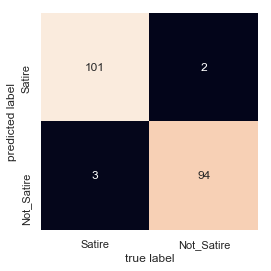

In [77]:
from sklearn.metrics import confusion_matrix
import seaborn as sns; sns.set()


mat = confusion_matrix(y_test_lem, rf_test_preds_lem)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=['Satire', 'Not_Satire'], yticklabels=['Satire', 'Not_Satire'])
plt.xlabel('true label')
plt.ylabel('predicted label');

### Some corpus statistics:

In [78]:
non_zero_cols = tfidf_data_train_lem.nnz / float(tfidf_data_train_lem.shape[0])
print("Average Number of Non-Zero Elements in Vectorized Articles: {}".format(non_zero_cols))

percent_sparse = 1 - (non_zero_cols / float(tfidf_data_train_lem.shape[1]))
print('Percentage of columns containing 0: {}'.format(percent_sparse))

Average Number of Non-Zero Elements in Vectorized Articles: 167.85875
Percentage of columns containing 0: 0.99234849348163


#### Most frequent words:

In [79]:
df_freq_satire = df[df['target']==1]
df_freq_not_satire = df[df['target']==0]

In [80]:
data_sat = df_freq_satire['body']
data_not_sat = df_freq_not_satire['body']

In [81]:
pros_satire = list(map(process_article, data_sat))
pros_not_satire = list(map(process_article, data_not_sat))

In [82]:
total_vocab_sat = set()
for comment in pros_satire:
    total_vocab_sat.update(comment)
len(total_vocab_sat)

19090

In [83]:
total_vocab_NOT_sat = set()
for comment in pros_not_satire:
    total_vocab_NOT_sat.update(comment)
len(total_vocab_NOT_sat)

15186

In [84]:
# We will need this for later:

# flat_list = [item for sublist in l for item in sublist]
flat_satire = [item for sublist in pros_satire for item in sublist]
flat_not_satire = [item for sublist in pros_not_satire for item in sublist]

In [85]:
satire_freq = FreqDist(flat_satire)
not_satire_freq = FreqDist(flat_not_satire)

In [86]:
# satire_freq.most_common(20)
# not_satire_freq.most_common(20)

#### Normalized word frequencies:

In [87]:
satire_total_word_count = sum(satire_freq.values())
satire_top_25 = satire_freq.most_common(25)
print("Word \t\t Normalized Frequency")
print()
for word in satire_top_25:
    normalized_frequency = word[1]/satire_total_word_count
    print("{} \t\t {:.4}".format(word[0], normalized_frequency))

Word 		 Normalized Frequency

people 		 0.005193
eu 		 0.005013
would 		 0.004825
may 		 0.004319
like 		 0.004062
even 		 0.003556
time 		 0.003265
many 		 0.003256
get 		 0.002965
also 		 0.002965
brexit 		 0.002879
britain 		 0.002674
world 		 0.002579
way 		 0.002477
well 		 0.002477
new 		 0.002408
see 		 0.002314
every 		 0.002245
right 		 0.002194
us 		 0.002151
much 		 0.002074
however 		 0.002048
could 		 0.00204
trump 		 0.002022
theresa 		 0.001945


In [88]:
not_satire_total_word_count = sum(not_satire_freq.values())
not_satire_top_25 = not_satire_freq.most_common(25)
print("Word \t\t Normalized Frequency")
print()
for word in not_satire_top_25:
    normalized_frequency = word[1]/not_satire_total_word_count
    print("{} \t\t {:.4}".format(word[0], normalized_frequency))

Word 		 Normalized Frequency

u.s. 		 0.00615
trump 		 0.005622
government 		 0.005266
would 		 0.004774
president 		 0.004702
people 		 0.003544
state 		 0.003326
year 		 0.003061
told 		 0.003025
new 		 0.002952
security 		 0.002934
also 		 0.002907
last 		 0.002907
two 		 0.002815
united 		 0.002743
reuters 		 0.002688
could 		 0.002679
china 		 0.002579
country 		 0.002542
percent 		 0.002497
since 		 0.002342
states 		 0.002269
monday 		 0.002251
house 		 0.002241
police 		 0.002077


#### Let's visualize it:

In [89]:
satire_bar_counts = [x[1] for x in satire_freq.most_common(20)]
satire_bar_words = [x[0] for x in satire_freq.most_common(20)]

not_satire_bar_counts = [x[1] for x in not_satire_freq.most_common(20)]
not_satire_bar_words = [x[0] for x in not_satire_freq.most_common(20)]

In [90]:
from matplotlib import cm
color = cm.viridis_r(np.linspace(.4,.8, 30))

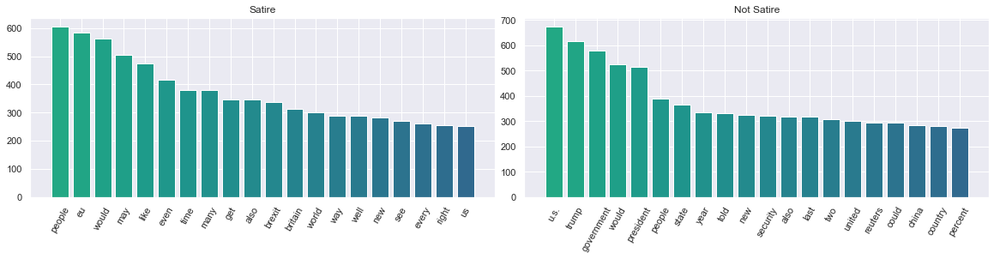

In [91]:
new_figure = plt.figure(figsize=(16,4))

ax = new_figure.add_subplot(121)
ax2 = new_figure.add_subplot(122)

# Generate a line plot on first axes
ax.bar(satire_bar_words, satire_bar_counts, color=color)
# ax.plot(colormap='PRGn')

# Draw a scatter plot on 2nd axes
ax2.bar(not_satire_bar_words, not_satire_bar_counts, color=color )

ax.title.set_text('Satire')
ax2.title.set_text('Not Satire')

for ax in new_figure.axes:
    plt.sca(ax)
    plt.xticks(rotation=60)

plt.tight_layout(pad=0)

# plt.savefig('word count bar graphs.png')

plt.show()

In [92]:
# !pip install wordcloud

In [93]:
# Getting our data into a dictionary
# dictionary = dict(zip(keys, values))

satire_dictionary = dict(zip(satire_bar_words, satire_bar_counts))
not_satire_dictionary = dict(zip(not_satire_bar_words, not_satire_bar_counts))

In [94]:
# satire_dictionary

In [95]:
from wordcloud import WordCloud

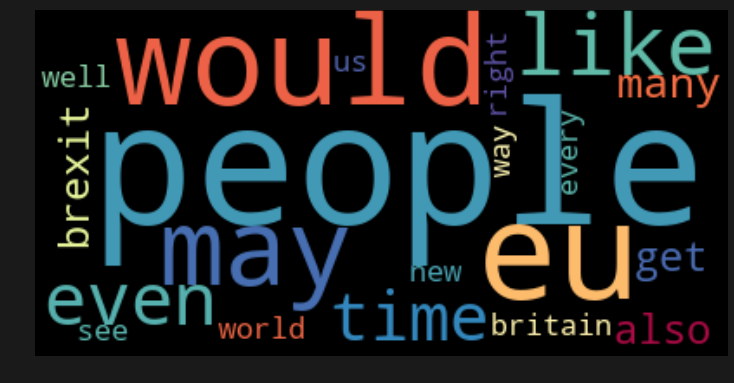

In [96]:
wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(satire_dictionary)

# Display the generated image:
# the matplotlib way:
# import matplotlib.pyplot as plt
plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
# plt.savefig('satire_wordcloud.png')

plt.show()

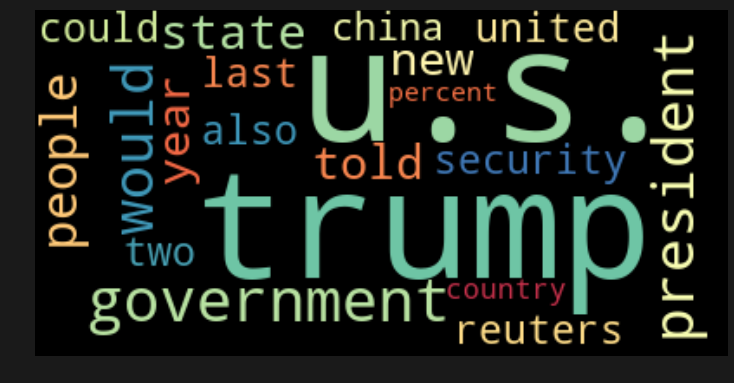

In [97]:
wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(not_satire_dictionary)

# Display the generated image:
# the matplotlib way:
# import matplotlib.pyplot as plt
plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
# plt.savefig('not_satire_wordcloud.png')
# plt.savefig('wordcloud_test.png', facecolor='k', bbox_inches='tight')

plt.show()

## Bi-grams:

#### Creating Bigrams:

Knowing individual word frequencies is somewhat informative, but in practice, some of these tokens are actually parts of larger phrases that should be treated as a single unit. Let's create some bigrams, and see which combinations of words are most telling.

In the cells below:

* We'll begin by aliasing a particularly long method name to make it easier to call. Store `nltk.collocations.BigramAssociationMeasures()` inside of the variable `bigram_measures`.
* Next, we'll need to create a **_finder_**. Pass `flat_satire` into `BigramCollocationFinder.from_words()` and store the result returned inside of `satire_finder`.
* Once we have a finder, we can use it to compute bigram scores, so we can see the combinations that occur most frequently. Call the `satire_finder` object's `score_ngrams()` method and pass in `bigram_measures.raw_freq` as the input. 
* Display first 50 elements in the `satire_scored` list to see the 50 most common bigrams in satire. 
* Do the same for `flat_not_satire`

In [98]:
satire_bigram_measures = nltk.collocations.BigramAssocMeasures()
satire_finder = BigramCollocationFinder.from_words(flat_satire)
satire_scored = satire_finder.score_ngrams(satire_bigram_measures.raw_freq)

In [99]:
satire_scored[:10]

[(('theresa', 'may'), 0.0018681657697185753),
 (('prime', 'minister'), 0.0010112089946183115),
 (('right', 'hon'), 0.0005141740650601584),
 (('social', 'media'), 0.0005056044973091558),
 (('daily', 'squib'), 0.0004798957940561478),
 (('donald', 'trump'), 0.00044561752305213723),
 (('hon', 'friend'), 0.00041990881979912933),
 (('even', 'though'), 0.0004113392520481267),
 (('jeremy', 'corbyn'), 0.00038563054879511876),
 (('united', 'states'), 0.00035135227779110824)]

In [100]:
not_satire_bigram_measures = nltk.collocations.BigramAssocMeasures()
not_satire_finder = BigramCollocationFinder.from_words(flat_not_satire)
not_satire_scored = not_satire_finder.score_ngrams(not_satire_bigram_measures.raw_freq)

In [101]:
not_satire_scored[:10]

[(('united', 'states'), 0.0020227606126595656),
 (('donald', 'trump'), 0.0012391686636112655),
 (('president', 'donald'), 0.001193610992154969),
 (('white', 'house'), 0.00104782644349482),
 (('15', 'minutes'), 0.0010113803063297828),
 (('last', 'year'), 0.0010022687720385236),
 (('2019', 'reuters'), 0.0009931572377472643),
 (('complete', 'list'), 0.0009931572377472643),
 (('delayed', 'minimum'), 0.0009931572377472643),
 (('delays', '©'), 0.0009931572377472643)]

### mutual info scores

These look a bit more interesting. We can see here that some of the most common ones are stage directions, such as 'Enter Macbeth' and 'Exeunt Scena', while others seem to be common phrases used in the play. 

To wrap up our initial examination of _Satire_, let's end by calculating **_Mutual Information Scores_**.

#### Using Mutual Information Scores

To calculate Mutual Information Scores, we'll need to first create a frequency filter, so that we only examine bigrams that occur more than a set number of times--for our purposes, we'll set this limit to 5. 

In NLTK, mutual information is often referred to as `pmi`, for **_Pointwise Mutual Information_**. Calculating PMI scores works much the same way that we created bigrams, with a few notable differences.

In the cell below:

* We'll start by creating another finder for pmi. Create another `BigramCollocationFinder.from_words` and pass in `flat_satire` as the input. Store this is the variable `satire_pmi_finder`.
* Once we have our finder, we'll need to apply our frequency filter. Call `satire_pmi_finder`'s `apply_freq_filter` and pass in the number `5` as the input. 
* Now, we can use the finder to calculate pmi scores. Use the pmi finder's `.score_ngrams()` function, and pass in `bigram_measures.pmi` as the argument. Store this in `satire_pmi_scored`.
* Examine the first 50 elements in `satire_pmi_scored`.
* Do the same for `flat_not_satire`

In [102]:
satire_pmi_finder = BigramCollocationFinder.from_words(flat_satire)
satire_pmi_finder.apply_freq_filter(5)
satire_pmi_scored = satire_pmi_finder.score_ngrams(satire_bigram_measures.pmi)

In [103]:
satire_pmi_scored[:15]

[(('skid', 'row'), 14.24738363196792),
 (('anna', 'soubry'), 14.024991210631473),
 (('priti', 'patel'), 14.024991210631473),
 (('hans', 'soylo'), 13.832346132689075),
 (('michel', 'barnier'), 13.832346132689075),
 (('gon', 'na'), 13.662421131246763),
 (('kim', 'jong-un'), 13.662421131246763),
 (('octopus', 'grip'), 13.510418037801717),
 (('48', 'hrs'), 13.510418037801713),
 (('los', 'angeles'), 13.37291451405178),
 (('knackers', 'yard'), 13.372914514051779),
 (('echo', 'chamber'), 13.24738363196792),
 (('margaret', 'thatcher'), 13.24738363196792),
 (('tiffany', 'haddish'), 13.24738363196792),
 (('winston', 'churchill'), 13.24738363196792)]

In [104]:
not_satire_pmi_finder = BigramCollocationFinder.from_words(flat_not_satire)
not_satire_pmi_finder.apply_freq_filter(5)
not_satire_pmi_scored = not_satire_pmi_finder.score_ngrams(not_satire_bigram_measures.pmi)

In [105]:
not_satire_pmi_scored[:15]

[(('gerauds', 'wilfried'), 14.42194646453531),
 (('nakhon', 'si'), 14.42194646453531),
 (('si', 'thammarat'), 14.42194646453531),
 (('srey', 'heng'), 14.42194646453531),
 (('anak', 'krakatau'), 14.158912058701514),
 (('mick', 'mulvaney'), 14.158912058701514),
 (('guy-bertrand', 'mapangou'), 13.936519637365066),
 (('sar-e', 'pul'), 13.936519637365066),
 (('zaw', 'htay'), 13.936519637365066),
 (('corneille', 'nangaa'), 13.743874559422672),
 (('santos', 'cruz'), 13.743874559422672),
 (('andres', 'manuel'), 13.743874559422668),
 (('bharatiya', 'janata'), 13.743874559422668),
 (('koh', 'samui'), 13.714127216028619),
 (('jia', 'kurd'), 13.57394955798036)]